# **DETECCIÓN DE CARGA COGNITIVA USANDO MODELOS DE INTELIGENCIA ARTIFICIAL**

- Base de datos : UAB
- Autor : Daniel Llopis Conejo
- Universidad Politécnica de Madrid

La carga cognitiva, entendida como el nivel de esfuerzo mental requerido para realizar tareas complejas, puede afectar significativamente el rendimiento y la seguridad en entornos críticos como la aviación. En este contexto, es esencial contar con herramientas capaces de detectar en tiempo real cuándo un individuo se encuentra sometido a un alto nivel de exigencia cognitiva, para así prevenir errores y optimizar la toma de decisiones.

Este notebook utiliza como referencia un dataset recientemente publicado por Hernández-Sabaté et al. (2024), que recopila señales electroencefalográficas (EEG) obtenidas en distintos escenarios experimentales con niveles de carga cognitiva inducidos mediante tareas controladas. Concretamente, el dataset incluye datos obtenidos durante la realización del test N-back, el juego “Heat-the-Chair”, y diferentes simulaciones de vuelo en cabina de un Airbus A-320.

Nuestro objetivo es aprovechar estos datos para desarrollar y evaluar un modelo de inteligencia artificial que permita identificar, a partir de señales EEG y ECG, cuándo un individuo está experimentando una carga cognitiva elevada. Esto podría contribuir significativamente a mejorar la seguridad operacional y optimizar el desempeño en actividades altamente demandantes desde el punto de vista mental.

## CARGA DE LOS DATOS

El dataset utilizado está organizado en tres experimentos distintos, cada uno diseñado para inducir diferentes niveles de carga cognitiva. Debido a las diferencias en estructura y contenido de los datos recopilados en cada experimento, procederemos a cargar y gestionar cada conjunto por separado, asegurando una manipulación y análisis adecuados:

1. Test N-back:
Los datos de este experimento contienen señales EEG registradas durante tres tareas con niveles incrementales de carga cognitiva (baja, media y alta). Además, incluyen información adicional, como puntuaciones obtenidas por los participantes y resultados del cuestionario NASA-TLX sobre carga percibida. La carga se realizará mediante el archivo eeg.parquet, usando bibliotecas estándar como Pandas para facilitar su posterior tratamiento en Python.

2. Juego “Heat-the-Chair”:
Este conjunto incluye señales EEG obtenidas mientras los participantes realizaban un juego diseñado específicamente para replicar escenarios multitarea típicos en pilotos. Al igual que en el caso anterior, también se incluyen puntuaciones del juego y respuestas al cuestionario NASA-TLX. Utilizaremos nuevamente archivos en formato parquet (e.g., eeg.parquet) junto a archivos CSV que contienen la información específica de rendimiento por sujeto y modalidad del juego (con o sin interrupciones).

3. Simulador de vuelo:
Este conjunto representa datos obtenidos directamente desde una cabina simulada de Airbus A-320, capturando la actividad EEG de pilotos profesionales enfrentados a escenarios reales y situaciones imprevistas durante vuelos simulados. Estos datos incluyen información detallada sobre la carga cognitiva percibida por los pilotos a lo largo del tiempo. La información está almacenada en formato parquet (eeg.parquet), complementada por archivos JSON que describen la dificultad percibida en distintos momentos del vuelo.

La decisión de cargar y gestionar cada conjunto de datos individualmente permitirá realizar un análisis específico y ajustar los modelos de inteligencia artificial a las particularidades propias de cada experimento. Esto facilitará la transferencia del conocimiento adquirido entre tareas y mejorará la precisión en la detección automática de situaciones con alta carga cognitiva.

In [10]:
import os
import glob
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools
from scipy.signal import iirnotch, butter, filtfilt, decimate, welch
from sklearn.decomposition import FastICA
from scipy.stats import kurtosis, skew
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [3]:
# Funciones para leer cada tipo de archivo
def leer_parquet(ruta):
    return pd.read_parquet(ruta)

def leer_csv(ruta):
    return pd.read_csv(ruta)

def leer_json(ruta):
    with open(ruta, 'r', encoding='utf-8') as archivo:
        return json.load(archivo)

# Directorio base de la base de datos
base_dir = "/Users/danillopis/Desktop/TFG/UAB/workload_dataset"

In [4]:
# Lectura de datos: Flight Simulation
flight_sim_dir = os.path.join(base_dir, "data_flight_simulator")

# ECG: ecg_hr.parquet y ecg_ibi.parquet
ecg_hr_path = os.path.join(flight_sim_dir, "ecg", "ecg_hr.parquet")
ecg_ibi_path = os.path.join(flight_sim_dir, "ecg", "ecg_ibi.parquet")
df_ecg_hr = leer_parquet(ecg_hr_path)
df_ecg_ibi = leer_parquet(ecg_ibi_path)

# EEG: eeg.parquet
eeg_path = os.path.join(flight_sim_dir, "eeg", "eeg.parquet")
df_eeg = leer_parquet(eeg_path)

# Perceived difficulty (archivos JSON)
json_dir = os.path.join(flight_sim_dir, "perceived_difficulty")
json_files = ["flight_1.json", "flight_2_4.json", "flight_3_5.json"]
perceived_difficulty = {}
for jf in json_files:
    ruta_json = os.path.join(json_dir, jf)
    perceived_difficulty[jf] = leer_json(ruta_json)

In [4]:
# Lectura de datos: Heat-the-Chair
htc_dir = os.path.join(base_dir, "data_heat_the_chair")

# ECG: ecg.parquet
ecg_htc_path = os.path.join(htc_dir, "ecg", "ecg.parquet")
df_ecg_htc = leer_parquet(ecg_htc_path)

# EEG: eeg.parquet
eeg_htc_path = os.path.join(htc_dir, "eeg", "eeg.parquet")
df_eeg_htc = leer_parquet(eeg_htc_path)

# Game performance (archivos CSV)
game_perf_dir = os.path.join(htc_dir, "game_performance")
csv_files = glob.glob(os.path.join(game_perf_dir, "*.csv"))
game_performance = {}
for archivo in csv_files:
    nombre = os.path.basename(archivo)
    game_performance[nombre] = leer_csv(archivo)

# Subjective performance: tlx_answers.parquet
subjective_htc_path = os.path.join(htc_dir, "subjective_performance", "tlx_answers.parquet")
df_subjective_htc = leer_parquet(subjective_htc_path)

In [5]:
# Lectura de datos: N-back test
nback_dir = os.path.join(base_dir, "data_n_back_test")

# ECG: ecg_br.parquet, ecg_hr.parquet y ecg_ibi.parquet
ecg_br_path = os.path.join(nback_dir, "ecg", "ecg_br.parquet")
ecg_hr_nback_path = os.path.join(nback_dir, "ecg", "ecg_hr.parquet")
ecg_ibi_nback_path = os.path.join(nback_dir, "ecg", "ecg_ibi.parquet")
df_ecg_br = leer_parquet(ecg_br_path)
df_ecg_hr_nback = leer_parquet(ecg_hr_nback_path)
df_ecg_ibi_nback = leer_parquet(ecg_ibi_nback_path)

# EEG: eeg.parquet
eeg_nback_path = os.path.join(nback_dir, "eeg", "eeg.parquet")
df_eeg_nback = leer_parquet(eeg_nback_path)

# Game performance: game_scores.parquet
game_scores_path = os.path.join(nback_dir, "game_performance", "game_scores.parquet")
df_game_scores = leer_parquet(game_scores_path)

# Subjective performance: tlx_answers.parquet
subjective_nback_path = os.path.join(nback_dir, "subjective_performance", "tlx_answers.parquet")
df_subjective_nback = leer_parquet(subjective_nback_path)

Ahora procederemos a visualizar los dataframes de EEG y ECG obtenidos a partir de los archivos para cada uno de los experimentos.

In [6]:
# Muestra de datos leídos
print("Flight Simulation - EEG:")
print(df_eeg.head(), "\n")

print("Flight Simulation - ECG HR:")
print(df_ecg_hr.head(), "\n")

print("Heat-the-Chair - ECG:")
print(df_ecg_htc.head(), "\n")

print("Heat-the-Chair - EEG:")
print(df_eeg_htc.head(), "\n")

print("N-back Test - EEG:")
print(df_eeg_nback.head(), "\n")

print("N-back Test - ECG:")
print(df_ecg_ibi_nback .head(), "\n")

Flight Simulation - EEG:
      timestamp  EEG.Counter  EEG.Interpolated      EEG.AF3       EEG.F7  \
0  1.608630e+09          100                 0  4207.692383  4216.410156   
1  1.608630e+09          101                 0  4194.871582  4198.974121   
2  1.608630e+09          102                 0  4200.512695  4200.000000   
3  1.608630e+09          103                 0  4178.461426  4181.025879   
4  1.608630e+09          104                 0  4170.769043  4175.384766   

        EEG.F3      EEG.FC5       EEG.T7       EEG.P7       EEG.O1  ...  \
0  4190.256348  4209.743652  4228.717773  4200.000000  4204.615234  ...   
1  4218.461426  4192.820312  4184.615234  4185.641113  4194.871582  ...   
2  4191.794922  4196.410156  4183.589844  4199.487305  4202.563965  ...   
3  4193.846191  4174.871582  4186.153809  4191.794922  4186.153809  ...   
4  4208.205078  4170.769043  4187.179688  4186.153809  4182.563965  ...   

   POW.AF4.BetaL  POW.AF4.BetaH  POW.AF4.Gamma                   da

Cómo podemos observar, los datos de ECG en Heat-the-Chair parecen confusos y tenemos numerosas columnas con 'NaN', por lo que este experimento puede no ser el óptimo para nuestro caso en concreto. En "N-back" y en "Flight Simulation" los datos parecen estar completos y bien estructurados. Por ello y dado el contexto de estudio, nos quedaremos en un primer momento con los datos relacionados con el experimento **"Flight Simulation"**.

## **Experimento 3 : FLIGHT SIMULATION**

Ya disponemos de los datos (.parquet y .json inicialmente) en dataframes y un diccionario (datos EEG-ECG y dificultad percivida respectivamente). Procedemos entonces a analizarlos más detenidamente. 

### **ANÁLISIS EXPLORATORIO (EDO)**

#### **Resumen de los datasets**

En primer lugar, buscamos conocer exactamente la estructura de nuestros datasets, así cómo una pequeña visualización y sus estadísticas descriptivas.

In [7]:
print("Forma del DataFrame ECG (Heart Rate):", df_ecg_hr.shape)
print("Forma del DataFrame ECG (IBI):", df_ecg_ibi.shape)
print("Forma del DataFrame EEG:", df_eeg.shape)

Forma del DataFrame ECG (Heart Rate): (13291, 8)
Forma del DataFrame ECG (IBI): (13291, 8)
Forma del DataFrame EEG: (735769, 146)


In [8]:
print("\nPrimeras filas de ECG Heart Rate:")
df_ecg_hr.head()


Primeras filas de ECG Heart Rate:


,subject,flight,phase,timestamp,datetime,hr,perceived_difficulty,theoretical_difficulty
0,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,89.302326,-1,-1
1,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,96.300940,-1,-1
2,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,99.417476,-1,-1
3,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,99.096774,-1,-1
4,2,1,baseline,1.608629e+12,2020-12-22 10:20:35,102.400000,-1,-1


In [9]:
print("\nPrimeras filas de ECG IBI:")
df_ecg_ibi.head()


Primeras filas de ECG IBI:


,subject,flight,phase,timestamp,datetime,rr_int,perceived_difficulty,theoretical_difficulty
0,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,671.875000,-1,-1
1,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,623.046875,-1,-1
2,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,603.515625,-1,-1
3,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,605.468750,-1,-1
4,2,1,baseline,1.608629e+12,2020-12-22 10:20:35,585.937500,-1,-1


In [10]:
print("\nPrimeras filas de EEG:")
df_eeg.head()


Primeras filas de EEG:


,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,POW.AF4.BetaL,POW.AF4.BetaH,POW.AF4.Gamma,datetime,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight
0,1.608630e+09,100,0,4207.692383,4216.410156,4190.256348,4209.743652,4228.717773,4200.000000,4204.615234,...,NaN,NaN,NaN,2020-12-22 10:38:58.234317,2,flying,1,1,flight,1
1,1.608630e+09,101,0,4194.871582,4198.974121,4218.461426,4192.820312,4184.615234,4185.641113,4194.871582,...,NaN,NaN,NaN,2020-12-22 10:38:58.242099,2,flying,1,1,flight,1
2,1.608630e+09,102,0,4200.512695,4200.000000,4191.794922,4196.410156,4183.589844,4199.487305,4202.563965,...,NaN,NaN,NaN,2020-12-22 10:38:58.249981,2,flying,1,1,flight,1
3,1.608630e+09,103,0,4178.461426,4181.025879,4193.846191,4174.871582,4186.153809,4191.794922,4186.153809,...,NaN,NaN,NaN,2020-12-22 10:38:58.257764,2,flying,1,1,flight,1
4,1.608630e+09,104,0,4170.769043,4175.384766,4208.205078,4170.769043,4187.179688,4186.153809,4182.563965,...,NaN,NaN,NaN,2020-12-22 10:38:58.265646,2,flying,1,1,flight,1


In [11]:
df = df_eeg.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
    
    # Agrupar por segundo
df['second'] = df['datetime'].dt.floor('S')
counts = df.groupby('second').size()
    
    # Mostrar resumen de las cuentas
print("📊 Estadísticas de muestras por segundo:")
print(counts.describe(), end='\n\n')
    
    # Identificar segundos con conteo distinto de 256
bad = counts[counts != 256]
if bad.empty:
    print("✅ Todos los segundos contienen exactamente 256 muestras.")
else:
    print("⚠️ Segundos con número de muestras distinto de 256:")
    print(bad)

📊 Estadísticas de muestras por segundo:
count    5848.000000
mean      125.815492
std         9.398881
min         1.000000
25%       126.000000
50%       127.000000
75%       127.000000
max       135.000000
dtype: float64

⚠️ Segundos con número de muestras distinto de 256:
second
2020-12-22 10:38:58     98
2020-12-22 10:38:59    127
2020-12-22 10:39:00    126
2020-12-22 10:39:01    126
2020-12-22 10:39:02    127
                      ... 
2020-12-22 13:08:36    128
2020-12-22 13:08:37    127
2020-12-22 13:08:38    127
2020-12-22 13:08:39    127
2020-12-22 13:08:40    111
Length: 5848, dtype: int64


Para obtener una visión preliminar de los datos, revisamos las primeras filas y las características principales de cada dataset:

- EEG: Cuenta con 735.769 registros y 146 columnas.
- ECG(HR): Cuenta con 13.291 registros y 8 columnas.
- ECG(IBI): Cuenta con 13.291 registros y también 8 columnas.

Como podemos observar, tenemos muchos más registros de EEG que de ECG. Además, nos damos cuenta de que los dos datasets relacionados con ECG parecen idénticos salvo que en uno se muestra el HR y en otro el RR. 

Por último, cabe destacar que en las columnas POW aparecen muchos NaN's (valores faltantes), objeto de estudio.

Procedemos a realizar un análisis más profundo de ambos datasets

#### **Estructura de los datos y tipos de variables**

El siguiente paso es profundizar en la estructura de los datos y los tipos de variables que contienen. Esto nos ayuda a:

- **Identificar Variables Disponibles:** Ver qué información está presente en todos los datasets, como identificadores de pacientes, timestamps, indicadores de fases/experimetnos, datos recogidos por los sensores...
- **Confirmar Tipos de Datos:** Asegurarnos de que las columnas tengan los tipos de datos correctos (números, fechas, texto) para evitar problemas en el análisis.
- **Detectar Problemas Iniciales:** Encontrar valores faltantes, inconsistencias en el formato y posibles valores atípicos que puedan afectar los resultados.

In [12]:
print("EEG Info:")
print(df_eeg.info())

EEG Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 735769 entries, 0 to 735768
Columns: 146 entries, timestamp to flight
dtypes: datetime64[us](1), float32(121), int16(1), int32(2), int64(2), int8(17), object(2)
memory usage: 386.6+ MB
None


In [13]:
# Seleccionar columnas por tipo
object_columns = df_eeg.select_dtypes(include=['object']).columns.tolist()
int16_columns = df_eeg.select_dtypes(include=['int16']).columns.tolist()
int32_columns = df_eeg.select_dtypes(include=['int32']).columns.tolist()
int64_columns = df_eeg.select_dtypes(include=['int64']).columns.tolist()
int8_columns  = df_eeg.select_dtypes(include=['int8']).columns.tolist()

# Imprimir resultados
print("\nColumnas de tipo object:")
print(object_columns)

print("\nColumnas de tipo int16 (cantidad: {}):".format(len(int16_columns)))
print(int16_columns)

print("\nColumnas de tipo int32 (cantidad: {}):".format(len(int32_columns)))
print(int32_columns)

print("\nColumnas de tipo int64 (cantidad: {}):".format(len(int64_columns)))
print(int64_columns)

print("\nColumnas de tipo int8 (cantidad: {}):".format(len(int8_columns)))
print(int8_columns)


Columnas de tipo object:
['role', 'phase']

Columnas de tipo int16 (cantidad: 1):
['EEG.Counter']

Columnas de tipo int32 (cantidad: 2):
['subject', 'flight']

Columnas de tipo int64 (cantidad: 2):
['perceived_difficulty', 'theoretical_difficulty']

Columnas de tipo int8 (cantidad: 17):
['EEG.Interpolated', 'EEG.Battery', 'EEG.MarkerHardware', 'CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4']


In [14]:
print("\nECG(HR) Info:")
print(df_ecg_hr.info())


ECG(HR) Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13291 entries, 0 to 13290
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   subject                 13291 non-null  int64         
 1   flight                  13291 non-null  int32         
 2   phase                   13291 non-null  object        
 3   timestamp               13291 non-null  float64       
 4   datetime                13291 non-null  datetime64[us]
 5   hr                      13291 non-null  float64       
 6   perceived_difficulty    13291 non-null  int64         
 7   theoretical_difficulty  13291 non-null  int64         
dtypes: datetime64[us](1), float64(2), int32(1), int64(3), object(1)
memory usage: 778.9+ KB
None


In [15]:
print("\nECG(IBI) Info:")
print(df_ecg_ibi.info())


ECG(IBI) Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13291 entries, 0 to 13290
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   subject                 13291 non-null  int64         
 1   flight                  13291 non-null  int32         
 2   phase                   13291 non-null  object        
 3   timestamp               13291 non-null  float64       
 4   datetime                13291 non-null  datetime64[us]
 5   rr_int                  13291 non-null  float64       
 6   perceived_difficulty    13291 non-null  int64         
 7   theoretical_difficulty  13291 non-null  int64         
dtypes: datetime64[us](1), float64(2), int32(1), int64(3), object(1)
memory usage: 778.9+ KB
None


De los tipos de datos podemos observar que : 

- El timestamp de los ECG es un float64, mientras que en el EEG es un float32 (a priori).
- El datetime es igual en los 3 datasets -> datetime64[us]
- La mayoría de los datos en EEG son float64, aunque tambien hay int8-64 y dos variables de tipo object
- En los dos datasets de ECG observamos los mismos tipos de variables en las mismas variables, cosa muy a favor para agilizar nuestro preprocesamiento y estudiar un posible merge de ambos. 

In [16]:
print("\nEstadísticas descriptivas de ECG Heart Rate:")
print(df_ecg_hr.describe())

print("\nEstadísticas descriptivas de ECG IBI:")
print(df_ecg_ibi.describe())

print("\nEstadísticas descriptivas de EEG:")
print(df_eeg.describe())


Estadísticas descriptivas de ECG Heart Rate:
            subject        flight     timestamp                    datetime  \
count  13291.000000  13291.000000  1.329100e+04                       13291   
mean       1.636596      2.869837  1.024635e+12  2020-12-22 12:00:21.044341   
min        1.000000      1.000000  1.608633e+09         2020-12-22 10:20:33   
25%        1.000000      2.000000  1.608637e+09  2020-12-22 11:44:02.918498   
50%        2.000000      3.000000  1.608630e+12  2020-12-22 12:07:37.627998   
75%        2.000000      4.000000  1.608635e+12         2020-12-22 12:44:38   
max        2.000000      5.000000  1.608639e+12  2020-12-22 13:08:40.410002   
std        0.480998      1.503315  7.729757e+11                         NaN   

                 hr  perceived_difficulty  theoretical_difficulty  
count  13291.000000          13291.000000            13291.000000  
mean      92.174005              1.182229                1.166278  
min       35.432526             -1.000

Las estadísticas descriptivas de los 3 datasets presentan valores razonables con lo que ya sabíamos. La única cosa que nos puede saltar a la vista son los -1, pero simepre se dan en las varibales relacionadas con la dificultad, y como leímos en el paper, -1 es un valor válido y relacionado con la "etapa base" en la percibida y un valor válido también en la teórica (la menor dificultad).

También observamos para aquellas columnas cuyos dominios ya estaban definidos, como por ejemplo "subject ([1,2])" a priori cumplen con ello. 

Además, veo muy razonable destacar que las estadísticas de datetime para los 3 datasets, fijándonos especialmente en que las fechas coinciden y que respecto a las horas los mínimos (~12:00) y los máximos (~13:08) son prácticamente las mismas, lo que nos dice que se ha llevado a cabo una correcta medición y coordinación de los 3 experimentos, independientemente del artefacto utilizado. Se produce entonces la verificación de la sincronización temporal, más concretamente:

In [17]:
# Aseguramos que la columna 'datetime' esté en formato datetime
df_eeg['datetime'] = pd.to_datetime(df_eeg['datetime'])
df_ecg_hr['datetime'] = pd.to_datetime(df_ecg_hr['datetime'])
df_ecg_ibi['datetime'] = pd.to_datetime(df_ecg_ibi['datetime'])

print("----- Sincronización Temporal -----")
print("EEG - Mínimo datetime:", df_eeg['datetime'].min())
print("EEG - Máximo datetime:", df_eeg['datetime'].max())
print("ECG (HR) - Mínimo datetime:", df_ecg_hr['datetime'].min())
print("ECG (HR) - Máximo datetime:", df_ecg_hr['datetime'].max())
print("ECG (IBI) - Mínimo datetime:", df_ecg_ibi['datetime'].min())
print("ECG (IBI) - Máximo datetime:", df_ecg_ibi['datetime'].max())

----- Sincronización Temporal -----
EEG - Mínimo datetime: 2020-12-22 10:38:58.234317
EEG - Máximo datetime: 2020-12-22 13:08:40.872047
ECG (HR) - Mínimo datetime: 2020-12-22 10:20:33
ECG (HR) - Máximo datetime: 2020-12-22 13:08:40.410002
ECG (IBI) - Mínimo datetime: 2020-12-22 10:20:33
ECG (IBI) - Máximo datetime: 2020-12-22 13:08:40.410002


###### **Análisis por sujeto**

In [18]:
df_subj1 = df_eeg[df_eeg['subject'] == 1]
print("Rango de tiempo sujeto 1:", df_subj1['datetime'].min(), df_subj1['datetime'].max())
print("Número de muestras:", len(df_subj1))

Rango de tiempo sujeto 1: 2020-12-22 11:27:45.790989 2020-12-22 12:18:18.321510
Número de muestras: 287911


In [19]:
df_subj2 = df_eeg[df_eeg['subject'] == 2]
print("Rango de tiempo sujeto 2:", df_subj2['datetime'].min(), df_subj2['datetime'].max())
print("Número de muestras:", len(df_subj2))

Rango de tiempo sujeto 2: 2020-12-22 10:38:58.234317 2020-12-22 13:08:40.872047
Número de muestras: 447858


In [20]:
df_subj1 = df_ecg_hr[df_ecg_hr['subject'] == 1]
print("Rango de tiempo sujeto 1:", df_subj1['datetime'].min(), df_subj1['datetime'].max())
print("Número de muestras:", len(df_subj1))

Rango de tiempo sujeto 1: 2020-12-22 11:26:58.711999 2020-12-22 13:08:40.410002
Número de muestras: 4830


In [21]:
df_subj1 = df_ecg_hr[df_ecg_hr['subject'] == 2]
print("Rango de tiempo sujeto 2:", df_subj1['datetime'].min(), df_subj1['datetime'].max())
print("Número de muestras:", len(df_subj1))

Rango de tiempo sujeto 2: 2020-12-22 10:20:33 2020-12-22 13:08:38
Número de muestras: 8461


In [22]:
df_subj1= df_ecg_ibi[df_ecg_ibi['subject'] == 1]
print("Rango de tiempo sujeto 1:", df_subj1['datetime'].min(), df_subj1['datetime'].max())
print("Número de muestras:", len(df_subj1))

Rango de tiempo sujeto 1: 2020-12-22 11:26:58.711999 2020-12-22 13:08:40.410002
Número de muestras: 4830


In [23]:
df_subj2 = df_ecg_ibi[df_ecg_ibi['subject'] == 2]
print("Rango de tiempo sujeto 2:", df_subj2['datetime'].min(), df_subj2['datetime'].max())
print("Número de muestras:", len(df_subj2))

Rango de tiempo sujeto 2: 2020-12-22 10:20:33 2020-12-22 13:08:38
Número de muestras: 8461


LOS DATOS DE EEG PARA EL SUJETO 1 NO SE HAN GRABADO DURANTE TODO EL TIEMPO !!!!!!!

#### **Distribuciones de variables clave**

##### Distribuciones de los datos para EEG

In [24]:
region_upper_left = ["EEG.F7", "EEG.AF3", "EEG.F3", "EEG.FC5"]
region_upper_right = ["EEG.F8", "EEG.AF4", "EEG.F4", "EEG.FC6"]
region_lower_left = ["EEG.T7", "EEG.P7", "EEG.O1"]
region_lower_right = ["EEG.T8", "EEG.P8", "EEG.O2"]

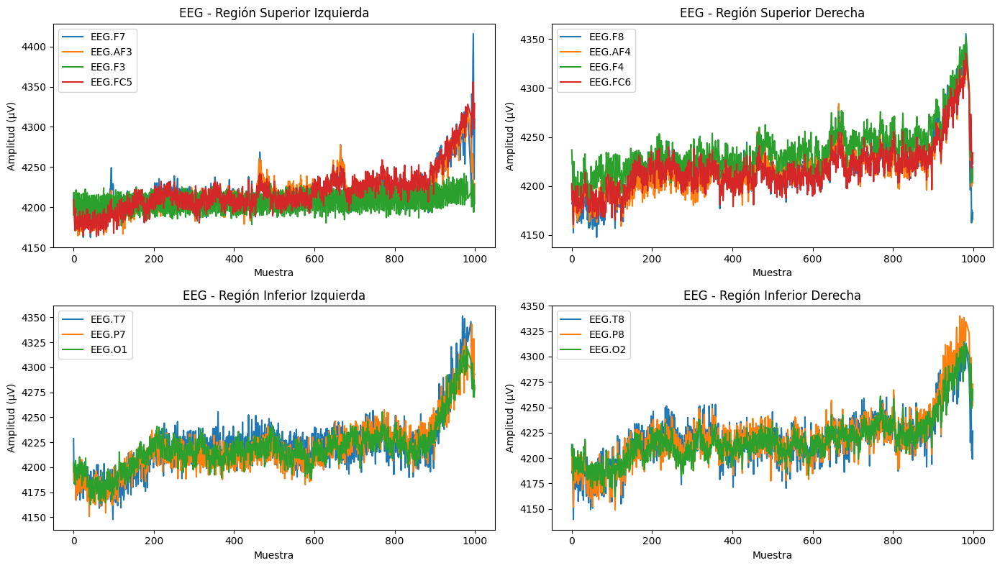

In [25]:
# En este ejemplo graficamos solo las primeras 1000 muestras para no saturar la vista.
n_muestras = 1000

fig, axes = plt.subplots(2, 2, figsize=(14, 8))

# --- Región Superior Izquierda ---
df_temp = df_eeg[region_upper_left].iloc[:n_muestras]
for ch in region_upper_left:
    axes[0, 0].plot(df_temp.index, df_temp[ch], label=ch)
axes[0, 0].set_title("EEG - Región Superior Izquierda")
axes[0, 0].set_xlabel("Muestra")
axes[0, 0].set_ylabel("Amplitud (µV)")
axes[0, 0].legend(loc="best")

# --- Región Superior Derecha ---
df_temp = df_eeg[region_upper_right].iloc[:n_muestras]
for ch in region_upper_right:
    axes[0, 1].plot(df_temp.index, df_temp[ch], label=ch)
axes[0, 1].set_title("EEG - Región Superior Derecha")
axes[0, 1].set_xlabel("Muestra")
axes[0, 1].set_ylabel("Amplitud (µV)")
axes[0, 1].legend(loc="best")

# --- Región Inferior Izquierda ---
df_temp = df_eeg[region_lower_left].iloc[:n_muestras]
for ch in region_lower_left:
    axes[1, 0].plot(df_temp.index, df_temp[ch], label=ch)
axes[1, 0].set_title("EEG - Región Inferior Izquierda")
axes[1, 0].set_xlabel("Muestra")
axes[1, 0].set_ylabel("Amplitud (µV)")
axes[1, 0].legend(loc="best")

# --- Región Inferior Derecha ---
df_temp = df_eeg[region_lower_right].iloc[:n_muestras]
for ch in region_lower_right:
    axes[1, 1].plot(df_temp.index, df_temp[ch], label=ch)
axes[1, 1].set_title("EEG - Región Inferior Derecha")
axes[1, 1].set_xlabel("Muestra")
axes[1, 1].set_ylabel("Amplitud (µV)")
axes[1, 1].legend(loc="best")

plt.tight_layout()
plt.show()

En estos cuatro subplots se han agrupado los 14 canales EEG en función de su posición (región superior izquierda, superior derecha, inferior izquierda e inferior derecha) y se están visualizando las primeras 1000 muestras de cada uno. Algunas observaciones generales:

1.	Diferencias de offset y tendencia
- Se aprecia que, en cada región, los canales tienen valores de amplitud ligeramente distintos, lo que se traduce en diferentes “niveles base” (offset). Es habitual en EEG sin un preprocesado (por ejemplo, sin filtrar en banda ni restar la línea base) que aparezca un desplazamiento DC y posibles tendencias lentas.
- Por ejemplo, en la región superior izquierda (F7, AF3, F3, FC5) la señal sube desde unos 4150–4250 µV hasta rondar 4350 µV. En la región inferior derecha (T8, P8, O2), la amplitud oscila en torno a 4150–4350 µV. Estas variaciones pueden deberse a factores como la conductividad del cuero cabelludo, la calibración del dispositivo o movimientos sutiles del usuario.

2.	Amplitud relativamente alta
- Es normal que en datos brutos de ciertos dispositivos EEG (como los basados en Emotiv) se observen amplitudes con offsets elevados en µV. Antes de interpretar la actividad cerebral real, suele aplicarse un filtrado que elimine las componentes de muy baja frecuencia (drift) y de muy alta frecuencia (ruido), además de técnicas para reducir artefactos (por ejemplo, movimientos musculares o parpadeos).

3.	Similitudes y diferencias dentro de cada región
- En cada subplot, los canales de la misma región tienen patrones parecidos, pero no idénticos. Algunas trazas parecen subir progresivamente, otras mantienen un nivel más estable. Esto puede reflejar diferencias en la colocación de los electrodos o en la actividad registrada sobre distintas áreas corticales.

4.	Necesidad de preprocesamiento
- Para un análisis más profundo, conviene:
	- Aplicar un filtro en banda (por ejemplo, 1–50 Hz) para eliminar el componente DC y el ruido de alta frecuencia.
	- Realizar referenciación (restar un electrodo de referencia o usar referencia promedio).
	- Usar técnicas de detección de artefactos (ICA o métodos automáticos) para descartar o corregir señales contaminadas por parpadeos o movimiento.

5.	Próximos pasos
- Una vez preprocesadas, se pueden extraer características en banda de frecuencias (potencia en theta, alpha, beta, etc.) o estadísticas temporales (varianza, picos, etc.). Estas características se relacionan después con la variable de dificultad percibida, fases de vuelo u otros eventos, con vistas a entrenar un modelo de IA para detectar estados de alta carga cognitiva.

En resumen, los gráficos confirman que cada región tiene una evolución propia y un offset distinto. Es un buen paso inicial de exploración para verificar que todos los canales están registrando señal. El siguiente paso será aplicar un pipeline de preprocesamiento para poder extraer patrones cerebrales más claros y robustos.

In [26]:
# Calculamos la media de cada región por fila (tiempo)
df_eeg['mean_upper_left'] = df_eeg[region_upper_left].mean(axis=1)
df_eeg['mean_upper_right'] = df_eeg[region_upper_right].mean(axis=1)
df_eeg['mean_lower_left'] = df_eeg[region_lower_left].mean(axis=1)
df_eeg['mean_lower_right'] = df_eeg[region_lower_right].mean(axis=1)

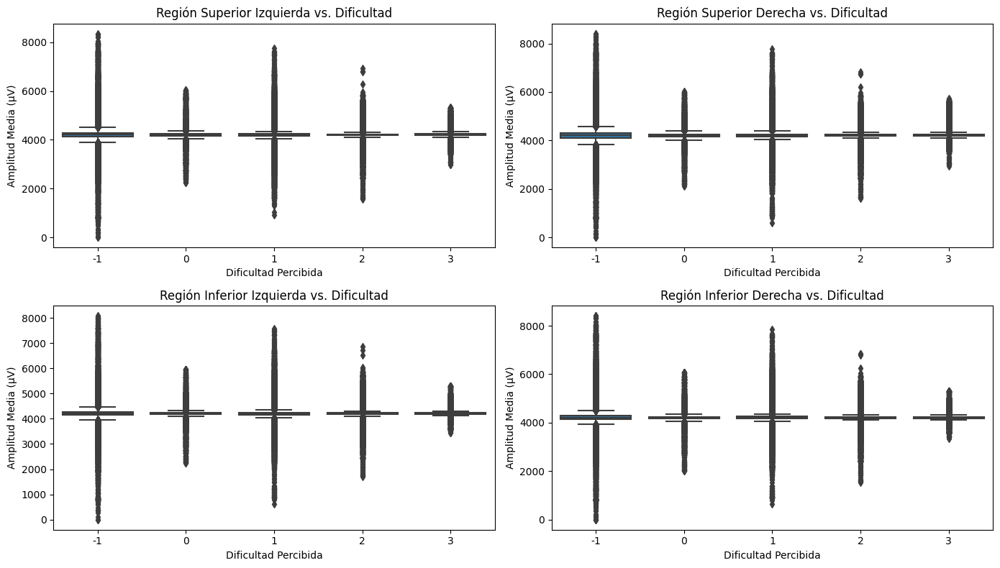

In [27]:
# A modo de ejemplo, un boxplot agrupado por 'perceived_difficulty'
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

sns.boxplot(x='perceived_difficulty', y='mean_upper_left', data=df_eeg, ax=axes[0,0])
axes[0,0].set_title("Región Superior Izquierda vs. Dificultad")
axes[0,0].set_xlabel("Dificultad Percibida")
axes[0,0].set_ylabel("Amplitud Media (µV)")

sns.boxplot(x='perceived_difficulty', y='mean_upper_right', data=df_eeg, ax=axes[0,1])
axes[0,1].set_title("Región Superior Derecha vs. Dificultad")
axes[0,1].set_xlabel("Dificultad Percibida")
axes[0,1].set_ylabel("Amplitud Media (µV)")

sns.boxplot(x='perceived_difficulty', y='mean_lower_left', data=df_eeg, ax=axes[1,0])
axes[1,0].set_title("Región Inferior Izquierda vs. Dificultad")
axes[1,0].set_xlabel("Dificultad Percibida")
axes[1,0].set_ylabel("Amplitud Media (µV)")

sns.boxplot(x='perceived_difficulty', y='mean_lower_right', data=df_eeg, ax=axes[1,1])
axes[1,1].set_title("Región Inferior Derecha vs. Dificultad")
axes[1,1].set_xlabel("Dificultad Percibida")
axes[1,1].set_ylabel("Amplitud Media (µV)")

plt.tight_layout()
plt.show()

En estos gráficos se muestra la amplitud media (µV) de los canales EEG agrupados por región cerebral en función de la dificultad percibida (valores -1, 0, 1, 2 y 3). A simple vista, se pueden extraer algunas observaciones:

1.	Rangos muy amplios y offset elevado
- El eje vertical (amplitud en µV) alcanza valores muy altos (varios miles). Es habitual en datos sin un preprocesado o sin restar el offset del dispositivo. También puede que el fabricante registre la señal con un nivel base (DC offset) que eleve las medidas.
- Las boxplots se ven muy “apretadas” cerca de la mediana, pero con colas y outliers extensos. Esto indica gran variabilidad en la señal.

2.	Diferencias poco claras entre niveles de dificultad
- A nivel de amplitud bruta, no parece haber una separación evidente entre las categorías de dificultad. La mediana y el rango intercuartílico para cada región permanecen en un intervalo similar.
- Esto sugiere que la amplitud cruda, por sí sola, no es un indicador directo de la carga cognitiva. Probablemente necesites características más específicas (p. ej., potencia en bandas de frecuencia, conectividad, etc.) para detectar diferencias asociadas a la dificultad.

3.	Necesidad de preprocesamiento
- Para reducir el offset y la variabilidad, suele aplicarse un pipeline de preprocesamiento que incluya:
    - Filtro en banda (por ejemplo, 1–50 Hz) para eliminar drift y ruido de alta frecuencia.
    - Referenciación (usar un canal de referencia o referencia promedio).
    - Eliminación de artefactos (métodos ICA o detección de picos anómalos).
    - Tras esto, puede extraerse la potencia en bandas (theta, alpha, beta, gamma) o indicadores de sincronización que a menudo se correlacionan mejor con la carga cognitiva.

4.	Interpretación contextual
- El valor -1 de dificultad se usa para marcar la fase de “baseline” o reposo. Se ve que no difiere mucho de los niveles 0–3. Esto puede indicar que en la señal cruda todos los estados tienen amplitudes similares.
- Es posible que, si se analizara la evolución temporal o la frecuencia de picos, sí aparecieran diferencias más sutiles entre los distintos niveles de dificultad.

En definitiva, estos boxplots muestran que, al nivel de amplitud media sin filtrar, no hay una separación nítida entre categorías de dificultad. Esto es esperable en EEG sin preprocesar. El siguiente paso natural es refinar el preprocesado y calcular rasgos más específicos que reflejen mejor la actividad cerebral subyacente a la carga cognitiva.

##### Distribuciones de los datos para ECG

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


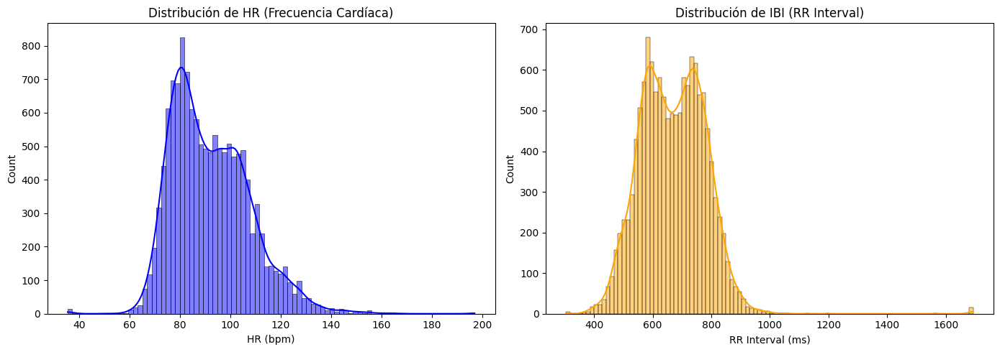

In [28]:
# Distribución de HR y IBI
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.histplot(df_ecg_hr['hr'], kde=True, color='blue')
plt.title("Distribución de HR (Frecuencia Cardíaca)")
plt.xlabel("HR (bpm)")

plt.subplot(1, 2, 2)
sns.histplot(df_ecg_ibi['rr_int'], kde=True, color='orange')
plt.title("Distribución de IBI (RR Interval)")
plt.xlabel("RR Interval (ms)")

plt.tight_layout()
plt.show()

Observamos dos posibles datos atípicos:
- 1+ instancia(s) con HR<40
- 1+ instancia(s) con RR>1600

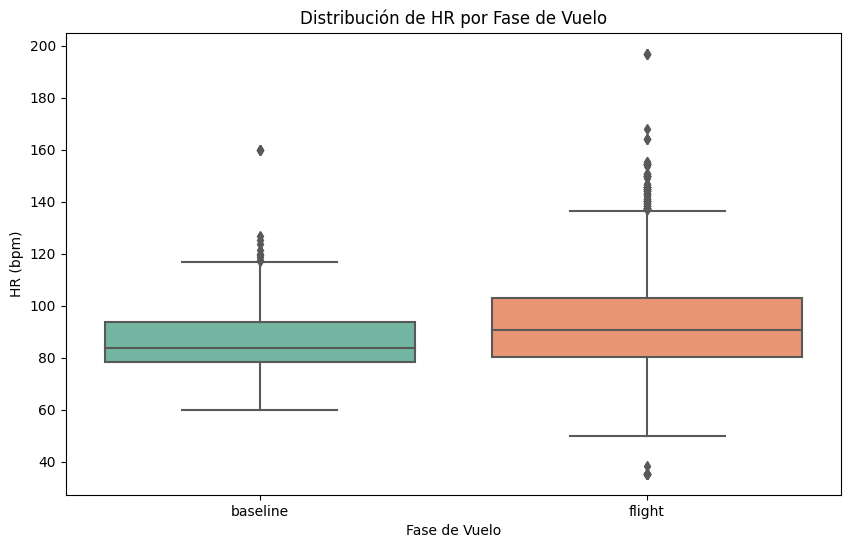

In [29]:
# Distribución de HR por fase de vuelo
plt.figure(figsize=(10, 6))
sns.boxplot(x='phase', y='hr', data=df_ecg_hr, palette='Set2')
plt.title("Distribución de HR por Fase de Vuelo")
plt.xlabel("Fase de Vuelo")
plt.ylabel("HR (bpm)")
plt.show()

Este boxplot nos ayuda a entender la variabilidad de nuestros datos según la fase del experimento en la que nos encontramos. Como ya sabemos, en este experimento existen 2: baseline (preparación) y el vuelo en sí. La gráfica nos sugiere que la mayor parte de los datos en la fase de preparación presentan frecuencias cardíacas comprendidas en 80-100, con bastantes datos aparentemente atípicos por encima de 120 e incluso alguna detección de un HR a 160 (podrían estar nerviosos y no ser errores en la captación).

En cambio, para la fase de vuelo, la mayor parte de las frecuencias cardíacas están comprendidas entre 80-100 y se detectan posibles datos atípicos de HR's más bajas de 50 y por encima de 140, llegando incluso a los 200. Esto nos sugiere algo que ya podríamos imaginarnos: durante el vuelo, surgiran situaciones en las que los pilotos se pondrán más nerviosos. Además, también vemos que existen ejemplos que pueden estar relacionados con estados de somnolencia. 

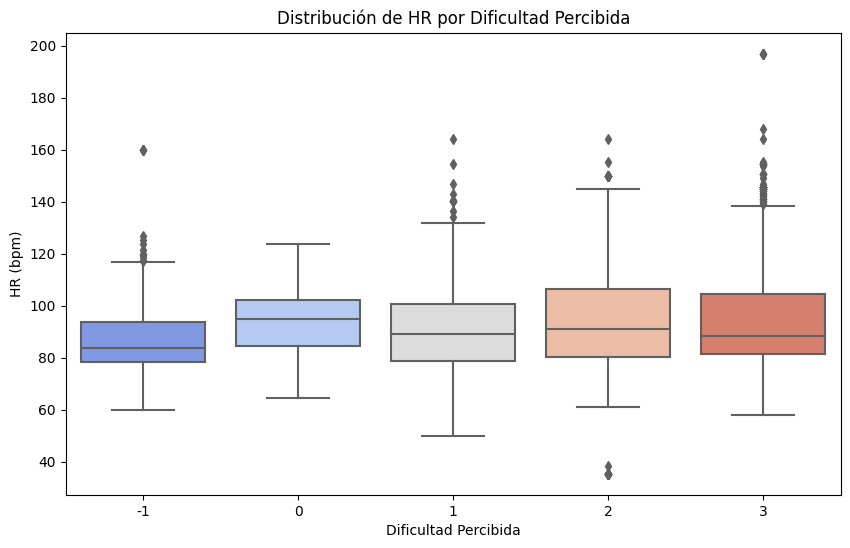

In [30]:
# Distribución de HR por dificultad percibida
plt.figure(figsize=(10, 6))
sns.boxplot(x='perceived_difficulty', y='hr', data=df_ecg_hr, palette='coolwarm')
plt.title("Distribución de HR por Dificultad Percibida")
plt.xlabel("Dificultad Percibida")
plt.ylabel("HR (bpm)")
plt.show()

De estos gráficos sacamos una información muy importante: no necesariamente la respuesta del piloto es sincera, ya que, si a mayor dificultad mayor respuesta nerviosa y cardíaca, entonces nuestro HR debería de aumentar. Sin embargo, observamos que la tendencia sí se sigue si tenemos en cuenta los atípicos, pero la mayor parte de los datos (las cajas) no siguen esa tendencia ascendengte, sino que suben"" y "bajan" independientemente de la dificultad que hayan contestado. 

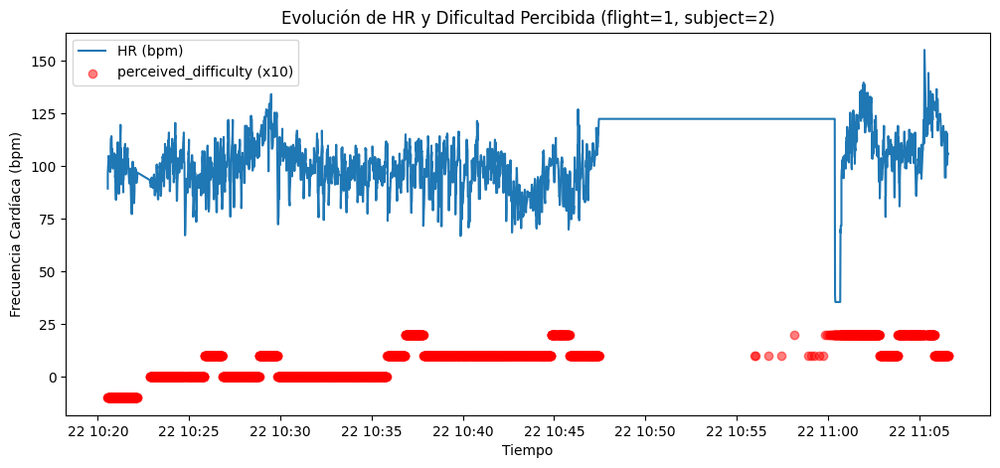

In [31]:
# Distribución de HR por dificultad percibida y dado un vuelo y uno de los pilotos
flight = 1
subject = 2

df_temp_hr = df_ecg_hr[(df_ecg_hr['flight'] == flight) & (df_ecg_hr['subject'] == subject)] # Filtrar por vuelo y piloto

if not df_temp_hr.empty:
    df_temp_hr = df_temp_hr.sort_values(by='datetime')

    plt.figure(figsize=(12, 5))

    # Graficar HR
    plt.plot(df_temp_hr['datetime'], df_temp_hr['hr'], label='HR (bpm)')

    # Escalar perceived_difficulty para que se vea en la misma gráfica
    plt.scatter(df_temp_hr['datetime'], df_temp_hr['perceived_difficulty'] * 10, # simplemente por escalar y que se pueda ver en la misma gráfica
                color='red', alpha=0.5, label='perceived_difficulty (x10)')

    plt.title(f"Evolución de HR y Dificultad Percibida (flight={flight}, subject={subject})")
    plt.xlabel("Tiempo")
    plt.ylabel("Frecuencia Cardíaca (bpm)")
    plt.legend()
    plt.show()
else:
    print(f"No hay datos para flight={flight} y subject={subject}")

Como ya dijimos antes, no necesariamente la dificultad contestada y la variación en la frecuencia cardíaca van correlacionadas. De hecho:

MIRAR ESTO Y DECIDIR SI QUITAR O PONER

In [32]:
# Cálculo de la correlación entre HR y dificultad percibida

# Cálculo de la correlación (Pearson) a nivel global
corr_value = df_ecg_hr[['hr', 'perceived_difficulty']].corr().iloc[0,1]
print(f"Correlación global HR vs Dificultad Percibida: {corr_value:.2f}")

# También podemos agrupar por fase o vuelo y ver la correlación en cada caso MIRAAAAAAAAAR NO DA
grouped_corr = df_ecg_hr.groupby(['phase'])[['hr','perceived_difficulty']].corr().iloc[0::2,-1].reset_index()
print("\nCorrelación por fase:")
print(grouped_corr)

Correlación global HR vs Dificultad Percibida: 0.12

Correlación por fase:
      phase level_1  perceived_difficulty
0  baseline      hr                   NaN
1    flight      hr              0.069805


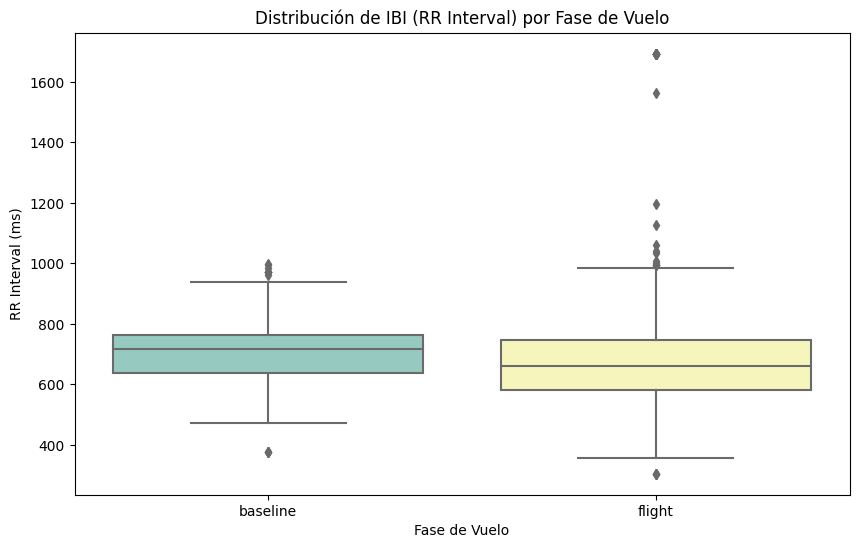

In [33]:
# Distribución de IBI por fase de vuelo
plt.figure(figsize=(10, 6))
sns.boxplot(x='phase', y='rr_int', data=df_ecg_ibi, palette='Set3')
plt.title("Distribución de IBI (RR Interval) por Fase de Vuelo")
plt.xlabel("Fase de Vuelo")
plt.ylabel("RR Interval (ms)")
plt.show()

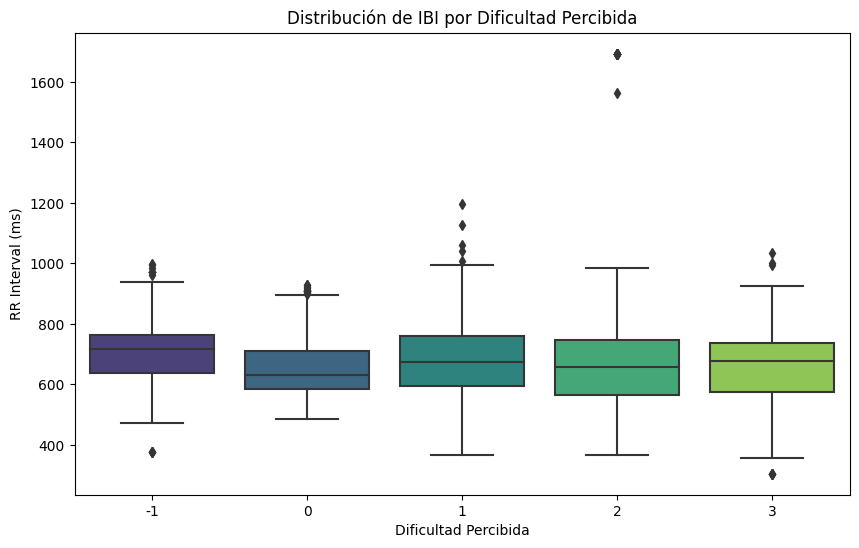

In [34]:
# Distribución de IBI por dificultad percibida
plt.figure(figsize=(10, 6))
sns.boxplot(x='perceived_difficulty', y='rr_int', data=df_ecg_ibi, palette='viridis')
plt.title("Distribución de IBI por Dificultad Percibida")
plt.xlabel("Dificultad Percibida")
plt.ylabel("RR Interval (ms)")
plt.show()

#### **Nulos**

In [35]:
dataframes = {
    "EEG": df_eeg,
    "ECG (HR)": df_ecg_hr,
    "ECG (IBI)": df_ecg_ibi
}

for name, df in dataframes.items():
    print(f"=== Análisis de nulos en {name} ===")
    
    # Filas con TODOS los valores nulos
    all_null_rows = df.isnull().all(axis=1).sum()
    print(f"Filas con todos los valores nulos: {all_null_rows}")
    
    # Lista de columnas que tienen al menos un valor nulo
    columnas_con_nulos = [col for col in df.columns if df[col].isnull().any()]
    
    if columnas_con_nulos:
        print("Columnas con nulos:")
        for col in columnas_con_nulos:
            nulos = df[col].isnull().sum()
            print(f" - {col}: {nulos} nulos")
    else:
        print("No se encontraron columnas con valores nulos.")
    
    print("-" * 40)

=== Análisis de nulos en EEG ===
Filas con todos los valores nulos: 0
Columnas con nulos:
 - MarkerIndex: 735769 nulos
 - MarkerType: 735769 nulos
 - MarkerValueInt: 735769 nulos
 - PM.Engagement.IsActive: 735196 nulos
 - PM.Engagement.Scaled: 735289 nulos
 - PM.Engagement.Raw: 735289 nulos
 - PM.Engagement.Min: 735196 nulos
 - PM.Engagement.Max: 735196 nulos
 - PM.Excitement.IsActive: 735196 nulos
 - PM.Excitement.Scaled: 735283 nulos
 - PM.Excitement.Raw: 735283 nulos
 - PM.Excitement.Min: 735196 nulos
 - PM.Excitement.Max: 735196 nulos
 - PM.LongTermExcitement: 735283 nulos
 - PM.Stress.IsActive: 735196 nulos
 - PM.Stress.Scaled: 735541 nulos
 - PM.Stress.Raw: 735541 nulos
 - PM.Stress.Min: 735196 nulos
 - PM.Stress.Max: 735196 nulos
 - PM.Relaxation.IsActive: 735196 nulos
 - PM.Relaxation.Scaled: 735293 nulos
 - PM.Relaxation.Raw: 735293 nulos
 - PM.Relaxation.Min: 735196 nulos
 - PM.Relaxation.Max: 735196 nulos
 - PM.Interest.IsActive: 735196 nulos
 - PM.Interest.Scaled: 735224 nu

De esto sabemos que: 
1.	Columnas de Markers y Engagement/Emotional Metrics: Las columnas relacionadas con “MarkerIndex”, “MarkerType”, “MarkerValueInt” son nulas enteras y aquellas asociadas a parámetros de engagement, excitement, stress, relaxation, interest y focus tienen cientos de miles de nulos. Esto sugiere que esos campos no se registraron en todas las sesiones o que en ciertos momentos el dispositivo no generó datos para esos parámetros.

2.	Columnas de Potencia en Bandas (POW…): Todas las columnas que indican la potencia en diferentes bandas (theta, alpha, beta low, beta high, gamma) para cada canal (AF3, F7, F3, FC5, T7, etc.) tienen también un elevado número de nulos (689,783 nulos en cada una). Esto puede significar que en el procesamiento inicial de la señal EEG no se computaron estas características en algunos intervalos o que, durante la adquisición, se dejó sin calcular la potencia para ciertos segmentos.

En contraste, los datasets de ECG (tanto HR como IBI) no presentan valores nulos, lo que indica que la captura de señales cardiacas se realizó de manera completa o que la limpieza de datos fue más efectiva en este caso.

Posibles Acciones a Considerar:
- Revisión del Pipeline de Preprocesamiento del EEG: Revisaremos el método o script que generó las columnas de potencia (y otros parámetros de engagement) para confirmar si se esperaba tener datos en todos los registros o si se registraron condiciones especiales en las que no se computaron.
- Manejo de Nulos en el Análisis Posterior: Dependiendo de la relevancia de estas columnas para el modelo de IA, puede ser necesario:
    - Imputar valores nulos con técnicas adecuadas (por ejemplo, interpolación o uso de la mediana de la columna) o descartar aquellas columnas que no aporten información relevante.
- Análisis de Calidad de los Datos: Considerar si esos nulos corresponden a intervalos sin actividad o a errores en la captura. Esto podría influir en la definición de las etiquetas o en el entrenamiento del modelo, ya que la presencia de nulos en campos importantes podría sesgar los resultados.

Por tanto, todas estas columnas serán eliminadas y realizaremos nuestro propio preprocesamiento para llegar a esos datos/información.

#### **Verificación de variables con dominio acotado**

- subject en los 3 datasets ha de ser 1 o 2
- flight en los 3 ha de ser [1-5]
- phase en los 3 ha de ser 'baseline' o 'flight'
- perceived_difficulty ha de ser [-1,4]
- theoretical_difficulty ha de ser [-1,3]

In [36]:
# Definimos los conjuntos de valores permitidos
allowed_subject = {1, 2}
allowed_flight = {1, 2, 3, 4, 5}
allowed_phase = {"baseline", "flight"}
# Para perceived_difficulty, permitimos valores enteros entre -1 y 4 (incluidos)
allowed_perceived = set(range(-1, 4))    # Esto da {-1, 0, 1, 2, 3}
# Para theoretical_difficulty, permitimos enteros entre -1 y 3 (incluidos)
allowed_theoretical = set(range(-1, 5))    # Esto da {-1, 0, 1, 2, 3, 4}

In [37]:
# Función para verificar una columna y mostrar las filas que no cumplen
def verificar_columna(df, columna, allowed_values):
    # Seleccionamos las filas donde el valor no está en el conjunto permitido
    invalid = df[~df[columna].isin(allowed_values)]
    return invalid

In [38]:
# Iteramos sobre cada dataset y revisamos cada condición
for ds_name, df in dataframes.items():
    print(f"=== Dataset: {ds_name} ===")
    
    # Verificar 'subject'
    invalid_subject = verificar_columna(df, 'subject', allowed_subject)
    if not invalid_subject.empty:
        print("Filas con 'subject' inválido:")
        print(invalid_subject[['subject']])
    else:
        print("Todos los valores de 'subject' son válidos.")
    
    # Verificar 'flight'
    invalid_flight = verificar_columna(df, 'flight', allowed_flight)
    if not invalid_flight.empty:
        print("Filas con 'flight' inválido:")
        print(invalid_flight[['flight']])
    else:
        print("Todos los valores de 'flight' son válidos.")
    
    # Verificar 'phase'
    invalid_phase = verificar_columna(df, 'phase', allowed_phase)
    if not invalid_phase.empty:
        print("Filas con 'phase' inválido:")
        print(invalid_phase[['phase']])
    else:
        print("Todos los valores de 'phase' son válidos.")
    
    # Verificar 'perceived_difficulty'
    invalid_perceived = verificar_columna(df, 'perceived_difficulty', allowed_perceived)
    if not invalid_perceived.empty:
        print("Filas con 'perceived_difficulty' inválido:")
        print(invalid_perceived[['perceived_difficulty']])
    else:
        print("Todos los valores de 'perceived_difficulty' son válidos.")
    
    # Verificar 'theoretical_difficulty'
    invalid_theoretical = verificar_columna(df, 'theoretical_difficulty', allowed_theoretical)
    if not invalid_theoretical.empty:
        print("Filas con 'theoretical_difficulty' inválido:")
        print(invalid_theoretical[['theoretical_difficulty']])
    else:
        print("Todos los valores de 'theoretical_difficulty' son válidos.")
    
    print("-" * 60)

=== Dataset: EEG ===
Todos los valores de 'subject' son válidos.
Todos los valores de 'flight' son válidos.
Todos los valores de 'phase' son válidos.
Todos los valores de 'perceived_difficulty' son válidos.
Todos los valores de 'theoretical_difficulty' son válidos.
------------------------------------------------------------
=== Dataset: ECG (HR) ===
Todos los valores de 'subject' son válidos.
Todos los valores de 'flight' son válidos.
Todos los valores de 'phase' son válidos.
Todos los valores de 'perceived_difficulty' son válidos.
Todos los valores de 'theoretical_difficulty' son válidos.
------------------------------------------------------------
=== Dataset: ECG (IBI) ===
Todos los valores de 'subject' son válidos.
Todos los valores de 'flight' son válidos.
Todos los valores de 'phase' son válidos.
Todos los valores de 'perceived_difficulty' son válidos.
Todos los valores de 'theoretical_difficulty' son válidos.
------------------------------------------------------------


Perfecto, se cumple. Ahora vamos a verificar si existen datos para todas las combinaciones posibles

In [39]:
# Valores permitidos para subject y flight 
allowed_subjects = {1, 2}
allowed_flights = {1, 2, 3, 4, 5}

# Generar todas las combinaciones esperadas
expected_combinations = pd.DataFrame(
    list(itertools.product(allowed_subjects, allowed_flights)),
    columns=['subject', 'flight']
)

def find_missing_combinations(df, df_name, expected_df):
    """
    Encuentra las combinaciones de ['subject','flight'] que están en expected_df pero no en el dataset df.
    """
    # Extraer combinaciones únicas presentes en el dataset
    df_combinations = df[['subject', 'flight']].drop_duplicates()
    # Merge para identificar combinaciones faltantes
    merged = expected_df.merge(df_combinations, on=['subject', 'flight'], how='left', indicator=True)
    missing = merged[merged['_merge'] == 'left_only'][['subject', 'flight']]
    
    if missing.empty:
        print(f"Todas las combinaciones de subject y flight están presentes en {df_name}.")
    else:
        print(f"\nFaltan las siguientes combinaciones en {df_name}:")
        print(missing)
    
    return missing

# Buscar las combinaciones faltantes en cada dataset
missing_eeg = find_missing_combinations(df_eeg, "df_eeg", expected_combinations)
missing_ecg_hr = find_missing_combinations(df_ecg_hr, "df_ecg_hr", expected_combinations)
missing_ecg_ibi = find_missing_combinations(df_ecg_ibi, "df_ecg_ibi", expected_combinations)

def verify_missing_combinations(df, missing_df, df_name):
    """
    Para cada combinación faltante reportada, verifica que realmente no existan registros en el dataset df.
    """
    for idx, row in missing_df.iterrows():
        subj = row['subject']
        flight = row['flight']
        subset = df[(df['subject'] == subj) & (df['flight'] == flight)]
        if subset.empty:
            print(f"Verificación: La combinación subject={subj}, flight={flight} NO existe en {df_name} (correcto).")
        else:
            print(f"Verificación: ¡Atención! La combinación subject={subj}, flight={flight} SÍ existe en {df_name}:")
            print(subset)

# Verificar en cada dataset
print("\n--- Verificación en df_eeg ---")
verify_missing_combinations(df_eeg, missing_eeg, "df_eeg")

print("\n--- Verificación en df_ecg_hr ---")
verify_missing_combinations(df_ecg_hr, missing_ecg_hr, "df_ecg_hr")

print("\n--- Verificación en df_ecg_ibi ---")
verify_missing_combinations(df_ecg_ibi, missing_ecg_ibi, "df_ecg_ibi")


Faltan las siguientes combinaciones en df_eeg:
   subject  flight
0        1       1
3        1       4
4        1       5
6        2       2
7        2       3

Faltan las siguientes combinaciones en df_ecg_hr:
   subject  flight
0        1       1

Faltan las siguientes combinaciones en df_ecg_ibi:
   subject  flight
0        1       1

--- Verificación en df_eeg ---
Verificación: La combinación subject=1, flight=1 NO existe en df_eeg (correcto).
Verificación: La combinación subject=1, flight=4 NO existe en df_eeg (correcto).
Verificación: La combinación subject=1, flight=5 NO existe en df_eeg (correcto).
Verificación: La combinación subject=2, flight=2 NO existe en df_eeg (correcto).
Verificación: La combinación subject=2, flight=3 NO existe en df_eeg (correcto).

--- Verificación en df_ecg_hr ---
Verificación: La combinación subject=1, flight=1 NO existe en df_ecg_hr (correcto).

--- Verificación en df_ecg_ibi ---
Verificación: La combinación subject=1, flight=1 NO existe en df_ec

Todas estas combinaciones de sujeto y tipo de vuelo NO existen en nuestros datasets. Coincide con lo del paper, mientras uno realiza el experimento, el otro visualiza. Sin embargo, para el ECG solo nos falta la combinación 1-1, quizá será pq el ECG sí se grabó en todos los escenarios iundependientemente de que fueran conduciendo u observando menos en la más fácil. 

#### **Análisis de Variables Categóricas**

In [40]:
if "role" in df_eeg.columns:
    unique_roles = df_eeg["role"].unique()
    print("Valores únicos en 'role' en df_eeg:")
    print(unique_roles)
else:
    print("La columna 'role' no existe en df_eeg.")

Valores únicos en 'role' en df_eeg:
['flying']


In [41]:
for name, df in dataframes.items():
    if "phase" in df.columns:
        unique_phases = df["phase"].unique()
        print(f"Valores únicos en 'phase' en {name}:")
        print(unique_phases)
    else:
        print(f"La columna 'phase' no existe en el dataset {name}.")

Valores únicos en 'phase' en EEG:
['flight' 'baseline']
Valores únicos en 'phase' en ECG (HR):
['baseline' 'flight']
Valores únicos en 'phase' en ECG (IBI):
['baseline' 'flight']


- role con un único valor: Tener una columna con un solo valor ("flying") no aporta información al modelo, porque no hay variabilidad para discriminar entre categorías. 
- phase con dos categorías ("baseline" y "flight"): Cuando solo hay dos categorías, un LabelEncoder suele ser suficiente: "baseline" → 0, "flight" → 1. Un OneHotEncoder crearía dos columnas (por ejemplo, [1, 0] para "baseline" y [0, 1] para "flight"), lo cual es funcional pero menos práctico en un caso binario.

#### **Outliers** 

Analizando las variables del dataset ECG, observamos un único outlier (HR<40) y otro outlier (RR>1600), ya que son valores desorbitados y muy poco comunes, casi imposibles de que sean procedentes de personas con vida. Se eliminarán.

Para EEG, tras realizar un análisis exhaustivo de todas sus variables correspondientes a los electrodos, no se observó ningún outlier. Tampoco en las variables con dominio acotado. Pero sí en datetime, ya que no hay sincronización temporal para ambos sujetos. 

#### **Análisis de Correlaciones**

##### Correlaciones en EEG

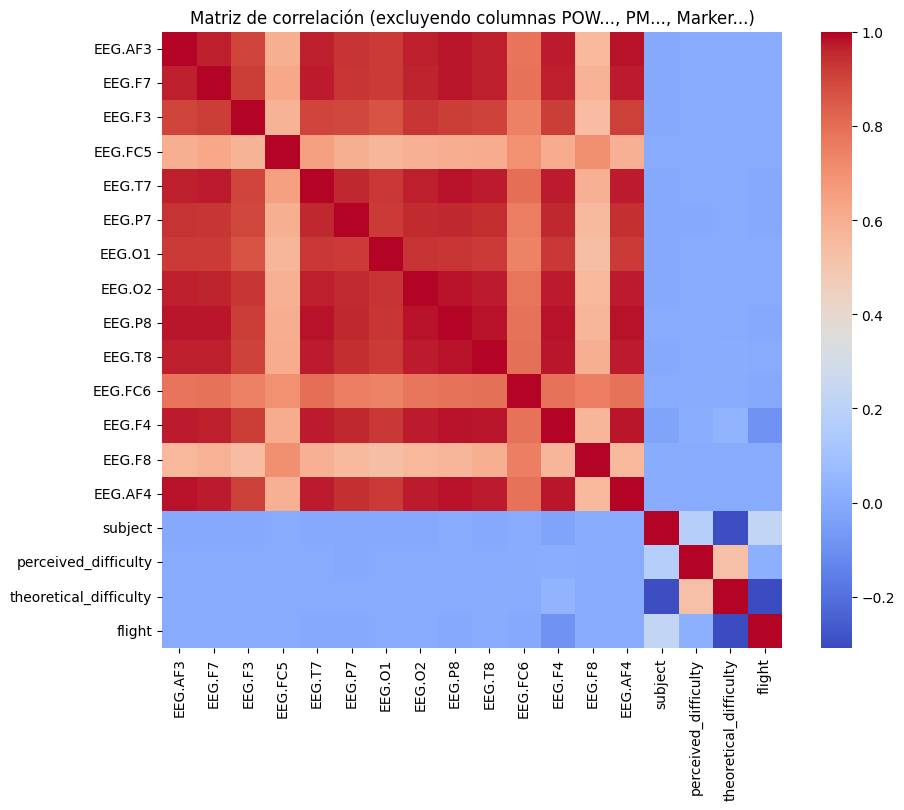

In [42]:
# Definir las columnas que NO deseamos incluir en la matriz de correlación
exclusion_keywords = ["POW.", "PM.", "Marker", "mean", 'EEG.Battery', "CQ.", "EEG.Counter", "EEG.Interpolated", "EEG.RawCq", "timestamp"]

# Seleccionar las columnas que no contengan esos patrones en su nombre
cols_for_corr = [
    col for col in df_eeg.columns
    if not any(keyword in col for keyword in exclusion_keywords)
]

# Filtrar solo esas columnas y quedarnos con las de tipo numérico
df_eeg_filtered = df_eeg[cols_for_corr].select_dtypes(include=[np.number])

# Calcular la matriz de correlación
corr_matrix = df_eeg_filtered.corr()

# Mostrar la matriz de correlación, por ejemplo, como heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm")
plt.title("Matriz de correlación (excluyendo columnas POW..., PM..., Marker...)")
plt.show()

In [43]:
# Extraer y ordenar las correlaciones
# Usamos la parte superior de la matriz (sin duplicar i-j y j-i)
upper_triangle = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
corr_pairs = corr_matrix.where(upper_triangle).stack()  # Series con (col1, col2) como índice

# Ordenamos por valor absoluto de correlación en orden descendente
# corr_pairs es una Series; reindexamos para obtener el orden según su valor absoluto
corr_pairs_abs_sorted = corr_pairs.reindex(corr_pairs.abs().sort_values(ascending=False).index)

# Imprimir, por ejemplo, las 20 correlaciones más altas
print("=== Top 10 correlaciones (por valor absoluto) excluyendo POW..., PM..., Marker... ===")
for (col1, col2), val in corr_pairs_abs_sorted.head(20).items():
    print(f"{col1} - {col2}: {val:.4f}")

=== Top 10 correlaciones (por valor absoluto) excluyendo POW..., PM..., Marker... ===
EEG.AF3 - EEG.AF4: 0.9837
EEG.P8 - EEG.T8: 0.9825
EEG.P8 - EEG.AF4: 0.9823
EEG.T7 - EEG.P8: 0.9801
EEG.O2 - EEG.P8: 0.9800
EEG.P8 - EEG.F4: 0.9796
EEG.T8 - EEG.F4: 0.9780
EEG.F4 - EEG.AF4: 0.9776
EEG.F7 - EEG.P8: 0.9770
EEG.AF3 - EEG.P8: 0.9761
EEG.T8 - EEG.AF4: 0.9740
EEG.O2 - EEG.AF4: 0.9732
EEG.T7 - EEG.T8: 0.9725
EEG.F7 - EEG.AF4: 0.9721
EEG.O2 - EEG.F4: 0.9720
EEG.T7 - EEG.F4: 0.9718
EEG.O2 - EEG.T8: 0.9716
EEG.T7 - EEG.AF4: 0.9708
EEG.F7 - EEG.T7: 0.9707
EEG.AF3 - EEG.F4: 0.9696


Mediante este estudio de correlaciones podemos entender cuáles son las áreas celebrales más correlacionadas.

##### Correlaciones en ECG

=== Análisis para ECG (HR) ===


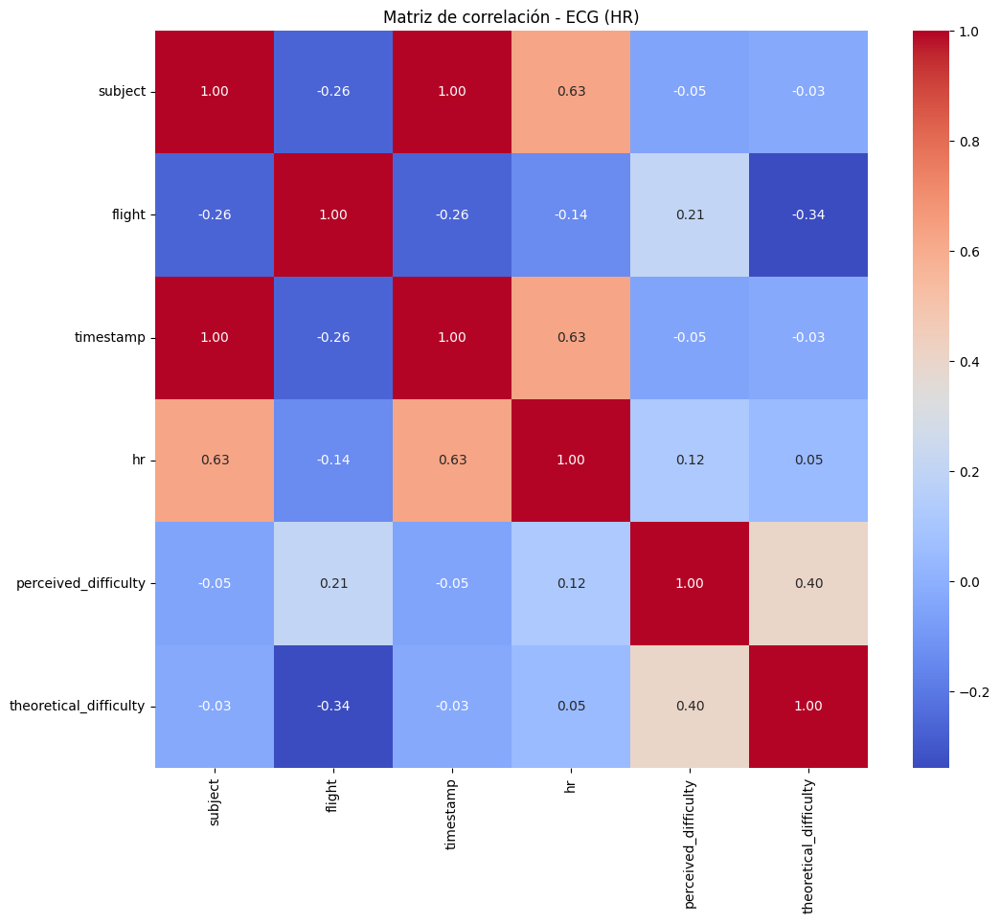

Top 10 correlaciones para ECG (HR):
subject - timestamp: 1.0000
timestamp - hr: 0.6255
subject - hr: 0.6255
perceived_difficulty - theoretical_difficulty: 0.4017
flight - theoretical_difficulty: -0.3395
subject - flight: -0.2630
flight - timestamp: -0.2630
flight - perceived_difficulty: 0.2071
flight - hr: -0.1397
hr - perceived_difficulty: 0.1202
------------------------------------------------------------
=== Análisis para ECG (IBI) ===


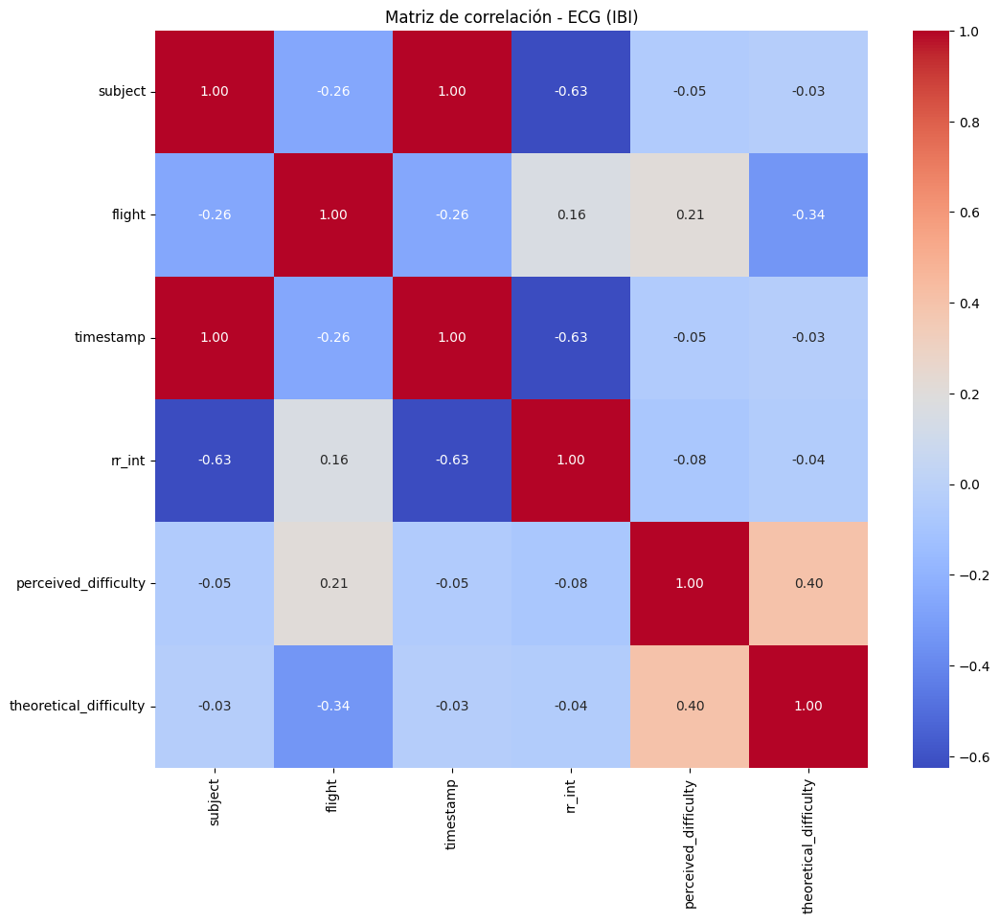

Top 10 correlaciones para ECG (IBI):
subject - timestamp: 1.0000
timestamp - rr_int: -0.6258
subject - rr_int: -0.6258
perceived_difficulty - theoretical_difficulty: 0.4017
flight - theoretical_difficulty: -0.3395
subject - flight: -0.2630
flight - timestamp: -0.2630
flight - perceived_difficulty: 0.2071
flight - rr_int: 0.1608
rr_int - perceived_difficulty: -0.0838
------------------------------------------------------------


In [44]:
# Diccionario con los DataFrames de ECG
ecg_datasets = {
    "ECG (HR)": df_ecg_hr,
    "ECG (IBI)": df_ecg_ibi
}

for name, df in ecg_datasets.items():
    print(f"=== Análisis para {name} ===")
    
    # Seleccionar solo columnas numéricas
    df_numeric = df.select_dtypes(include=[np.number])
    
    # Calcular la matriz de correlación
    corr_matrix = df_numeric.corr()
    
    # Visualizar la matriz de correlación
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(f"Matriz de correlación - {name}")
    plt.show()
    
    # Extraer las correlaciones (usando solo la parte superior de la matriz para no duplicar)
    mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    corr_pairs = corr_matrix.where(mask).stack()  # Serie con índices (col1, col2)
    
    # Ordenar las correlaciones por valor absoluto, de mayor a menor
    corr_pairs_sorted = corr_pairs.reindex(corr_pairs.abs().sort_values(ascending=False).index)
    
    # Imprimir las 10 correlaciones más altas
    print(f"Top 10 correlaciones para {name}:")
    for (col1, col2), corr_value in corr_pairs_sorted.head(10).items():
        print(f"{col1} - {col2}: {corr_value:.4f}")
    
    print("-" * 60)

Lo mismo para ECG

#### **Estudio de datasets de ECG**

Ambos datasets nos parecieron idénticos en un principio, por lo que vamos a comprobar si excluyendo las columnas en las que difieren esto se cumple y así hacer un merge

In [45]:
# Excluir las columnas "hr" y "rr_int" respectivamente
df_ecg_hr_comp = df_ecg_hr.drop(columns=['hr'])
df_ecg_ibi_comp = df_ecg_ibi.drop(columns=['rr_int'])

# Verificar si son idénticos (misma posición y mismos datos)
if df_ecg_hr_comp.equals(df_ecg_ibi_comp):
    print("Los DataFrames df_ecg_hr y df_ecg_ibi son idénticos (excluyendo 'hr' y 'rr_int').")
else:
    print("Los DataFrames df_ecg_hr y df_ecg_ibi NO son idénticos (excluyendo 'hr' y 'rr_int').")
    
    # Mostrar diferencias:
    diferencias = df_ecg_hr_comp.compare(df_ecg_ibi_comp)
    print("Diferencias encontradas:")
    print(diferencias)

Los DataFrames df_ecg_hr y df_ecg_ibi son idénticos (excluyendo 'hr' y 'rr_int').


Por tanto, posteriormente los uniremos

#### **Comprobación de interrupciones en la recolección de los datos**

##### ECG

In [46]:
def check_zeros_in_dataset(df, value_col, group_cols, dataset_name):
    grouped = df.groupby(group_cols)
    for group_key, group in grouped:
        # Ordenamos por datetime para ver la secuencia temporal
        group_sorted = group.sort_values('datetime')
        zero_values = group_sorted[group_sorted[value_col] == 0.000000]
        if not zero_values.empty:
            print(f"Dataset: {dataset_name} - Group: {group_key}")
            print(zero_values[['datetime', value_col]])
            print("-" * 40)

# Verificar en df_ecg_hr para la columna 'hr'
print("Chequeo de valores 0.0 en 'hr' en df_ecg_hr:")
check_zeros_in_dataset(df_ecg_hr, 'hr', ['subject', 'flight', 'phase'], 'ECG (HR)')

# Verificar en df_ecg_ibi para la columna 'rr_int'
print("\nChequeo de valores 0.0 en 'rr_int' en df_ecg_ibi:")
check_zeros_in_dataset(df_ecg_ibi, 'rr_int', ['subject', 'flight', 'phase'], 'ECG (IBI)')

Chequeo de valores 0.0 en 'hr' en df_ecg_hr:

Chequeo de valores 0.0 en 'rr_int' en df_ecg_ibi:


En ECG los datos son completos.

##### EEG

###### Ceros en lecturas de los electrodos ( EEG )

In [47]:
def check_zeros_in_eeg(df, electrode_cols, group_cols, dataset_name):
    # Agrupar según las columnas indicadas
    grouped = df.groupby(group_cols)
    for group_key, group in grouped:
        # Ordenar el grupo por datetime para seguir la secuencia temporal
        group_sorted = group.sort_values('datetime')
        # Filtrar las filas donde alguna de las columnas de electrodos tenga 0.0
        zeros = group_sorted[group_sorted[electrode_cols].eq(0.0).any(axis=1)]
        if not zeros.empty:
            print(f"Dataset: {dataset_name} - Grupo: {group_key}")
            print(zeros[['datetime'] + electrode_cols])
            print("-" * 40)

# lista de columnas de electrodos a comprobar.
electrode_cols = [
    "EEG.AF3", "EEG.F7", "EEG.F3", "EEG.FC5",
    "EEG.F8", "EEG.AF4", "EEG.F4", "EEG.FC6",
    "EEG.T7", "EEG.P7", "EEG.O1", "EEG.T8",
    "EEG.P8", "EEG.O2"
]

print("Chequeo de valores 0.0 en los electrodos en df_eeg:")
check_zeros_in_eeg(df_eeg, electrode_cols, ['subject', 'flight', 'phase'], "EEG")

Chequeo de valores 0.0 en los electrodos en df_eeg:
Dataset: EEG - Grupo: (1, 2, 'baseline')
                         datetime      EEG.AF3       EEG.F7       EEG.F3  \
456706 2020-12-22 11:29:00.824933   283.076935     5.128205   866.153870   
459459 2020-12-22 11:29:22.574265     0.000000     0.000000   240.512817   
462720 2020-12-22 11:29:50.004568    97.948715     0.000000   557.948730   
481802 2020-12-22 11:32:20.400126     0.000000     0.000000     0.000000   
492739 2020-12-22 11:33:46.618659     0.000000     0.000000     0.000000   
497208 2020-12-22 11:34:21.788671  5468.205078  5557.436035  5343.589844   

            EEG.FC5       EEG.F8      EEG.AF4       EEG.F4      EEG.FC6  \
456706   211.282059     0.000000   140.000000   970.769226   689.230774   
459459     0.000000     0.000000     0.000000    32.307693     0.000000   
462720   170.769226    16.410257    70.769234   333.333344    89.230766   
481802     0.000000     0.000000     0.000000     0.000000     0.000000   

Como si existen, los pasamos a un dataframe para poder explorarlos mejor

In [48]:
# Lista de columnas de electrodos
electrode_cols = [
    "EEG.AF3", "EEG.F7", "EEG.F3", "EEG.FC5",
    "EEG.F8", "EEG.AF4", "EEG.F4", "EEG.FC6",
    "EEG.T7", "EEG.P7", "EEG.O1", "EEG.T8",
    "EEG.P8", "EEG.O2"
]

# Filtrar el DataFrame para obtener las filas donde al menos uno de los electrodos es 0.0
df_eeg_zeros = df_eeg[df_eeg[electrode_cols].eq(0.0).any(axis=1)]

# Ordenar por subject, flight, phase y datetime para ver la secuencia temporal
df_eeg_zeros_sorted = df_eeg_zeros.sort_values(by=['subject', 'flight', 'phase', 'datetime'])

# Visualizar el resultado: se muestran la columna datetime y las columnas de electrodos
print("Filas del df_eeg con al menos un valor 0.0 en los electrodos:")
print(df_eeg_zeros_sorted[['datetime'] + electrode_cols])

Filas del df_eeg con al menos un valor 0.0 en los electrodos:
                         datetime      EEG.AF3       EEG.F7       EEG.F3  \
456706 2020-12-22 11:29:00.824933   283.076935     5.128205   866.153870   
459459 2020-12-22 11:29:22.574265     0.000000     0.000000   240.512817   
462720 2020-12-22 11:29:50.004568    97.948715     0.000000   557.948730   
481802 2020-12-22 11:32:20.400126     0.000000     0.000000     0.000000   
492739 2020-12-22 11:33:46.618659     0.000000     0.000000     0.000000   
497208 2020-12-22 11:34:21.788671  5468.205078  5557.436035  5343.589844   

            EEG.FC5       EEG.F8      EEG.AF4       EEG.F4      EEG.FC6  \
456706   211.282059     0.000000   140.000000   970.769226   689.230774   
459459     0.000000     0.000000     0.000000    32.307693     0.000000   
462720   170.769226    16.410257    70.769234   333.333344    89.230766   
481802     0.000000     0.000000     0.000000     0.000000     0.000000   
492739     0.000000     0.0000

In [49]:
df_eeg_zeros_sorted

,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
456706,1.608633e+09,118,0,283.076935,5.128205,866.153870,211.282059,215.897430,1705.640991,661.538452,...,1,flying,-1,-1,baseline,2,341.410278,450.000000,861.025635,152.649582
459459,1.608633e+09,33,0,0.000000,0.000000,240.512817,0.000000,0.000000,1052.820557,142.564102,...,1,flying,-1,-1,baseline,2,60.128204,8.076923,398.461548,0.000000
462720,1.608633e+09,36,0,97.948715,0.000000,557.948730,170.769226,44.615383,1070.256470,341.025635,...,1,flying,-1,-1,baseline,2,206.666672,127.435898,485.299164,129.059830
481802,1.608633e+09,26,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1,flying,-1,-1,baseline,2,0.000000,0.000000,0.000000,0.000000
492739,1.608633e+09,127,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1,flying,-1,-1,baseline,2,0.000000,0.000000,0.000000,0.000000
497208,1.608633e+09,81,0,5468.205078,5557.436035,5343.589844,5355.897461,5477.948730,5140.000000,0.000000,...,1,flying,-1,-1,baseline,2,5431.282227,5377.051270,3539.316406,5537.606934


Como podemos observar, sí existen estos datos 0.0, seguramente relacionados con una parada de grabación del EEG durante la preparación.

In [50]:
df_eeg_zeros_sorted['datetime']

456706   2020-12-22 11:29:00.824933
459459   2020-12-22 11:29:22.574265
462720   2020-12-22 11:29:50.004568
481802   2020-12-22 11:32:20.400126
492739   2020-12-22 11:33:46.618659
497208   2020-12-22 11:34:21.788671
Name: datetime, dtype: datetime64[us]

Además, se corresponde a una secuencia casi continua de grabación, del mismo sujeto en la misma fase de vuelo.

In [51]:
# Ordenar el dataset completo
df_eeg_sorted = df_eeg.sort_values(by=['subject', 'flight', 'phase', 'datetime']).reset_index(drop=True)

# Ya tenemos df_eeg_zeros_sorted (filas con 0.0) también ordenado
df_zeros = df_eeg_zeros_sorted.reset_index(drop=True)

# Para cada par consecutivo de filas con 0.0
for i in range(len(df_zeros) - 1):
    # Fila i y fila i+1
    row_current = df_zeros.loc[i]
    row_next = df_zeros.loc[i+1]
    
    # Verificamos que sean el mismo sujeto, vuelo y fase
    same_subject = (row_current['subject'] == row_next['subject'])
    same_flight = (row_current['flight'] == row_next['flight'])
    same_phase = (row_current['phase'] == row_next['phase'])
    
    if same_subject and same_flight and same_phase:
        # Intervalo de tiempo: entre la datetime de row_current y row_next
        dt_min = row_current['datetime']
        dt_max = row_next['datetime']
        
        # Extraer las filas del dataset completo que estén dentro de este rango
        mask = (
            (df_eeg_sorted['subject'] == row_current['subject']) &
            (df_eeg_sorted['flight'] == row_current['flight']) &
            (df_eeg_sorted['phase'] == row_current['phase']) &
            (df_eeg_sorted['datetime'] > dt_min) &
            (df_eeg_sorted['datetime'] < dt_max)
        )
        
        df_inbetween = df_eeg_sorted[mask]
        
        if not df_inbetween.empty:
            print(f"Registros intermedios entre las filas {i} y {i+1} con 0.0 (subject={row_current['subject']}, "
                  f"flight={row_current['flight']}, phase={row_current['phase']}):")
            print(df_inbetween[['datetime']])  # Añadir otras columnas que queramos ver
            print("-" * 60)
        else:
            print(f"No hay registros intermedios entre las filas {i} y {i+1} con 0.0 para subject={row_current['subject']}, "
                  f"flight={row_current['flight']}, phase={row_current['phase']}.")
    else:
        print(f"Las filas {i} y {i+1} con 0.0 no comparten subject/flight/phase.")

Registros intermedios entre las filas 0 y 1 con 0.0 (subject=1, flight=2, phase=baseline):
                        datetime
8849  2020-12-22 11:29:00.832749
8850  2020-12-22 11:29:00.840665
8851  2020-12-22 11:29:00.848481
8852  2020-12-22 11:29:00.856397
8853  2020-12-22 11:29:00.864213
...                          ...
11596 2020-12-22 11:29:22.535060
11597 2020-12-22 11:29:22.542861
11598 2020-12-22 11:29:22.550762
11599 2020-12-22 11:29:22.558564
11600 2020-12-22 11:29:22.566464

[2752 rows x 1 columns]
------------------------------------------------------------
Registros intermedios entre las filas 1 y 2 con 0.0 (subject=1, flight=2, phase=baseline):
                        datetime
11602 2020-12-22 11:29:22.582268
11603 2020-12-22 11:29:22.590171
11604 2020-12-22 11:29:22.598174
11605 2020-12-22 11:29:22.606077
11606 2020-12-22 11:29:22.613880
...                          ...
14857 2020-12-22 11:29:49.965288
14858 2020-12-22 11:29:49.973104
14859 2020-12-22 11:29:49.981020
14860 

Observamos que dentro del dataset original, existen miles de registros entre 'registros fallo' 0.0, por lo que deberemos de definir una estrategia para tratarlo.

###### Ceros en variables CQ

Como vimos en el paper, CQ es la Contact Quality ( calidad de contacto de los electrodos a la piel de la cabeza ). Por lo tanto, valores 0 indicarán un fallo en el contacto de ese electrodo en ese instante de tiempo.

In [52]:
# Seleccionar las columnas cuyo nombre comienza con "CQ"
cq_cols = [col for col in df_eeg_zeros_sorted.columns if col.startswith("CQ")]
print("Columnas que comienzan con 'CQ':", cq_cols)

# Filtrar las filas donde al menos una de estas columnas tiene valor 0
df_cq0 = df_eeg_zeros_sorted[df_eeg_zeros_sorted[cq_cols].eq(0.000000).any(axis=1)]

# Visualizar los primeros registros resultantes
print("Registros con algún valor 0 en columnas que comienzan con 'CQ':")
print(df_cq0.head())

Columnas que comienzan con 'CQ': ['CQ.AF3', 'CQ.F7', 'CQ.F3', 'CQ.FC5', 'CQ.T7', 'CQ.P7', 'CQ.O1', 'CQ.O2', 'CQ.P8', 'CQ.T8', 'CQ.FC6', 'CQ.F4', 'CQ.F8', 'CQ.AF4', 'CQ.Overall']
Registros con algún valor 0 en columnas que comienzan con 'CQ':
Empty DataFrame
Columns: [timestamp, EEG.Counter, EEG.Interpolated, EEG.AF3, EEG.F7, EEG.F3, EEG.FC5, EEG.T7, EEG.P7, EEG.O1, EEG.O2, EEG.P8, EEG.T8, EEG.FC6, EEG.F4, EEG.F8, EEG.AF4, EEG.RawCq, EEG.Battery, MarkerIndex, MarkerType, MarkerValueInt, EEG.MarkerHardware, CQ.AF3, CQ.F7, CQ.F3, CQ.FC5, CQ.T7, CQ.P7, CQ.O1, CQ.O2, CQ.P8, CQ.T8, CQ.FC6, CQ.F4, CQ.F8, CQ.AF4, CQ.Overall, PM.Engagement.IsActive, PM.Engagement.Scaled, PM.Engagement.Raw, PM.Engagement.Min, PM.Engagement.Max, PM.Excitement.IsActive, PM.Excitement.Scaled, PM.Excitement.Raw, PM.Excitement.Min, PM.Excitement.Max, PM.LongTermExcitement, PM.Stress.IsActive, PM.Stress.Scaled, PM.Stress.Raw, PM.Stress.Min, PM.Stress.Max, PM.Relaxation.IsActive, PM.Relaxation.Scaled, PM.Relaxation.Raw

In [53]:
# Filtrar las filas donde al menos una de estas columnas tiene un valor NaN
df_cq_nan = df_eeg_zeros_sorted[df_eeg_zeros_sorted[cq_cols].isnull().any(axis=1)]

# Mostrar las primeras filas del DataFrame resultante
print("Registros con algún NaN en columnas que comienzan con 'CQ':")
print(df_cq_nan.head())

Registros con algún NaN en columnas que comienzan con 'CQ':
Empty DataFrame
Columns: [timestamp, EEG.Counter, EEG.Interpolated, EEG.AF3, EEG.F7, EEG.F3, EEG.FC5, EEG.T7, EEG.P7, EEG.O1, EEG.O2, EEG.P8, EEG.T8, EEG.FC6, EEG.F4, EEG.F8, EEG.AF4, EEG.RawCq, EEG.Battery, MarkerIndex, MarkerType, MarkerValueInt, EEG.MarkerHardware, CQ.AF3, CQ.F7, CQ.F3, CQ.FC5, CQ.T7, CQ.P7, CQ.O1, CQ.O2, CQ.P8, CQ.T8, CQ.FC6, CQ.F4, CQ.F8, CQ.AF4, CQ.Overall, PM.Engagement.IsActive, PM.Engagement.Scaled, PM.Engagement.Raw, PM.Engagement.Min, PM.Engagement.Max, PM.Excitement.IsActive, PM.Excitement.Scaled, PM.Excitement.Raw, PM.Excitement.Min, PM.Excitement.Max, PM.LongTermExcitement, PM.Stress.IsActive, PM.Stress.Scaled, PM.Stress.Raw, PM.Stress.Min, PM.Stress.Max, PM.Relaxation.IsActive, PM.Relaxation.Scaled, PM.Relaxation.Raw, PM.Relaxation.Min, PM.Relaxation.Max, PM.Interest.IsActive, PM.Interest.Scaled, PM.Interest.Raw, PM.Interest.Min, PM.Interest.Max, PM.Focus.IsActive, PM.Focus.Scaled, PM.Focus.Raw,

CQ siempre tiene valores. Por tanto, todos los datos son válidos. 

#### **Análisis de Registros Duplicados**

In [54]:
for name, df in dataframes.items():
    print(f"=== Verificando duplicados en {name} ===")
    
    # Identificar filas duplicadas (keep=False marca todas las duplicadas, no solo la segunda aparición)
    duplicated_mask = df.duplicated(keep=False)
    
    # Contar cuántas filas duplicadas hay
    num_duplicated = duplicated_mask.sum()
    
    if num_duplicated == 0:
        print("No se encontraron filas duplicadas.")
    else:
        print(f"Se encontraron {num_duplicated} filas duplicadas. Mostrando filas duplicadas:")
        duplicates = df[duplicated_mask]
        print(duplicates)
    
    print("-" * 60)

=== Verificando duplicados en EEG ===
No se encontraron filas duplicadas.
------------------------------------------------------------
=== Verificando duplicados en ECG (HR) ===
No se encontraron filas duplicadas.
------------------------------------------------------------
=== Verificando duplicados en ECG (IBI) ===
No se encontraron filas duplicadas.
------------------------------------------------------------


In [55]:
# Verificar duplicados en df_eeg para las claves
print("Duplicados en eeg:")
print(df_eeg.duplicated(subset=['subject', 'flight', 'phase', 'datetime']).sum())

Duplicados en eeg:
0


In [56]:
# Verificar duplicados en df_ecg_hr para las claves
print("Duplicados en ecg_hr:")
print(df_ecg_hr.duplicated(subset=['subject', 'flight', 'phase', 'datetime']).sum())

# Verificar duplicados en df_ecg_ibi para las claves
print("Duplicados en ecg_ibi:")
print(df_ecg_ibi.duplicated(subset=['subject', 'flight', 'phase', 'datetime']).sum())

Duplicados en ecg_hr:
3161
Duplicados en ecg_ibi:
3161


In [57]:
dup_mask = df_ecg_hr.duplicated(subset=['subject','flight','phase','datetime'], keep=False)
df_ecg_hr[dup_mask].sort_values(['subject','flight','phase','datetime']).head(20)

,subject,flight,phase,timestamp,datetime,hr,perceived_difficulty,theoretical_difficulty
0,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,89.302326,-1,-1
1,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,96.300940,-1,-1
2,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,99.417476,-1,-1
3,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,99.096774,-1,-1
5,2,1,baseline,1.608629e+12,2020-12-22 10:20:36,102.400000,-1,-1
6,2,1,baseline,1.608629e+12,2020-12-22 10:20:36,104.846416,-1,-1
7,2,1,baseline,1.608629e+12,2020-12-22 10:20:37,103.783784,-1,-1
8,2,1,baseline,1.608629e+12,2020-12-22 10:20:37,103.783784,-1,-1
10,2,1,baseline,1.608629e+12,2020-12-22 10:20:39,101.721854,-1,-1
11,2,1,baseline,1.608629e+12,2020-12-22 10:20:39,100.721311,-1,-1


Como podemos observar, existen numerosos registros que a pesar de tener las mismas variables clave (subject, flight, phase, timestamp y datetime), su hr es diferente. Mitigaremos este error realizando la media de los valores , ya que no difieren mucho.

In [58]:
dup_mask = df_ecg_ibi.duplicated(subset=['subject','flight','phase','datetime'], keep=False)
df_ecg_ibi[dup_mask].sort_values(['subject','flight','phase','datetime']).head(20)

,subject,flight,phase,timestamp,datetime,rr_int,perceived_difficulty,theoretical_difficulty
0,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,671.875000,-1,-1
1,2,1,baseline,1.608629e+12,2020-12-22 10:20:33,623.046875,-1,-1
2,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,603.515625,-1,-1
3,2,1,baseline,1.608629e+12,2020-12-22 10:20:34,605.468750,-1,-1
5,2,1,baseline,1.608629e+12,2020-12-22 10:20:36,585.937500,-1,-1
6,2,1,baseline,1.608629e+12,2020-12-22 10:20:36,572.265625,-1,-1
7,2,1,baseline,1.608629e+12,2020-12-22 10:20:37,578.125000,-1,-1
8,2,1,baseline,1.608629e+12,2020-12-22 10:20:37,578.125000,-1,-1
10,2,1,baseline,1.608629e+12,2020-12-22 10:20:39,589.843750,-1,-1
11,2,1,baseline,1.608629e+12,2020-12-22 10:20:39,595.703125,-1,-1


### **PREPROCESAMIENTO**

Antes de empezar creamos una copia de lo sdatasets para no modificar los originales y verificamos que se hayan copiado correctamente.

In [59]:
eeg = df_eeg.copy()
ecg_hr = df_ecg_hr.copy()
ecg_ibi = df_ecg_ibi.copy()

In [60]:
eeg.shape

(735769, 150)

In [61]:
ecg_hr.shape


(13291, 8)

In [62]:
ecg_ibi.shape

(13291, 8)

#### **ECG**

##### Problema de registros duplicados

Como ya vimos en el análisis exploratorio, si excluimos las 4 variables clave, existian filas duplicadas y con valores diferentes para HR y para RR. Por tanto, procedemos a agrupar las filas duplicadas y a imputar estos valores según la media de los registros duplicados. 

In [63]:
# Definir las claves de agrupación
group_keys = ['subject', 'flight', 'phase', 'datetime']

In [64]:
# Creamos un diccionario de agregación: para la columna 'hr' usamos 'mean', y para las demás usamos 'first'
agg_dict_hr = {}
for col in ecg_hr.columns:
    if col in group_keys:
        continue  # las claves se conservarán
    if col == 'hr':
        agg_dict_hr[col] = 'mean'
    else:
        agg_dict_hr[col] = 'first'

# Agrupar df_ecg_hr
df_ecg_hr_no_dups = ecg_hr.groupby(group_keys, as_index=False).agg(agg_dict_hr)

# Verificar si aún existen duplicados (por las claves)
dup_mask_hr = df_ecg_hr_no_dups.duplicated(subset=group_keys, keep=False)
if df_ecg_hr_no_dups[dup_mask_hr].empty:
    print("En df_ecg_hr ya no quedan registros duplicados tras agrupar.")
else:
    print("Aún existen duplicados en df_ecg_hr:")
    print(df_ecg_hr_no_dups[dup_mask_hr].sort_values(group_keys))

print("\nPrimeras filas de df_ecg_hr_no_dups:")
print(df_ecg_hr_no_dups.head())

En df_ecg_hr ya no quedan registros duplicados tras agrupar.

Primeras filas de df_ecg_hr_no_dups:
   subject  flight     phase                   datetime     timestamp  \
0        1       2  baseline 2020-12-22 11:26:58.711999  1.608633e+09   
1        1       2  baseline 2020-12-22 11:26:59.411999  1.608633e+09   
2        1       2  baseline 2020-12-22 11:27:00.158999  1.608633e+09   
3        1       2  baseline 2020-12-22 11:27:00.940999  1.608633e+09   
4        1       2  baseline 2020-12-22 11:27:01.708999  1.608633e+09   

          hr  perceived_difficulty  theoretical_difficulty  
0  89.552239                    -1                      -1  
1  85.714286                    -1                      -1  
2  80.321285                    -1                      -1  
3  76.726343                    -1                      -1  
4  78.125000                    -1                      -1  


In [65]:
# Creamos un diccionario de agregación: para la columna 'rr_int' usamos 'mean', y para las demás usamos 'first'
agg_dict_ibi = {}
for col in ecg_ibi.columns:
    if col in group_keys:
        continue
    if col == 'rr_int':
        agg_dict_ibi[col] = 'mean'
    else:
        agg_dict_ibi[col] = 'first'

# Agrupar df_ecg_ibi
df_ecg_ibi_no_dups = ecg_ibi.groupby(group_keys, as_index=False).agg(agg_dict_ibi)

# Verificar duplicados
dup_mask_ibi = df_ecg_ibi_no_dups.duplicated(subset=group_keys, keep=False)
if df_ecg_ibi_no_dups[dup_mask_ibi].empty:
    print("En df_ecg_ibi ya no quedan registros duplicados tras agrupar.")
else:
    print("Aún existen duplicados en df_ecg_ibi:")
    print(df_ecg_ibi_no_dups[dup_mask_ibi].sort_values(group_keys))

print("\nPrimeras filas de df_ecg_ibi_no_dups:")
print(df_ecg_ibi_no_dups.head())

En df_ecg_ibi ya no quedan registros duplicados tras agrupar.

Primeras filas de df_ecg_ibi_no_dups:
   subject  flight     phase                   datetime     timestamp  rr_int  \
0        1       2  baseline 2020-12-22 11:26:58.711999  1.608633e+09   670.0   
1        1       2  baseline 2020-12-22 11:26:59.411999  1.608633e+09   700.0   
2        1       2  baseline 2020-12-22 11:27:00.158999  1.608633e+09   747.0   
3        1       2  baseline 2020-12-22 11:27:00.940999  1.608633e+09   782.0   
4        1       2  baseline 2020-12-22 11:27:01.708999  1.608633e+09   768.0   

   perceived_difficulty  theoretical_difficulty  
0                    -1                      -1  
1                    -1                      -1  
2                    -1                      -1  
3                    -1                      -1  
4                    -1                      -1  


##### Unificación y comprobación

Una vez realizado, hacemos un merge de ambos datasets para obtener un dataaset completo y sin duplicados. 

In [66]:
# Realizamos el merge usando las columnas comunes como claves
ecg = df_ecg_hr_no_dups.merge(
    df_ecg_ibi_no_dups[['subject', 'flight', 'phase', 'datetime', 'rr_int']], 
    on=['subject', 'flight', 'phase', 'datetime'], 
    how='left'
)

# Verificamos las primeras filas del dataset resultante
print("Primeras filas del dataset fusionado (ECG):")
print(ecg.head())

Primeras filas del dataset fusionado (ECG):
   subject  flight     phase                   datetime     timestamp  \
0        1       2  baseline 2020-12-22 11:26:58.711999  1.608633e+09   
1        1       2  baseline 2020-12-22 11:26:59.411999  1.608633e+09   
2        1       2  baseline 2020-12-22 11:27:00.158999  1.608633e+09   
3        1       2  baseline 2020-12-22 11:27:00.940999  1.608633e+09   
4        1       2  baseline 2020-12-22 11:27:01.708999  1.608633e+09   

          hr  perceived_difficulty  theoretical_difficulty  rr_int  
0  89.552239                    -1                      -1   670.0  
1  85.714286                    -1                      -1   700.0  
2  80.321285                    -1                      -1   747.0  
3  76.726343                    -1                      -1   782.0  
4  78.125000                    -1                      -1   768.0  


In [67]:
ecg.shape

(10130, 9)

Procedmos a verificar ahora si existen duplicados o si se ha arreglado. 

In [68]:
dup_mask = ecg.duplicated(subset=['subject','flight','phase','datetime'], keep=False)
ecg[dup_mask].sort_values(['subject','flight','phase','datetime']).head(20)

,subject,flight,phase,datetime,timestamp,hr,perceived_difficulty,theoretical_difficulty,rr_int


Y como observamos para este ejemplo en concreto, los datos de hr han sido imputados, se ha añadido la columna rr_int con el valor que le correspondía ( e imputado ). Además, no existen dos registros con el mimso datetime y valores diferemtes. 

In [69]:
# Convertir la cadena de texto a objeto datetime
target_datetime = pd.to_datetime("2020-12-22 10:20:33")

# Ejemplo para df_eeg
rows_df_ecg = ecg[ecg["datetime"] == target_datetime]
print("Filas en df_eeg con datetime", target_datetime)
print(rows_df_ecg)

Filas en df_eeg con datetime 2020-12-22 10:20:33
      subject  flight     phase            datetime     timestamp         hr  \
4830        2       1  baseline 2020-12-22 10:20:33  1.608629e+12  92.801633   

      perceived_difficulty  theoretical_difficulty      rr_int  
4830                    -1                      -1  647.460938  


Solucionado.

#### **EEG**

Ahora procedeos a realizar el preprocesamiento de los datos para los electroencefalogramas. 

##### **Preparación del dataset**

Para empezar, creamos un dataframe con los datos de los electrodos y su datetime.

In [70]:
# Lista de columnas de electrodos (excluyendo las que no queremos procesar)
electrode_cols = [
    'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5',
    'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2',
    'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4',
    'EEG.F8', 'EEG.AF4'
]

# Creamos un DataFrame temporal con 'datetime' y las señales de electrodos.
df_eeg_temp = eeg[['datetime'] + electrode_cols].copy()
df_eeg_temp['datetime'] = pd.to_datetime(df_eeg_temp['datetime'])

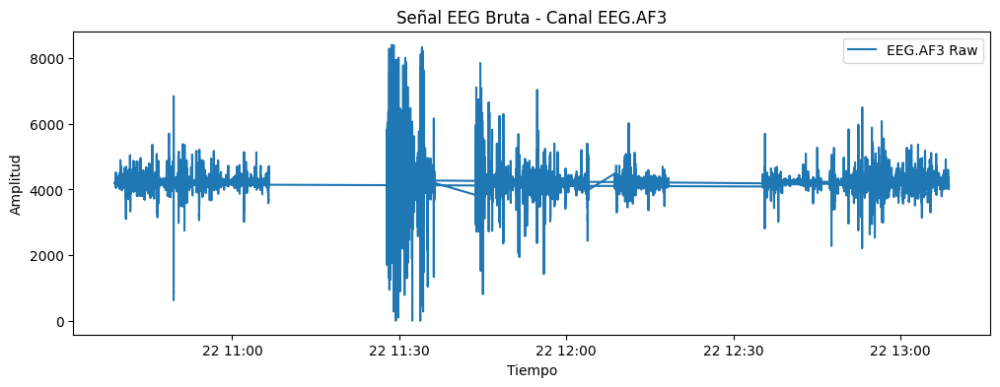

In [71]:
plt.figure(figsize=(12, 4))
plt.plot(df_eeg_temp['datetime'], df_eeg_temp['EEG.AF3'], label='EEG.AF3 Raw')
plt.title("Señal EEG Bruta - Canal EEG.AF3")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()
plt.show()


 La señal bruta muestra un offset elevado (los datos están centrados en 4000), lo cual es normal en algunos dispositivos de EEG que registran sobre una base DC alta. El dispositivo con el que se recogieron los datos era un Emotiv Epoc X, que tiende a guardar la señal con un nivel de base (DC) elevado. 

##### **Problema de las lecturas fallidas**

In [72]:
eeg.head()

,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
0,1.608630e+09,100,0,4207.692383,4216.410156,4190.256348,4209.743652,4228.717773,4200.000000,4204.615234,...,2,flying,1,1,flight,1,4206.025879,4209.871582,4211.110840,4209.914551
1,1.608630e+09,101,0,4194.871582,4198.974121,4218.461426,4192.820312,4184.615234,4185.641113,4194.871582,...,2,flying,1,1,flight,1,4201.281738,4193.461426,4188.375488,4191.623535
2,1.608630e+09,102,0,4200.512695,4200.000000,4191.794922,4196.410156,4183.589844,4199.487305,4202.563965,...,2,flying,1,1,flight,1,4197.179688,4199.358887,4195.213379,4206.666504
3,1.608630e+09,103,0,4178.461426,4181.025879,4193.846191,4174.871582,4186.153809,4191.794922,4186.153809,...,2,flying,1,1,flight,1,4182.051270,4174.102539,4188.034668,4182.393066
4,1.608630e+09,104,0,4170.769043,4175.384766,4208.205078,4170.769043,4187.179688,4186.153809,4182.563965,...,2,flying,1,1,flight,1,4181.282227,4163.461914,4185.299316,4156.410156


In [73]:
eeg.size

110365350

In [74]:
# Creamos una copia del DataFrame original para no modificarlo directamente
df_eeg_imputed = eeg.copy()

# Para cada columna que corresponda a un canal EEG (comienzan con "EEG.")
for col in df_eeg_imputed.columns:
    if col.startswith("EEG."):
        # Reemplazar 0.0 por NaN y luego interpolar de forma lineal en ambas direcciones
        df_eeg_imputed[col] = df_eeg_imputed[col].replace(0.0, np.nan).interpolate(method='linear', limit_direction='both')

# Visualizar algunos registros para confirmar
print("Vista previa del DataFrame con imputación de valores 0:")
df_eeg_imputed.head()

Vista previa del DataFrame con imputación de valores 0:


,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
0,1.608630e+09,100.0,1.0,4207.692383,4216.410156,4190.256348,4209.743652,4228.717773,4200.000000,4204.615234,...,2,flying,1,1,flight,1,4206.025879,4209.871582,4211.110840,4209.914551
1,1.608630e+09,101.0,1.0,4194.871582,4198.974121,4218.461426,4192.820312,4184.615234,4185.641113,4194.871582,...,2,flying,1,1,flight,1,4201.281738,4193.461426,4188.375488,4191.623535
2,1.608630e+09,102.0,1.0,4200.512695,4200.000000,4191.794922,4196.410156,4183.589844,4199.487305,4202.563965,...,2,flying,1,1,flight,1,4197.179688,4199.358887,4195.213379,4206.666504
3,1.608630e+09,103.0,1.0,4178.461426,4181.025879,4193.846191,4174.871582,4186.153809,4191.794922,4186.153809,...,2,flying,1,1,flight,1,4182.051270,4174.102539,4188.034668,4182.393066
4,1.608630e+09,104.0,1.0,4170.769043,4175.384766,4208.205078,4170.769043,4187.179688,4186.153809,4182.563965,...,2,flying,1,1,flight,1,4181.282227,4163.461914,4185.299316,4156.410156


In [75]:
def check_zeros_in_eeg(df, electrode_cols, group_cols, dataset_name):
    # Agrupar según las columnas indicadas
    grouped = df.groupby(group_cols)
    for group_key, group in grouped:
        # Ordenar el grupo por datetime para seguir la secuencia temporal
        group_sorted = group.sort_values('datetime')
        # Filtrar las filas donde alguna de las columnas de electrodos tenga 0.0
        zeros = group_sorted[group_sorted[electrode_cols].eq(0.0).any(axis=1)]
        if not zeros.empty:
            print(f"Dataset: {dataset_name} - Grupo: {group_key}")
            print(zeros[['datetime'] + electrode_cols])
            print("-" * 40)

# Definir la lista de columnas de electrodos a comprobar.
electrode_cols = [
    "EEG.AF3", "EEG.F7", "EEG.F3", "EEG.FC5",
    "EEG.F8", "EEG.AF4", "EEG.F4", "EEG.FC6",
    "EEG.T7", "EEG.P7", "EEG.O1", "EEG.T8",
    "EEG.P8", "EEG.O2"
]

print("Chequeo de valores 0.0 en los electrodos en df_eeg:")
check_zeros_in_eeg(df_eeg_imputed, electrode_cols, ['subject', 'flight', 'phase'], "EEG")

Chequeo de valores 0.0 en los electrodos en df_eeg:


In [76]:
df_eeg_imputed.size

110365350

OK

In [77]:
df_eeg_temp = df_eeg_imputed

In [78]:
df_eeg_temp.value_counts("theoretical_difficulty")

theoretical_difficulty
-1    249961
 1    209033
 2    151868
 3     69158
 4     55749
Name: count, dtype: int64

##### **Eliminación del offset**

El procedimiento que seguiremos será calcular la media para cada canal y restarla de cada muestra, de modo que los datos se centren en cero. La onda seguirá siendo la misma, pero en este caso, la media de cada canal será cero.

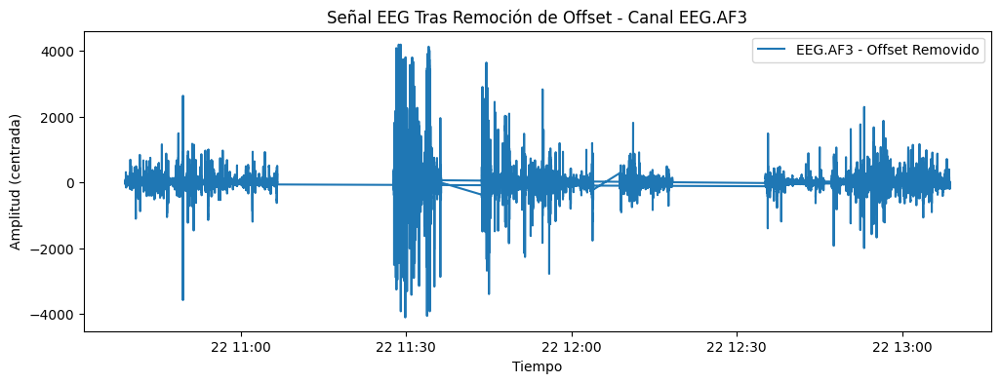

In [79]:
# Baseline removal from EEG signal
# Se resta la media de cada canal para centrar la señal
df_eeg_base = df_eeg_temp.copy()
for ch in electrode_cols:
    df_eeg_base[ch] = df_eeg_base[ch] - np.mean(df_eeg_base[ch])
    
plt.figure(figsize=(12, 4))
plt.plot(df_eeg_base['datetime'], df_eeg_base['EEG.AF3'], label='EEG.AF3 - Offset Removido')
plt.title("Señal EEG Tras Remoción de Offset - Canal EEG.AF3")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud (centrada)")
plt.legend()
plt.show()


Conseguido. De esta forma, la señal EEG está centrada en 0. Además, los picos, tanto positivos como negativos, ahora sí reflejan variaciones reales de la actividad cerebral, en lugar de estar sumados a un valor de referencia. Ahora ya podemos comenzar con la aplicación de filtros para eliminar ruido de la señal EEG.

##### **Filtrado de las señales**

###### **Filtros Notch (red eléctrica)**

En primer lugar, aplicamos dos filtros notch (doble muesca) a 50 y 60 Hz. Esto se debe al propósito de eliminar las interferencias de la señal eléctrica, que pueden introducir un ruido muy marcado en las señales EEG. Típicamente suelen ser de 50 (Europa) y 60 (América) Hz, de ahí los valores. 

Al aplicar estos filtros, eliminamos gran parte de la interferencia de la red en esas frecuencias concretas.

In [80]:
# Parámetros del filtro
fs = 2048  # Frecuencia de muestreo original (Hz)

# Filtros Notch para 50 Hz y 60 Hz
f0_50 = 50.0
f0_60 = 60.0
Q = 30.0  # Factor de calidad, ajustable
b_notch50, a_notch50 = iirnotch(f0_50, Q, fs)
b_notch60, a_notch60 = iirnotch(f0_60, Q, fs)

###### **Filtro cutoff**

La mayor parte de la actividad cerebral relevante para análisis de carga cognitiva se encuentra en frecuencias por debajo de ~50–60 Hz (bandas delta, theta, alpha, beta, gamma baja). Al fijar un cutoff de 64 Hz, aseguramos conservar las frecuencias que suelen asociarse a la actividad cerebral, descartando contenido de muy alta frecuencia (por ejemplo, ruido o contracciones musculares de muy alta frecuencia).

Así conservamos las bandas de interés, pero también eliminamos el ruido.

In [81]:
# Filtro paso bajo con cutoff a 64 Hz
cutoff = 64.0
nyq = fs / 2.0
normal_cutoff = cutoff / nyq
order = 4
b_low, a_low = butter(order, normal_cutoff, btype='low', analog=False)

###### **Resultado**

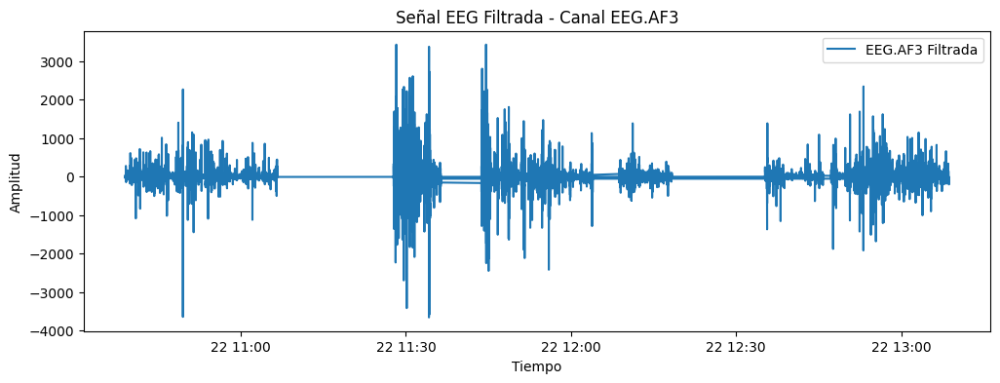

In [82]:
# Aplicar los filtros a cada canal de electrodos
df_eeg_filtered = df_eeg_base.copy()
for ch in electrode_cols:
    signal = df_eeg_filtered[ch].values
    # Filtro notch a 50 Hz
    signal = filtfilt(b_notch50, a_notch50, signal)
    # Filtro notch a 60 Hz
    signal = filtfilt(b_notch60, a_notch60, signal)
    # Filtro paso bajo a 64 Hz
    signal = filtfilt(b_low, a_low, signal)
    df_eeg_filtered[ch] = signal

plt.figure(figsize=(12, 4))
plt.plot(df_eeg_filtered['datetime'], df_eeg_filtered['EEG.AF3'], label='EEG.AF3 Filtrada')
plt.title("Señal EEG Filtrada - Canal EEG.AF3")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()
plt.show()


Como vemos, hemos conseguido hacer desaparecer la "vibración"/ruido correspondiente a esos 50/60 Hz. Además, se han atenuado los componentes por encima de 64 Hz, por lo que la señal ha quedado suavizada en sus picos más altos. Sim embargo, siguen existiendo, ya que pueden ser debidos a artefactos de baja frecuencia, como por ejemplo parpadeos, movimientos más lentos, movimientos musculares o microdesconexiones que ocurren en bandas de frecuencia más bajas de 64 Hz (eventos cerebrales transitorios de amplitud significativa). 

##### **Downsampling**

Con la señal filtrada a 64 Hz, nuestra atención se concentra en las frecuencias muy poer debajo de 128 Hz (T.Nyquist si muestreamos a 256Hz). Muestrear a 2048 Hz es excesivo para la banda de frecuencias que conservamos, esto implica almacenar y procesar muchos más datos de los necesarios, incrementando la carga computacional. Al reducir la frecuencia de muestreo a 256 Hz (factor 8), mantenemos toda la información cerebral relevante, mientras que descartamos muestras redundantes.

In [83]:
new_fs = 256  # Nueva frecuencia de muestreo deseada
downsample_factor = int(fs / new_fs)  # 2048/256 = 8

# Para downsampling, se toman cada 'downsample_factor'-ésima muestra
df_eeg_down = df_eeg_filtered.iloc[::downsample_factor].copy() # no filtra las frecuencias que podrían producir aliasing.

# Además, para cada canal, se usa decimate (que incluye un filtro antialiasing interno antes de descartar muestras, asegurando que no entren frecuencias superiores a la nueva mitad de Nyquist (128 Hz) en nuestra señal final)
# Ya habíamos aplicado un paso bajo a 64 Hz, así que aliasing era improbable, pero decimate añade una capa adicional de protección y exactitud en la reducción
for ch in electrode_cols:
    df_eeg_down[ch] = decimate(df_eeg_filtered[ch].values, downsample_factor, zero_phase=True)


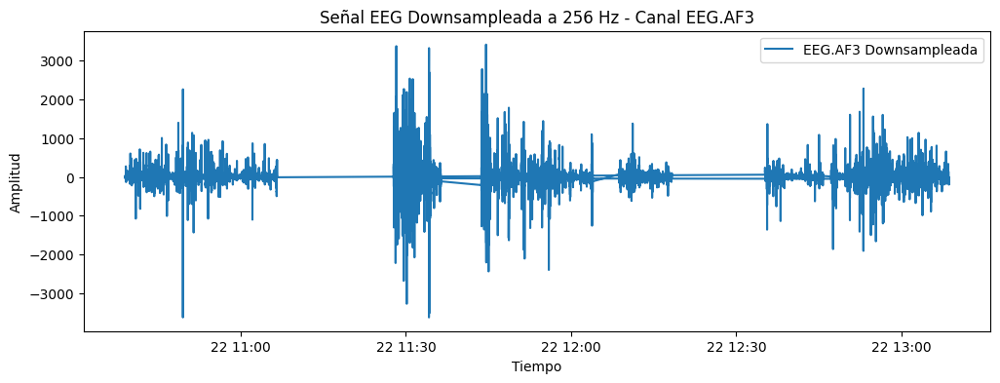

In [84]:
plt.figure(figsize=(12, 4))
plt.plot(df_eeg_down['datetime'], df_eeg_down['EEG.AF3'], label='EEG.AF3 Downsampleada')
plt.title("Señal EEG Downsampleada a 256 Hz - Canal EEG.AF3")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()
plt.show()


La forma global de la onda se mantiene, pero ahora hay menos muestras que describen esa misma forma. Visualmente, la señal es prácticamente idéntica, con picos y valles en los mismos lugares, pero representados por menos puntos de datos en el tiempo y con el dataset reducido a 1/8 de lo que era anteriormente. Así, el procesamiento posterior (ICA, extracción de características, entrenamiento de un modelo de IA) será más eficiente y seguiremos conservando la información relevante por debajo de 64 Hz. Hemos conseguido evitar almacenar y procesar datos redundantes por encima de la banda de frecuencias que nos interesa.

In [85]:
df_eeg_filtered.size

110365350

In [86]:
df_eeg_down.size

13795800

In [87]:
df_eeg_filtered.head()

,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
0,1.608630e+09,100.0,1.0,-1.563448,8.451566,-19.890517,1.934495,20.253074,-9.873795,-4.838816,...,2,flying,1,1,flight,1,4206.025879,4209.871582,4211.110840,4209.914551
1,1.608630e+09,101.0,1.0,-5.239518,4.282633,-18.458973,-1.489772,14.790251,-11.476371,-5.836789,...,2,flying,1,1,flight,1,4201.281738,4193.461426,4188.375488,4191.623535
2,1.608630e+09,102.0,1.0,-8.913558,0.116500,-17.024993,-4.912246,9.364676,-13.060807,-6.854052,...,2,flying,1,1,flight,1,4197.179688,4199.358887,4195.213379,4206.666504
3,1.608630e+09,103.0,1.0,-12.529724,-3.979551,-15.614607,-8.276091,4.068435,-14.595676,-7.864776,...,2,flying,1,1,flight,1,4182.051270,4174.102539,4188.034668,4182.393066
4,1.608630e+09,104.0,1.0,-16.034244,-7.942256,-14.251986,-11.528042,-1.012645,-16.052010,-8.844794,...,2,flying,1,1,flight,1,4181.282227,4163.461914,4185.299316,4156.410156


In [88]:
df_eeg_filtered.value_counts("theoretical_difficulty")

theoretical_difficulty
-1    249961
 1    209033
 2    151868
 3     69158
 4     55749
Name: count, dtype: int64

In [89]:
df_eeg_down.head()

,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
0,1.608630e+09,100.0,1.0,-1.649978,8.287249,-19.659659,1.860452,19.973281,-9.737410,-4.745057,...,2,flying,1,1,flight,1,4206.025879,4209.871582,4211.110840,4209.914551
8,1.608630e+09,108.0,1.0,-27.689439,-21.279338,-9.501633,-22.364793,-17.763725,-20.457948,-11.922459,...,2,flying,1,1,flight,1,4183.717773,4182.564453,4189.230957,4181.538574
16,1.608630e+09,116.0,1.0,-36.945143,-32.774552,-5.679118,-31.637021,-30.088349,-22.860650,-13.889868,...,2,flying,1,1,flight,1,4182.564453,4176.281738,4183.931641,4171.965820
24,1.608630e+09,124.0,1.0,-29.559542,-29.717005,-5.982051,-29.129999,-26.181730,-22.575395,-14.181004,...,2,flying,1,1,flight,1,4178.076660,4174.358887,4180.000000,4181.367676
32,1.608630e+09,3.0,1.0,-20.897106,-24.994006,-6.643862,-25.635590,-24.696531,-26.562273,-19.513307,...,2,flying,1,1,flight,1,4196.153809,4196.410156,4186.666504,4191.453125


In [90]:
df_eeg_down.shape

(91972, 150)

In [91]:
df_eeg_down.value_counts("theoretical_difficulty")

theoretical_difficulty
-1    31245
 1    26130
 2    18983
 3     8645
 4     6969
Name: count, dtype: int64

Eliminamos dicha columna porque presenta muchos nulos y no nos aporta infromación alguna. 

In [92]:
df_eeg_down.drop(columns=['EEG.MarkerHardware'])

,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
0,1.608630e+09,100.0,1.0,-1.649978,8.287249,-19.659659,1.860452,19.973281,-9.737410,-4.745057,...,2,flying,1,1,flight,1,4206.025879,4209.871582,4211.110840,4209.914551
8,1.608630e+09,108.0,1.0,-27.689439,-21.279338,-9.501633,-22.364793,-17.763725,-20.457948,-11.922459,...,2,flying,1,1,flight,1,4183.717773,4182.564453,4189.230957,4181.538574
16,1.608630e+09,116.0,1.0,-36.945143,-32.774552,-5.679118,-31.637021,-30.088349,-22.860650,-13.889868,...,2,flying,1,1,flight,1,4182.564453,4176.281738,4183.931641,4171.965820
24,1.608630e+09,124.0,1.0,-29.559542,-29.717005,-5.982051,-29.129999,-26.181730,-22.575395,-14.181004,...,2,flying,1,1,flight,1,4178.076660,4174.358887,4180.000000,4181.367676
32,1.608630e+09,3.0,1.0,-20.897106,-24.994006,-6.643862,-25.635590,-24.696531,-26.562273,-19.513307,...,2,flying,1,1,flight,1,4196.153809,4196.410156,4186.666504,4191.453125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
735736,1.608636e+09,77.0,1.0,-8.635458,-21.674616,-40.115802,-32.110792,-21.404494,-38.154204,-56.824025,...,1,flying,2,4,flight,3,4168.846191,4199.102539,4163.589844,4151.624023
735744,1.608636e+09,85.0,1.0,27.784210,24.743651,-17.288893,4.803908,6.739834,-14.854775,-27.718068,...,1,flying,2,4,flight,3,4228.333008,4249.358887,4196.410645,4198.290527
735752,1.608636e+09,93.0,1.0,76.208304,77.921209,16.554867,52.489613,52.366709,23.612133,19.046403,...,1,flying,2,4,flight,3,4265.000000,4276.282227,4248.547363,4217.265137
735760,1.608636e+09,101.0,1.0,97.697364,102.743635,34.308771,74.283425,75.372758,44.075740,40.143114,...,1,flying,2,4,flight,3,4322.564453,4344.615234,4299.487305,4299.658203


##### **Eliminación de artefactos-ICA**

El Análisis de Componentes Independientes (ICA) descompone la señal multicanal (en este caso, cada canal EEG es una dimensión) en combinaciones lineales llamadas fuentes o componentes independientes. Estas componentes tienden a aislar distintas fuentes de variación, como la actividad cerebral real, parpadeos, movimientos musculares, etc. En EEG, se aplica ICA precisamente para separar la señal “pura” de los artefactos.

Con este procedimiento, aplicamos ICA para descomponer la señal EEG en componentes independientes y luego identificamos (usando la kurtosis) aquellas componentes que presentan artefactos. Al eliminar dichas componentes y reconstruir la señal, obtenemos un registro más limpio, adecuado para la extracción de características y el entrenamiento de modelos de IA para la detección de carga cognitiva. Este enfoque es ampliamente utilizado en análisis EEG y ayuda a mejorar la calidad de los datos sin perder información importante de la actividad cerebral.

Primero se extraen las columnas de interés (los canales EEG) del DataFrame df_eeg_down para formar la matriz X. Cada fila corresponde a una muestra temporal y cada columna a un canal EEG. Esto es necesario para aplicar ICA, ya que se trabaja sobre datos multivariantes.

Después, se configura FastICA con el número de componentes igual al número de canales. La función fit_transform descompone la señal original en una serie de componentes independientes (almacenadas en sources). Cada componente idealmente captura una fuente subyacente (actividad cerebral, parpadeo, movimiento, etc.).

In [93]:
# Preparar la matriz de datos para ICA
# Extraemos los datos de los canales de electrodos en una matriz X (forma: num_muestras x num_canales)
X = df_eeg_down[electrode_cols].values
print("Forma de la matriz X:", X.shape)

# Aplicar FastICA
# Se inicializa FastICA con n_components igual al número de canales (para descomponer completamente la señal)
ica = FastICA(n_components=len(electrode_cols), random_state=42)
sources = ica.fit_transform(X)
print("Forma de la matriz de fuentes (sources):", sources.shape)
# Ahora, 'sources' contiene las componentes independientes que, idealmente, separan la actividad cerebral de los artefactos.


Forma de la matriz X: (91972, 14)


/opt/anaconda3/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


Forma de la matriz de fuentes (sources): (91972, 14)


La kurtosis mide la “puntiagudez” o presencia de colas pesadas en la distribución de cada componente. Valores muy altos (o muy bajos) indican que la componente tiene picos muy pronunciados, lo que es característico de artefactos (como parpadeos o interferencias musculares). En este ejemplo se imprime la kurtosis de cada componente para identificar cuáles son sospechosas.

In [94]:
# Calcular la Kurtosis de cada componente
# La kurtosis nos ayuda a identificar componentes con picos muy pronunciados (posibles artefactos)
kurt_values = kurtosis(sources, fisher=True)  # Con fisher=True, una distribución normal tiene kurtosis 0.
print("Kurtosis de cada componente ICA:")
for i, k_val in enumerate(kurt_values):
    print(f"  Componente {i}: {k_val:.2f}")

Kurtosis de cada componente ICA:
  Componente 0: 51.65
  Componente 1: 185.22
  Componente 2: 65.15
  Componente 3: 199.28
  Componente 4: 38.72
  Componente 5: 1104.32
  Componente 6: 68.63
  Componente 7: 97.14
  Componente 8: 311.69
  Componente 9: 43.03
  Componente 10: 51.56
  Componente 11: 1794.08
  Componente 12: 104.90
  Componente 13: 41.82


Componentes con kurtosis extremadamente alta:
- Componente 5: 1102.31
- Componente 11: 1793.66
- Componente 8: 311.60

Estas tres tienen valores muy altos, lo que indica picos muy pronunciados que son característicos de artefactos (por ejemplo, parpadeos, movimientos musculares o interferencias bruscas).

Componentes con kurtosis moderadamente alta:
- Componente 1: 185.22
- Componente 3: 199.27

Estos valores también son elevados en comparación con los valores más bajos (por ejemplo, 38–65), pero no tan extremos como los anteriores. Aquí conviene hacer una inspección visual para determinar si realmente corresponden a artefactos o si parte de la actividad cerebral de interés también se ve reflejada en ellas.

Componentes con kurtosis baja o moderada (consideradas “normales”):
- Componentes 0, 2, 4, 6, 7, 9, 10, 12 y 13 presentan valores entre ~38 y ~105, lo que sugiere que no tienen picos exagerados.

Con base en estos valores, las componentes 5, 8 y 11 se identifican de forma clara como artefactos y deberían eliminarse (ponerlas a cero) para reconstruir la señal limpia. De todas formas, visualizaremos las kurtosis de todas las componentes para poder decidir qué hacer con las dos que tenemos en duda. 

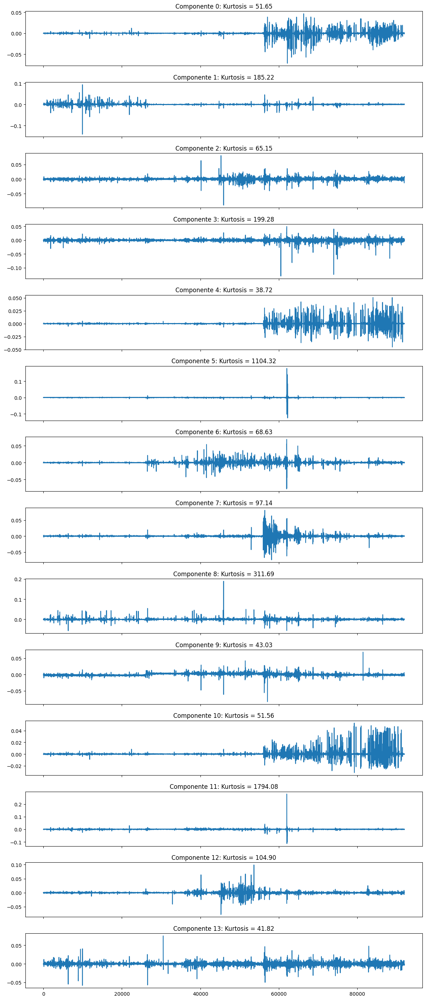

In [95]:
# Visualizar cada componente con su kurtosis
num_components = sources.shape[1]
fig, axs = plt.subplots(num_components, 1, figsize=(12, 2*num_components), sharex=True)
for i in range(num_components):
    axs[i].plot(sources[:, i])
    axs[i].set_title(f"Componente {i}: Kurtosis = {kurt_values[i]:.2f}")
plt.tight_layout()
plt.show()

En las componenentes 5 y 11 observamos de forma muy clara esos impulsos breves y muy amplios que están relacionados con movimientos musculares, parpadeos, etc (ajenos a una actividad cerebral normal, como se puede observar en la componente 8). Además, presentaban una kurtosis alta como ya sabíamos, por lo que las eliminaremos. En la componente 8 observamos lo mismo aunque de una forma más sutíl, y a pesar de su alta kurtosis, la dejaremos ya que salvo ese pico, sí podemos ver una actividad cerebral normal. Para las componentes 1 y 3, observamos lo mismo que en la 8 pero de una forma más suave, por lo que las dejaremos también.

Se define un umbral (312). Todas las componentes con un valor absoluto de kurtosis superior a este umbral se consideran artefactos. En el código, estos índices se almacenan en artifact_indices y se eliminan (se ponen a cero) en la matriz sources_clean.

In [96]:
# Identificar y eliminar componentes artefactuosas
# Definimos un umbral para la kurtosis;
# Las componentes cuyo valor absoluto de kurtosis supere este umbral se considerarán artefactos.
threshold = 312.0
artifact_indices = np.where(np.abs(kurt_values) > threshold)[0]
print("\nComponentes identificadas como artefacto (|kurtosis| > 312):", artifact_indices)

# Creamos una copia de las fuentes y ponemos a cero las componentes identificadas como artefacto.
sources_clean = sources.copy()
sources_clean[:, artifact_indices] = 0


Componentes identificadas como artefacto (|kurtosis| > 312): [ 5 11]


Así quedan eliminadas.

Con la matriz sources_clean (donde las componentes artefactuosas han sido eliminadas), se aplica la transformación inversa (inverse_transform) para reconstruir la señal EEG. La señal reconstruida, reconstructed_clean, debería tener menos picos anómalos y artefactos.

In [97]:
# Reconstruir la señal usando las componentes "limpias"
# La señal reconstruida se obtiene aplicando la transformación inversa de ICA.
reconstructed_clean = ica.inverse_transform(sources_clean)

Se genera una gráfica en la que se compara la señal original (contenida en X) con la señal reconstruida tras la eliminación de componentes artefactuosas, usando el canal “EEG.AF3” como ejemplo. Esta comparación te permite verificar visualmente la efectividad de la eliminación de artefactos: la señal limpia debería mostrar una reducción en los picos anómalos sin perder la información cerebral relevante.

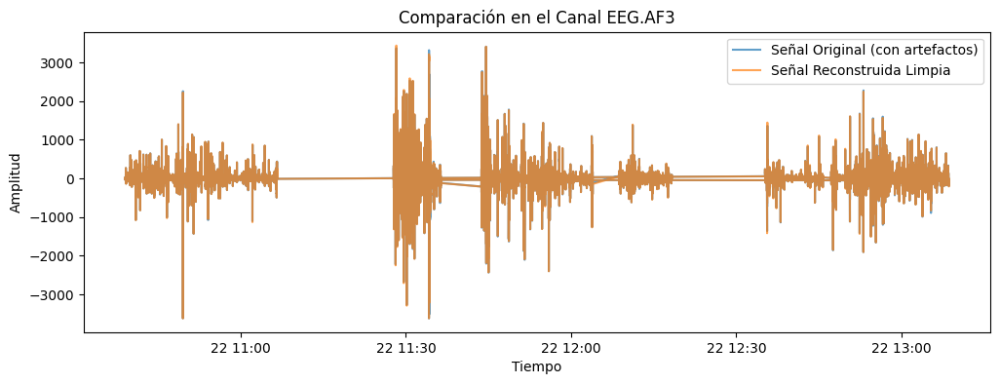

In [98]:
# Visualización comparativa
# Compararemos la señal original (la matriz X) con la señal reconstruida tras eliminar las componentes artefactuosas.
# Tomaremos como ejemplo el canal "EEG.AF3". Primero, obtenemos el índice de dicho canal.
channel = 'EEG.AF3'
channel_idx = electrode_cols.index(channel)

plt.figure(figsize=(12, 4))
plt.plot(df_eeg_down['datetime'], X[:, channel_idx], label="Señal Original (con artefactos)", alpha=0.7)
plt.plot(df_eeg_down['datetime'], reconstructed_clean[:, channel_idx], label="Señal Reconstruida Limpia", alpha=0.7)
plt.title(f"Comparación en el Canal {channel}")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()
plt.show()

Hemos logrado de esta forma reducir mínimamente los picos más grandes, aunque no todos. Al eliminar alguna de las componentes que finalmente no fue suprimida, observamos también que los picos se reducían drásticamente, llegando incluso a perder la forma original de la señal. Al no eliminar demasiadas componentes, se corre menos riesgo de suprimir también actividad cerebral de interés.

Copiamos entonces el DataFrame de la señal downsampleada (df_eeg_down) y reemplazamos los valores de los canales de electrodos por la señal reconstruida por ICA.

In [99]:
# Crear el DataFrame final a partir de df_eeg_down
df_eeg_ica = df_eeg_down.copy()

# Actualizamos cada canal de electrodos con la señal reconstruida
for i, ch in enumerate(electrode_cols):
    df_eeg_ica[ch] = reconstructed_clean[:, i]

# Verificamos la actualización (por ejemplo, mostrando las primeras filas)
print("Vista previa de df_eeg_ica:")
df_eeg_ica.head()

Vista previa de df_eeg_ica:


,timestamp,EEG.Counter,EEG.Interpolated,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,...,subject,role,perceived_difficulty,theoretical_difficulty,phase,flight,mean_upper_left,mean_upper_right,mean_lower_left,mean_lower_right
0,1.608630e+09,100.0,1.0,-2.575419,7.880996,-20.490490,1.819986,19.620744,-10.998531,-3.148953,...,2,flying,1,1,flight,1,4206.025879,4209.871582,4211.110840,4209.914551
8,1.608630e+09,108.0,1.0,-25.373917,-18.049416,-7.404799,-17.818692,-14.328360,-19.357124,-17.669215,...,2,flying,1,1,flight,1,4183.717773,4182.564453,4189.230957,4181.538574
16,1.608630e+09,116.0,1.0,-33.640976,-28.723717,-2.691558,-26.270722,-25.830051,-20.771721,-21.648194,...,2,flying,1,1,flight,1,4182.564453,4176.281738,4183.931641,4171.965820
24,1.608630e+09,124.0,1.0,-27.025504,-26.566680,-3.690470,-24.926811,-22.865595,-21.013868,-20.165609,...,2,flying,1,1,flight,1,4178.076660,4174.358887,4180.000000,4181.367676
32,1.608630e+09,3.0,1.0,-19.769533,-23.074508,-5.619958,-22.725702,-22.623766,-26.347982,-22.586329,...,2,flying,1,1,flight,1,4196.153809,4196.410156,4186.666504,4191.453125


In [100]:
df_eeg_ica.value_counts("theoretical_difficulty")

theoretical_difficulty
-1    31245
 1    26130
 2    18983
 3     8645
 4     6969
Name: count, dtype: int64

###### MNE

MNE trabaja con objetos Raw, así que debemos transformar los datos EEG de nuestro DataFrame a un RawArray. Para ello, extraemos la matriz de datos (los 14 canales) y creamos un diccionario de información (info) con los nombres de los canales y la frecuencia de muestreo (en este ejemplo, asumiremos 128 Hz).

Canales EEG encontrados: ['EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4']
Creating RawArray with float64 data, n_channels=14, n_times=91972
    Range : 0 ... 91971 =      0.000 ...   359.262 secs
Ready.
Objeto Raw creado con 14 canales y sfreq = 256.0
Renombramiento de canales: {'EEG.AF3': 'AF3', 'EEG.F7': 'F7', 'EEG.F3': 'F3', 'EEG.FC5': 'FC5', 'EEG.T7': 'T7', 'EEG.P7': 'P7', 'EEG.O1': 'O1', 'EEG.O2': 'O2', 'EEG.P8': 'P8', 'EEG.T8': 'T8', 'EEG.FC6': 'FC6', 'EEG.F4': 'F4', 'EEG.F8': 'F8', 'EEG.AF4': 'AF4'}
Montage asignado. Puntos de digitalización:
[<DigPoint |        LPA : (-82.5, 0.0, 0.0) mm      : head frame>, <DigPoint |     Nasion : (-0.0, 114.0, 0.0) mm     : head frame>, <DigPoint |        RPA : (82.5, -0.0, -0.0) mm     : head frame>, <DigPoint |     EEG #7 : (-35.2, 109.1, 56.4) mm   : head frame>, <DigPoint |    EEG #11 : (34.2, 109.8, 57.1) mm    : head frame>, <DigPoint |    EE

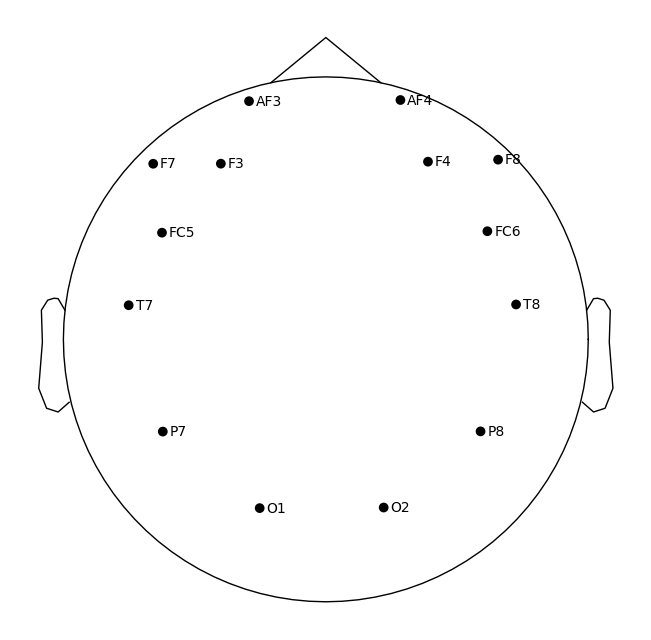

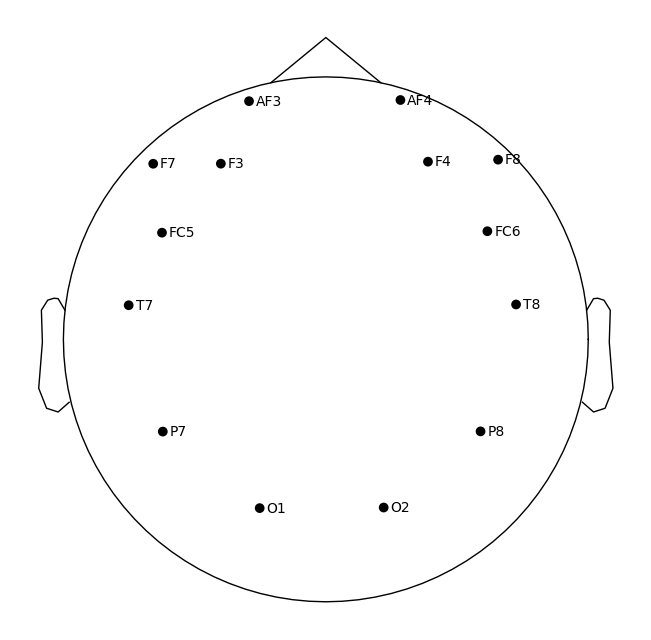

In [ ]:
import mne
import pandas as pd
import numpy as np

# Suponemos que df_eeg_down tiene una columna 'datetime' y columnas EEG.xxx (14 canales)
# Extraemos la columna de tiempo
datetime_series = pd.to_datetime(df_eeg_down['datetime'])

# Extraemos los datos EEG (suponemos que las columnas empiezan con "EEG.")
eeg_columns = [col for col in df_eeg_down.columns if col.startswith("EEG.")]
# variables que NO queremos
exclude = [
    'EEG.MarkerHardware',
    'EEG.Interpolated',
    'EEG.Counter',
    'EEG.RawCq',
    'EEG.Battery'
]

# filtramos correctamente
eeg_columns = [c for c in eeg_columns if c not in exclude]
print("Canales EEG encontrados:", eeg_columns)

# La matriz de datos debe tener forma (n_channels, n_samples) para RawArray,
# por ello transponemos
eeg_data = df_eeg_down[eeg_columns].values.T  # forma: (n_channels, n_samples)

# Definir la frecuencia de muestreo 
sfreq = 128

# Crear el objeto info
info = mne.create_info(ch_names=eeg_columns, sfreq=sfreq, ch_types=['eeg'] * len(eeg_columns))

# Crear el objeto RawArray a partir de los datos EEG
raw = mne.io.RawArray(eeg_data, info)
print("Objeto Raw creado con", raw.info['nchan'], "canales y sfreq =", raw.info['sfreq'])

# 6. Renombrar los canales para que coincidan con el montaje estándar
# En el montaje 'standard_1020', los nombres son, por ejemplo, 'AF3' en lugar de 'EEG.AF3'
mapping = {ch: ch.replace("EEG.", "") for ch in raw.info['ch_names']}
print("Renombramiento de canales:", mapping)
raw.rename_channels(mapping)

# 7. Asignar un montage estándar para que se agreguen las posiciones de los electrodos
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='warn')
print("Montage asignado. Puntos de digitalización:")
print(raw.info['dig'])

# (Opcional) Visualizar los sensores para confirmar que las posiciones se asignaron
raw.plot_sensors(show_names=True)

Fitting ICA to data using 14 channels (please be patient, this may take a while)


/var/folders/ly/phg61q055118ytxc75c_b9cw0000gn/T/ipykernel_74107/3434200300.py:7: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 14 components
Fitting ICA took 1.2s.
ICA ajustada a la señal.


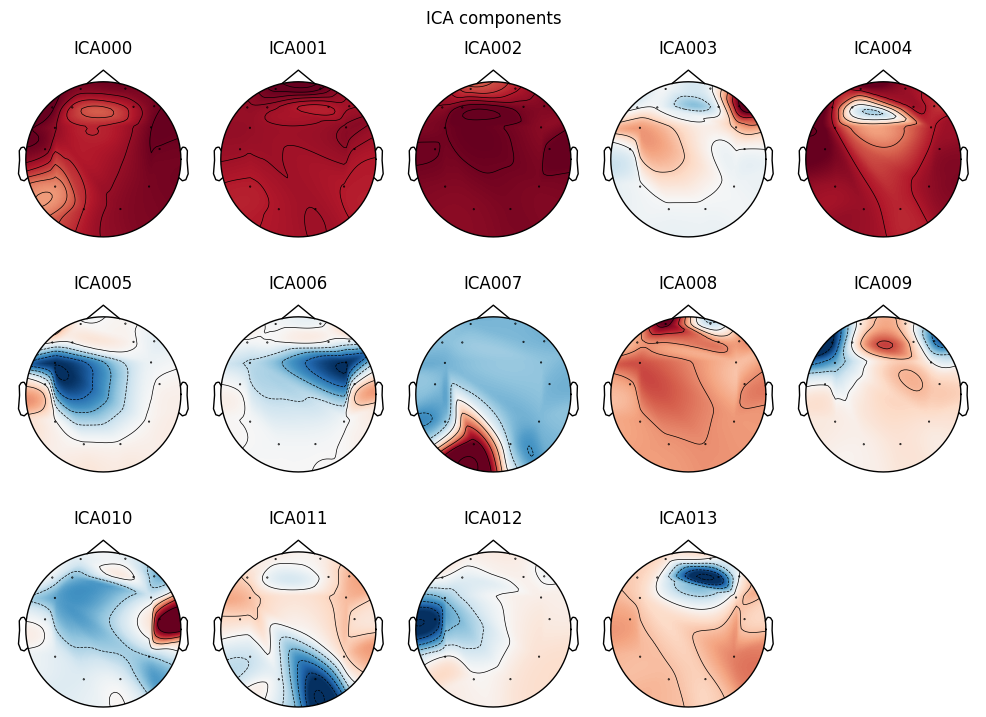

Kurtosis de cada componente:
  Componente 0: 97.87
  Componente 1: 51.14
  Componente 2: 64.75
  Componente 3: 49.03
  Componente 4: 185.58
  Componente 5: 38.62
  Componente 6: 40.82
  Componente 7: 1094.48
  Componente 8: 66.32
  Componente 9: 213.83
  Componente 10: 309.10
  Componente 11: 2079.85
  Componente 12: 41.94
  Componente 13: 41.80

Componentes identificadas como artefacto (|kurtosis| > 312): [ 7 11]
Componentes excluidas: [7, 11]


In [102]:
from mne.preprocessing import ICA
from scipy.stats import kurtosis
import matplotlib.pyplot as plt

# Configurar ICA: usar n_components igual al número de canales (aquí 14)
ica = ICA(n_components=len(eeg_columns), random_state=42, max_iter='auto')
ica.fit(raw)
print("ICA ajustada a la señal.")

# Visualizar las componentes para inspección manual (esto abre una ventana interactiva)
ica.plot_components(show=True)

# Obtener las fuentes (componentes) como un array; la forma será (n_components, n_samples)
sources = ica.get_sources(raw).get_data()
kurt_vals = kurtosis(sources, axis=1, fisher=True)
print("Kurtosis de cada componente:")
for i, k in enumerate(kurt_vals):
    print(f"  Componente {i}: {k:.2f}")

# Definir un umbral para considerar artefactos. Por ejemplo, usaremos 312 (como en el ejemplo previo).
threshold = 312.0
artifact_indices = np.where(np.abs(kurt_vals) > threshold)[0]
print("\nComponentes identificadas como artefacto (|kurtosis| > 312):", artifact_indices)

# (Basado en la inspección visual y cuantitativa, se decide excluir las componentes 5 y 11, por ejemplo.)
ica.exclude = list(artifact_indices)  # o manualmente: ica.exclude = [5, 11]
print("Componentes excluidas:", ica.exclude)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components
Señal limpia obtenida tras aplicar ICA.
Using matplotlib as 2D backend.


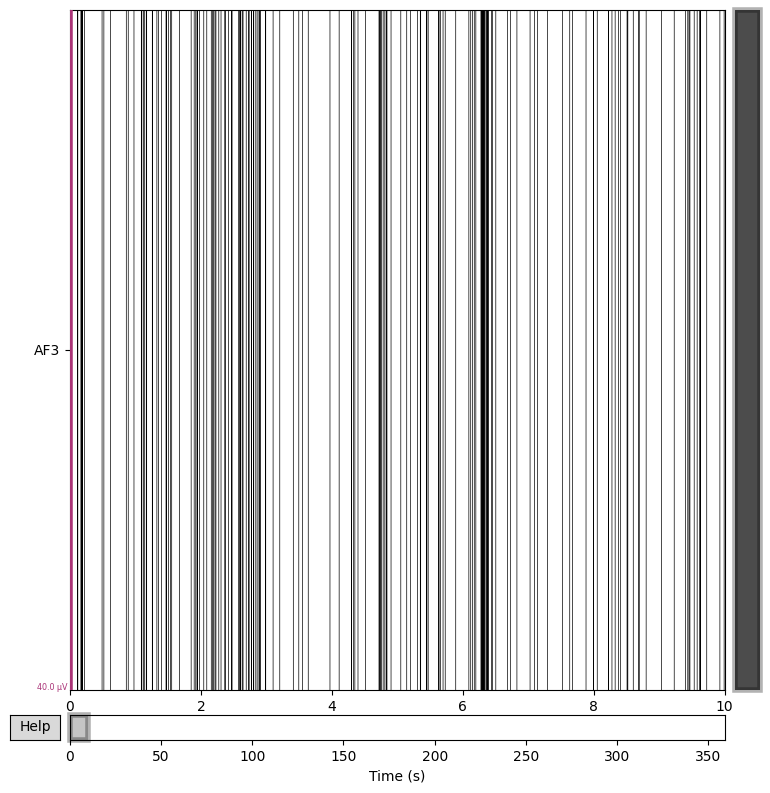

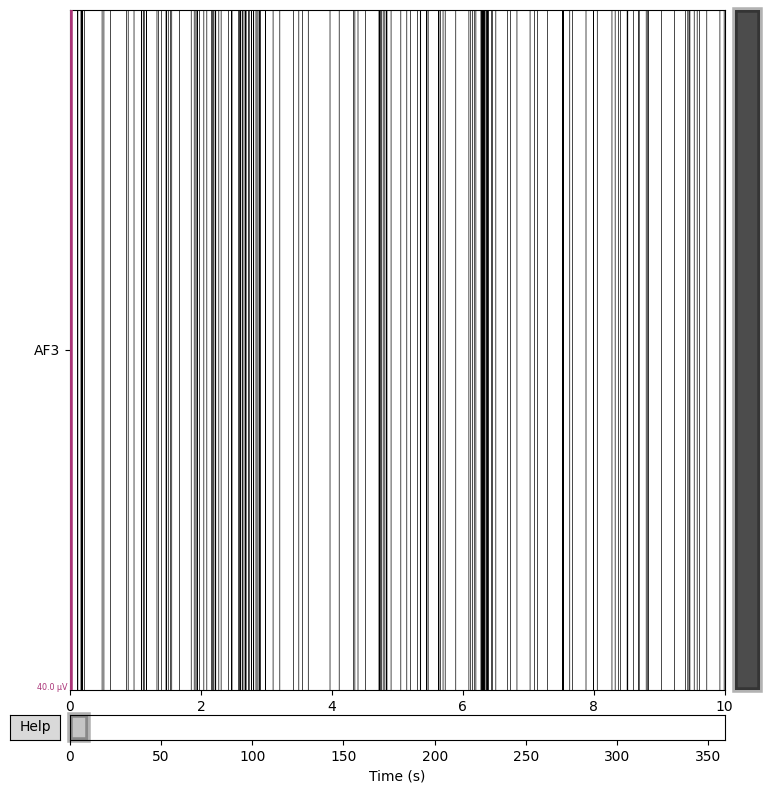

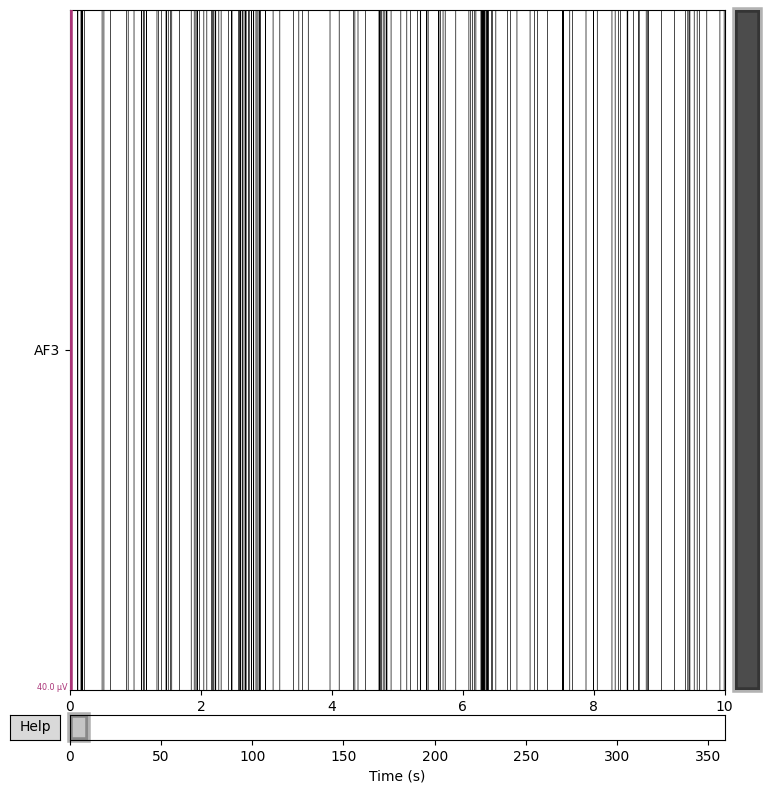

In [103]:
# Aplicar ICA para remover los artefactos: se crea un objeto raw_clean con la señal "limpia"
raw_clean = ica.apply(raw.copy())
print("Señal limpia obtenida tras aplicar ICA.")

raw.plot(n_channels=1, picks='AF3', title='Señal Original - AF3', show=True)
raw_clean.plot(n_channels=1, picks='AF3', title='Señal Limpia tras ICA - AF3', show=True)

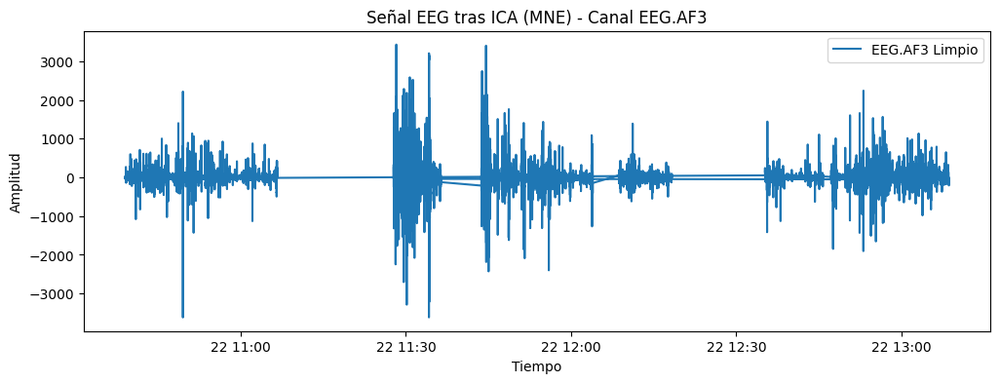

In [104]:
# Obtener los datos limpios de raw_clean. raw_clean.get_data() devuelve un array de forma (n_channels, n_samples)
eeg_clean = raw_clean.get_data()  # shape: (n_channels, n_samples)
# Transponer para que cada fila corresponda a una muestra temporal y cada columna a un canal
eeg_clean = eeg_clean.T

# Crear un DataFrame con las columnas correspondientes a los electrodos
df_eeg_ica2 = pd.DataFrame(eeg_clean, columns=eeg_columns)

# Recuperar o reconstruir la columna datetime.
# RawArray tiene un vector de tiempos (raw_clean.times) en segundos desde 0; se usa el primer datetime como referencia.
start_time = datetime_series.iloc[0]
times = raw_clean.times  # vector de tiempos en segundos
df_eeg_ica2['datetime'] = [start_time + pd.Timedelta(seconds=t) for t in times]


# Visualizar, por ejemplo, el canal EEG.AF3 de df_eeg_ica
plt.figure(figsize=(12, 4))
plt.plot(df_eeg_ica['datetime'], df_eeg_ica['EEG.AF3'], label="EEG.AF3 Limpio")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.title("Señal EEG tras ICA (MNE) - Canal EEG.AF3")
plt.legend()
plt.show()

In [105]:
print("Vista previa de df_eeg_ica:")
df_eeg_ica2.head()

Vista previa de df_eeg_ica:


,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,EEG.O2,EEG.P8,EEG.T8,EEG.FC6,EEG.F4,EEG.F8,EEG.AF4,datetime
0,-2.400993,7.943624,-20.558160,1.710656,19.635897,-11.000716,-3.170144,-3.256737,-2.039187,4.270565,-6.408579,18.948996,-6.520001,-10.535606,2020-12-22 10:38:58.234317000
1,-24.913031,-17.774454,-7.782415,-17.842469,-14.235399,-19.643764,-18.359679,-16.988588,-16.835372,-22.013348,-19.207385,-8.247190,-22.602099,-26.413649,2020-12-22 10:38:58.238223250
2,-33.139134,-28.320457,-3.070970,-26.060197,-25.609417,-21.139619,-22.617791,-20.913585,-20.362215,-31.787830,-23.690503,-17.544888,-29.874425,-30.862900,2020-12-22 10:38:58.242129500
3,-26.652161,-26.287026,-4.009449,-24.821012,-22.732205,-21.308221,-20.855774,-18.485455,-18.414450,-29.035117,-19.237233,-11.392092,-27.564839,-23.342753,2020-12-22 10:38:58.246035750
4,-19.514954,-23.033523,-5.942670,-23.001237,-22.719889,-26.529152,-22.777242,-19.098046,-21.062886,-27.822815,-15.784609,-7.534658,-25.618142,-17.211048,2020-12-22 10:38:58.249942000


In [106]:
df_eeg_ica2.shape

(91972, 15)

In [107]:
df_eeg_ica2['datetime'].describe()

count                            91972
mean     2020-12-22 10:41:57.865176832
min         2020-12-22 10:38:58.234317
25%      2020-12-22 10:40:28.049746688
50%      2020-12-22 10:41:57.865176576
75%      2020-12-22 10:43:27.680606208
max      2020-12-22 10:44:57.496035750
Name: datetime, dtype: object

###### ICA por sujeto

In [108]:
print("Índices coincidentes?", df_eeg_filtered.index.isin(eeg.index).all())

df_eeg_filtered['subject'] = eeg['subject'].loc[df_eeg_filtered.index].values

print(df_eeg_filtered[['datetime','subject']].head())

Índices coincidentes? True
                    datetime  subject
0 2020-12-22 10:38:58.234317        2
1 2020-12-22 10:38:58.242099        2
2 2020-12-22 10:38:58.249981        2
3 2020-12-22 10:38:58.257764        2
4 2020-12-22 10:38:58.265646        2


In [109]:
# Lista de canales EEG
electrode_cols = [
    'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5',
    'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2',
    'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4',
    'EEG.F8', 'EEG.AF4'
]

# Lista de sujetos a procesar (se asume que la columna 'subject' existe)
subjects = df_eeg_filtered['subject'].unique()
print("Número de sujetos únicos en df_eeg_filtered:", len(subjects))
print("Sujetos encontrados:", subjects)

# Lista para almacenar los DataFrames procesados por sujeto
list_dfs = []

Número de sujetos únicos en df_eeg_filtered: 2
Sujetos encontrados: [2 1]



Procesando sujeto: 2
  Número de muestras: 447858
  Rango de tiempo: 2020-12-22 10:38:58.234317 a 2020-12-22 13:08:40.872047
Creating RawArray with float64 data, n_channels=14, n_times=447858
    Range : 0 ... 447857 =      0.000 ...  1749.441 secs
Ready.


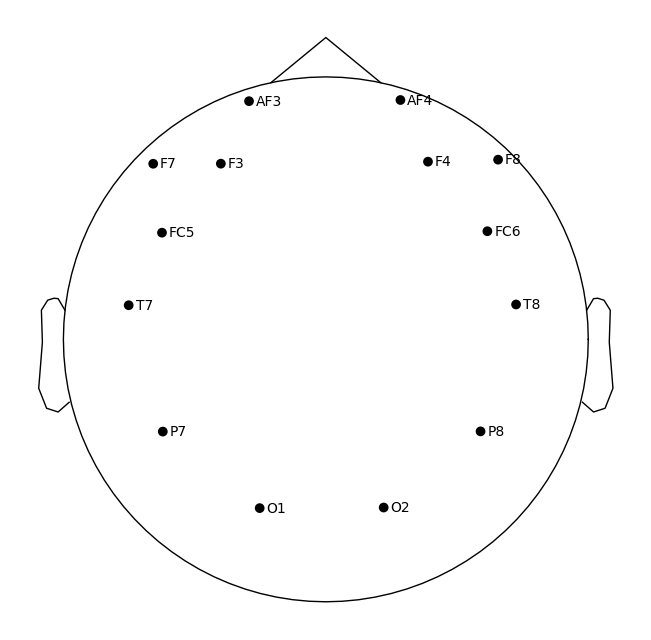

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.1s finished


Fitting ICA took 2.8s.
ICA ajustada correctamente tras aplicar el filtro high-pass.


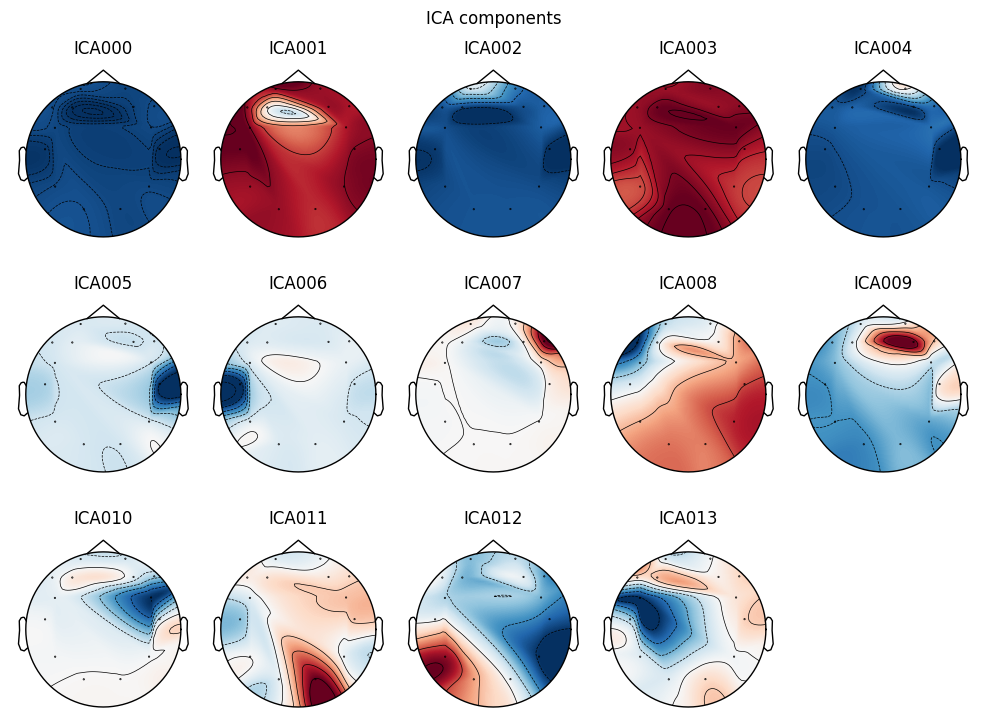

Creating RawArray with float64 data, n_channels=14, n_times=447858
    Range : 0 ... 447857 =      0.000 ...  1749.441 secs
Ready.


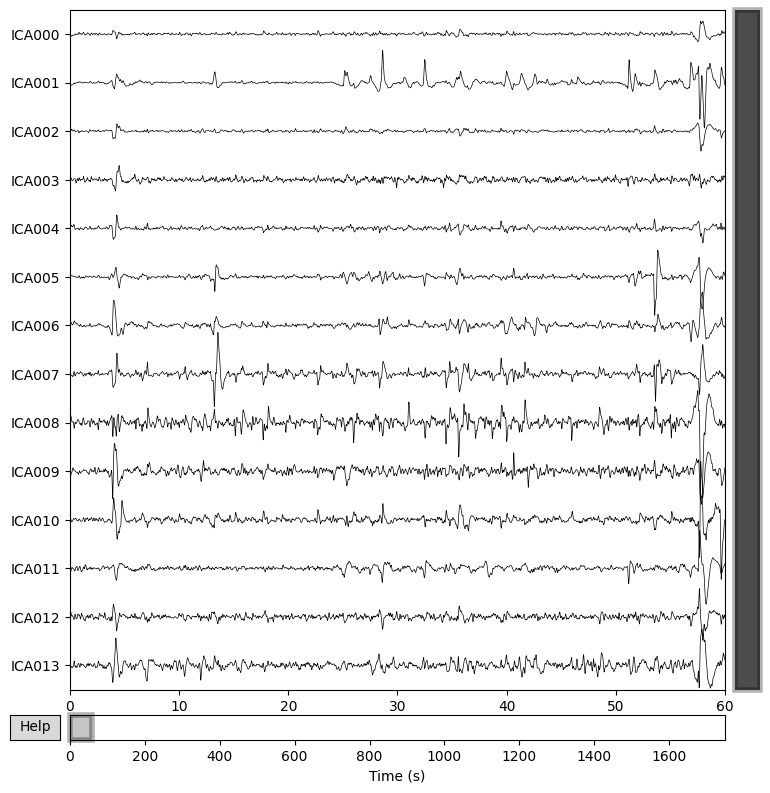

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
874 matching events found
No baseline correction applied
0 projection items activated


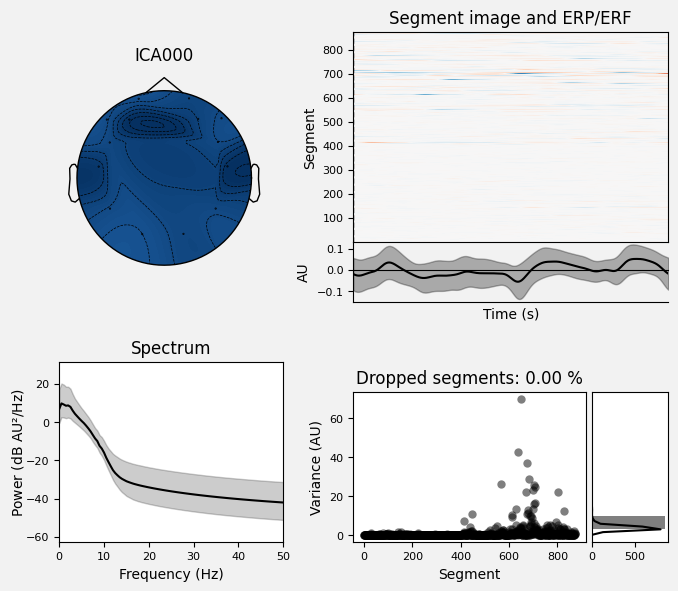

  Kurtosis de cada componente:
    Componente 0: 76.31
    Componente 1: 616.36
    Componente 2: 120.55
    Componente 3: 28.66
    Componente 4: 84.98
    Componente 5: 666.04
    Componente 6: 115.87
    Componente 7: 58.51
    Componente 8: 16.92
    Componente 9: 216.54
    Componente 10: 161.95
    Componente 11: 58.50
    Componente 12: 160.90
    Componente 13: 14.93
  Componentes identificadas como artefacto (|kurtosis| > 312): [1 5]
  Componentes excluidas: [1, 5]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components
  Señal limpia obtenida para el sujeto.

Procesando sujeto: 1
  Número de muestras: 287911
  Rango de tiempo: 2020-12-22 11:27:45.790989 a 2020-12-22 12:18:18.321510
Creating RawArray with float64 data, n_channels=14, n_times=287911
    Range : 0 ... 287910 =      0.000 ...  1124.648 secs
Ready.


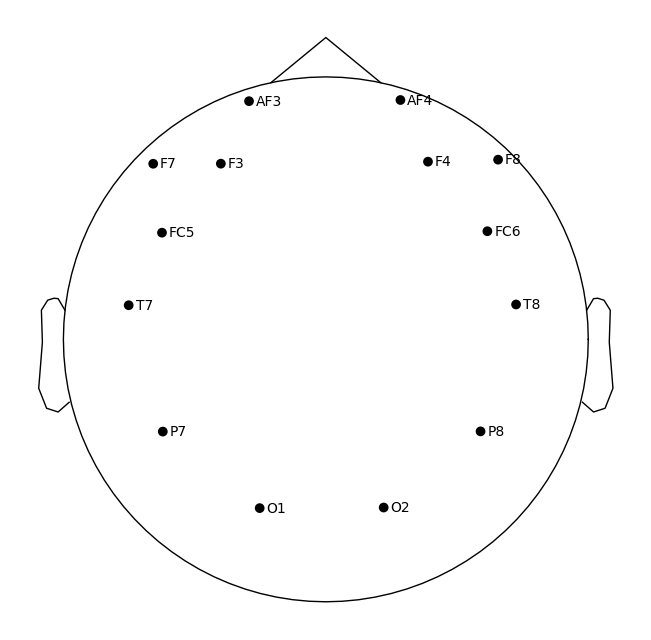

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 845 samples (3.301 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.1s finished


Fitting ICA took 9.3s.
ICA ajustada correctamente tras aplicar el filtro high-pass.


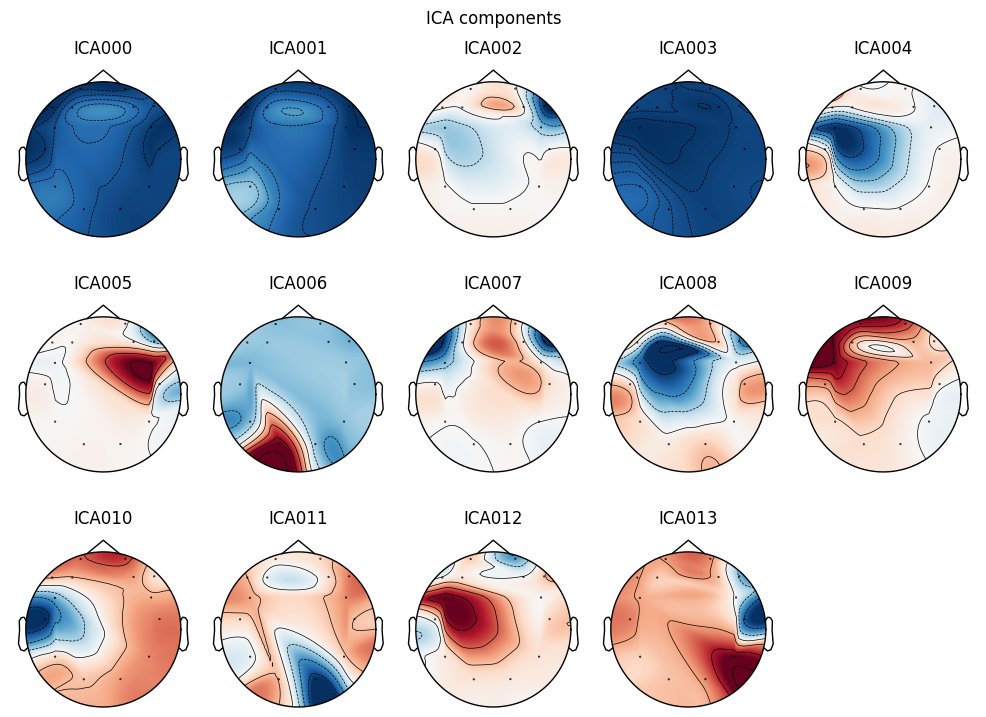

Creating RawArray with float64 data, n_channels=14, n_times=287911
    Range : 0 ... 287910 =      0.000 ...  1124.648 secs
Ready.


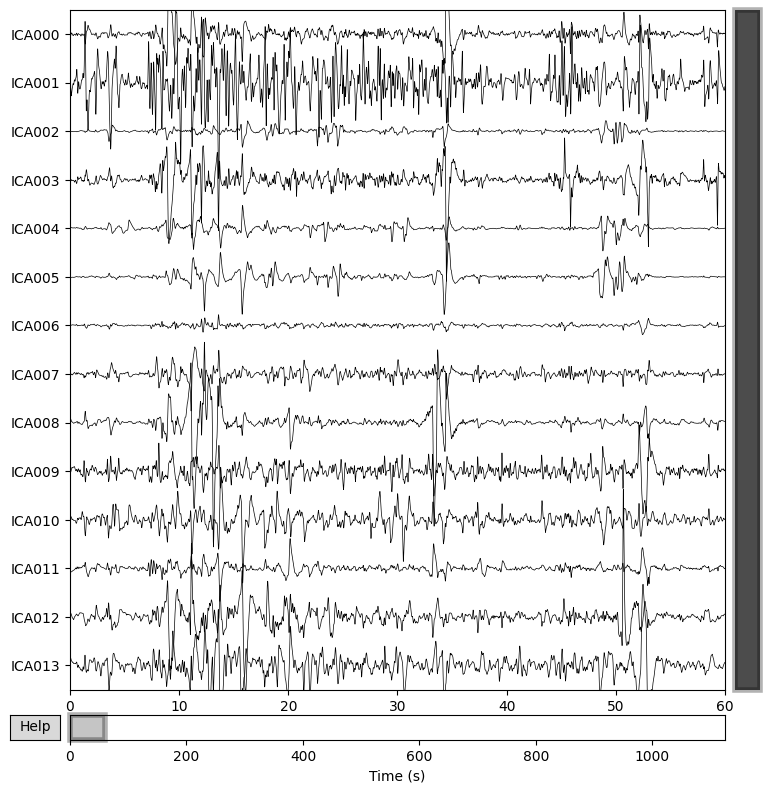

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
562 matching events found
No baseline correction applied
0 projection items activated


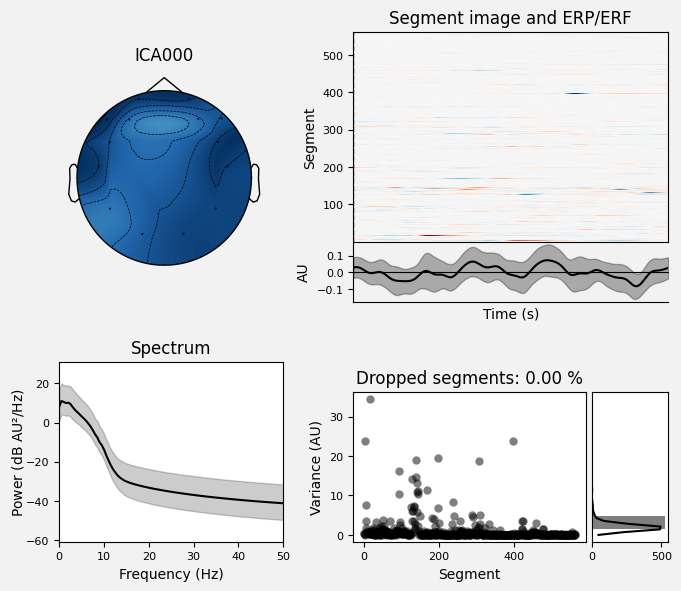

  Kurtosis de cada componente:
    Componente 0: 50.61
    Componente 1: 65.09
    Componente 2: 20.80
    Componente 3: 177.64
    Componente 4: 15.98
    Componente 5: 18.53
    Componente 6: 551.16
    Componente 7: 149.96
    Componente 8: 183.13
    Componente 9: 9.62
    Componente 10: 11.35
    Componente 11: 2073.80
    Componente 12: 54.24
    Componente 13: 38.73
  Componentes identificadas como artefacto (|kurtosis| > 312): [ 6 11]
  Componentes excluidas: [6, 11]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components
  Señal limpia obtenida para el sujeto.


In [ ]:
# Procesamiento por sujeto
for subj in subjects:
    print(f"\nProcesando sujeto: {subj}")
    # Extraer los datos correspondientes a este sujeto
    df_subj = df_eeg_filtered[df_eeg_filtered['subject'] == subj].copy()
    
    # Verificar la longitud y rango de tiempo para este sujeto
    print(f"  Número de muestras: {len(df_subj)}")
    print(f"  Rango de tiempo: {df_subj['datetime'].min()} a {df_subj['datetime'].max()}")
    
    # Extraer la matriz de datos EEG (de los 14 canales) de este sujeto
    # La forma debe ser (n_samples, n_channels)
    X_subj = df_subj[electrode_cols].values
    
    # Transponer para que RawArray reciba una matriz de forma (n_channels, n_samples)
    X_subj_T = X_subj.T
    
    # Definir la frecuencia de muestreo (por ejemplo, 256 Hz, que es la de df_eeg_filtered)
    sfreq = 128
    
    # Crear la información de los canales
    info = mne.create_info(ch_names=electrode_cols, sfreq=sfreq, ch_types=['eeg'] * len(electrode_cols))
    
    # Crear el objeto RawArray a partir de los datos EEG
    raw_subj = mne.io.RawArray(X_subj_T, info)

    
    # Renombrar los canales para que coincidan con el montaje estándar (quitando "EEG.")
    mapping = {ch: ch.replace("EEG.", "") for ch in raw_subj.info['ch_names']}
    raw_subj.rename_channels(mapping)
    
    # Asignar un montage estándar para que se agreguen las posiciones de los electrodos
    montage = mne.channels.make_standard_montage('standard_1020')
    raw_subj.set_montage(montage, on_missing='warn')
    
    # Muestra la localización de los sensores en el montaje asignado (standard_1020)
    raw_subj.plot_sensors(show_names=True)
    
    

    # Aplicar ICA con MNE para este sujeto

    # Aplicar un filtro pasa-alto con límite inferior de 1 Hz
    raw_subj.filter(l_freq=1.0, h_freq=None, fir_design='firwin')

    # Ahora ajustamos el ICA
    ica = ICA(n_components=len(raw_subj.info['ch_names']), random_state=42, max_iter='auto')
    ica.fit(raw_subj)
    print("ICA ajustada correctamente tras aplicar el filtro high-pass.")

    # Visualizar las componentes para inspección manual
    ica.plot_components(show=True)

    # Muestra cómo evoluciona en el tiempo cada componente independiente
    ica.plot_sources(raw_subj, show=True, start=0, stop=60)
    
    # Inspeccionar en detalle las propiedades (topografía, espectro, forma de onda) de la componente 0
    ica.plot_properties(raw_subj, picks=[0], psd_args={'fmax':50})
    
    # Obtener las fuentes (componentes) como un array (forma: n_components x n_samples)
    sources = ica.get_sources(raw_subj).get_data()
    kurt_vals = kurtosis(sources, axis=1, fisher=True)
    print("  Kurtosis de cada componente:")
    for i, k in enumerate(kurt_vals):
        print(f"    Componente {i}: {k:.2f}")
    
    # Definir un umbral para eliminar componentes artefactuosas
    threshold = 312.0
    artifact_indices = np.where(np.abs(kurt_vals) > threshold)[0]
    print("  Componentes identificadas como artefacto (|kurtosis| > 312):", artifact_indices)
    
    # Excluir las componentes identificadas (puedes ajustarlo manualmente si lo deseas)
    ica.exclude = list(artifact_indices)
    print("  Componentes excluidas:", ica.exclude)
    
    # Aplicar ICA para remover los artefactos y obtener la señal limpia
    raw_subj_clean = ica.apply(raw_subj.copy())
    print("  Señal limpia obtenida para el sujeto.")
    
    
    # Convertir la señal limpia a DataFrame y conservar el timestamp original

    # Extraer los datos limpios: shape (n_channels, n_samples)
    eeg_clean = raw_subj_clean.get_data()
    # Transponer para tener (n_samples, n_channels)
    eeg_clean = eeg_clean.T
    
    # Crear un DataFrame con las columnas correspondientes a los electrodos (usamos los nombres ya renombrados)
    # Nota: raw_subj_clean.info['ch_names'] ya son, por ejemplo, "AF3", "F7", etc.
    df_subj_clean = pd.DataFrame(eeg_clean, columns=raw_subj_clean.info['ch_names'])
    
    # Importante: asignar los timestamps originales del sujeto, que están en df_subj['datetime']
    # Se asume que el número de muestras es el mismo
    df_subj_clean['datetime'] = df_subj['datetime'].values  # preservamos los timestamps originales
    df_subj_clean['subject'] = subj  # añadir el identificador del sujeto
    df_subj_clean['theoretical_difficulty'] = df_subj['theoretical_difficulty'].values
    
    list_dfs.append(df_subj_clean)

In [111]:
# Concatenar los DataFrames de todos los sujetos
df_eeg_ica_final = pd.concat(list_dfs, axis=0).reset_index(drop=True)
print("\nForma final del DataFrame con datos limpios:", df_eeg_ica_final.shape)
print("Rango de tiempo final:", df_eeg_ica_final['datetime'].min(), "a", df_eeg_ica_final['datetime'].max())


Forma final del DataFrame con datos limpios: (735769, 17)
Rango de tiempo final: 2020-12-22 10:38:58.234317 a 2020-12-22 13:08:40.872047


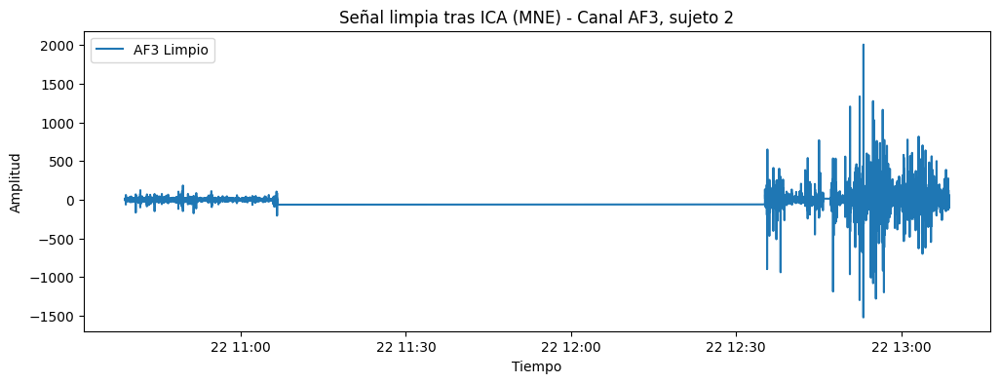

In [112]:
# Visualización de ejemplo: canal AF3 para el primer sujeto
# (Nota: después de renombrar, el canal se llama "AF3" y no "EEG.AF3")
subject_example = df_eeg_ica_final[df_eeg_ica_final['subject'] == subjects[0]]
plt.figure(figsize=(12, 4))
plt.plot(subject_example['datetime'], subject_example['AF3'], label="AF3 Limpio")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.title("Señal limpia tras ICA (MNE) - Canal AF3, sujeto " + str(subjects[0]))
plt.legend()
plt.show()

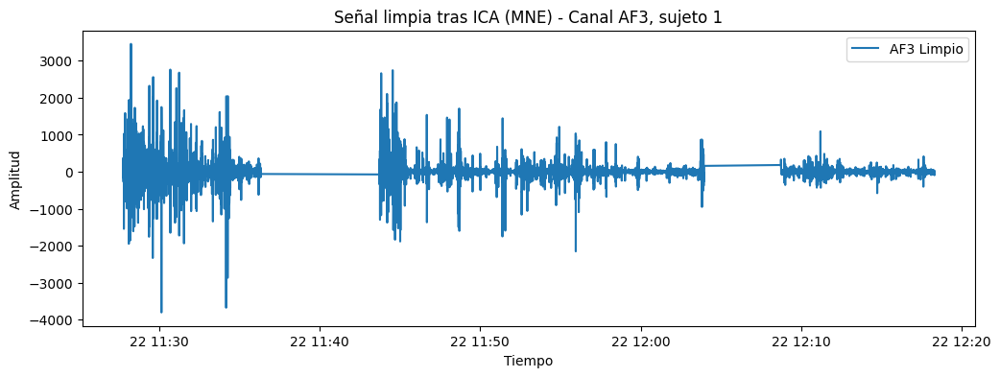

In [113]:
# Visualización de ejemplo: canal AF3 para el segundo sujeto
# (Nota: después de renombrar, el canal se llama "AF3" y no "EEG.AF3")
subject_example = df_eeg_ica_final[df_eeg_ica_final['subject'] == subjects[1]]
plt.figure(figsize=(12, 4))
plt.plot(subject_example['datetime'], subject_example['AF3'], label="AF3 Limpio")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.title("Señal limpia tras ICA (MNE) - Canal AF3, sujeto " + str(subjects[1]))
plt.legend()
plt.show()

In [114]:
df_subj1 = df_eeg_filtered[df_eeg_filtered['subject'] == 1]
print("Rango de tiempo sujeto 1:", df_subj1['datetime'].min(), df_subj1['datetime'].max())
print("Número de muestras:", len(df_subj1))

Rango de tiempo sujeto 1: 2020-12-22 11:27:45.790989 2020-12-22 12:18:18.321510
Número de muestras: 287911


In [115]:
df_subj2 = df_eeg_filtered[df_eeg_filtered['subject'] == 2]
print("Rango de tiempo sujeto 2:", df_subj2['datetime'].min(), df_subj2['datetime'].max())
print("Número de muestras:", len(df_subj2))

Rango de tiempo sujeto 2: 2020-12-22 10:38:58.234317 2020-12-22 13:08:40.872047
Número de muestras: 447858


In [116]:
df_subj2 = eeg[eeg['subject'] == 1]
print("Rango de tiempo sujeto 1:", df_subj2['datetime'].min(), df_subj2['datetime'].max())
print("Número de muestras:", len(df_subj2))

Rango de tiempo sujeto 1: 2020-12-22 11:27:45.790989 2020-12-22 12:18:18.321510
Número de muestras: 287911


In [117]:
df_eeg_ica_final.head()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,datetime,subject,theoretical_difficulty
0,-0.004284,-0.004008,0.000050,-0.004344,-0.004370,-0.004069,-0.004079,-0.003422,-0.004341,-0.001650,-0.003706,-0.003874,-0.003773,-0.004142,2020-12-22 10:38:58.234317,2,1
1,1.370554,0.703068,1.680672,1.801819,0.518793,3.235358,3.889269,2.575139,2.372946,1.481065,2.197258,0.615604,1.700947,2.094958,2020-12-22 10:38:58.242099,2,1
2,2.756373,1.421799,3.365245,3.619260,1.090785,6.501822,7.772349,5.136232,4.769009,2.979587,4.381393,1.246974,3.404557,4.192156,2020-12-22 10:38:58.249981,2,1
3,4.115904,2.130205,5.021547,5.408522,1.697524,9.736538,11.580092,7.633835,7.146230,4.468378,6.510723,1.872900,5.067674,6.245858,2020-12-22 10:38:58.257764,2,1
4,5.415371,2.807621,6.619593,7.132335,2.325009,12.883651,15.251198,10.025190,9.468490,5.923262,8.550155,2.477908,6.653841,8.218195,2020-12-22 10:38:58.265646,2,1


In [118]:
num_samples = len(df_eeg_ica_final)
duration_s   = num_samples / 128
print(f"Número de muestras: {num_samples}")
print(f"Duración total grabada: {duration_s:.1f} segundos ({duration_s/60:.1f} minutos)")

Número de muestras: 735769
Duración total grabada: 5748.2 segundos (95.8 minutos)


In [ ]:
df = df_eeg_ica_final.copy()
df['datetime'] = pd.to_datetime(df['datetime'])
    
    # Agrupar por segundo
df['second'] = df['datetime'].dt.floor('S')
counts = df.groupby('second').size()
    
    # Mostrar resumen de las cuentas
print("Estadísticas de muestras por segundo:")
print(counts.describe(), end='\n\n')
    
    # Identificar segundos con conteo distinto de 256
bad = counts[counts != 128]
if bad.empty:
    print("Todos los segundos contienen exactamente 256 muestras.")
else:
    print("Segundos con número de muestras distinto de 256:")
    print(bad)

📊 Estadísticas de muestras por segundo:
count    5848.000000
mean      125.815492
std         9.398881
min         1.000000
25%       126.000000
50%       127.000000
75%       127.000000
max       135.000000
dtype: float64

⚠️ Segundos con número de muestras distinto de 256:
second
2020-12-22 10:38:58     98
2020-12-22 10:38:59    127
2020-12-22 10:39:00    126
2020-12-22 10:39:01    126
2020-12-22 10:39:02    127
                      ... 
2020-12-22 13:08:35    127
2020-12-22 13:08:37    127
2020-12-22 13:08:38    127
2020-12-22 13:08:39    127
2020-12-22 13:08:40    111
Length: 4813, dtype: int64


### **EXTRACCIÓN DE CARACTERÍSTICAS**

Ahora que tenemos el DataFrame df_eeg_ica con la señal preprocesada final, procedemos a extraer características para la construcción del modelo de IA. Segmentaremos la señal en ventanas de 1 segundo (con la frecuencia de muestreo de 256 Hz, cada ventana tendrá 256 muestras) y extraeremos características tanto en el dominio del tiempo como en el dominio de la frecuencia para cada canal.

Definimos funciones para extraer características en el dominio del tiempo y para calcular la potencia en bandas de frecuencia usando el método de Welch.

In [120]:
def compute_time_features(signal):
    """
    Extrae características en el dominio del tiempo para una señal.
    """
    features = {}
    features['mean'] = np.mean(signal)
    features['std'] = np.std(signal)
    features['var'] = np.var(signal)
    features['skew'] = skew(signal)
    features['kurtosis'] = kurtosis(signal, fisher=True)  # fisher=True: distribución normal -> 0
    features['ptp'] = np.ptp(signal)  # peak-to-peak
    # Número de cruces por cero
    zero_crossings = np.where(np.diff(np.signbit(signal)))[0]
    features['zero_crossings'] = len(zero_crossings)
    return features

def compute_bandpower(signal, fs, band, nperseg=None, nfft=None, method='welch'):
    """
    Calcula la potencia en una banda de frecuencia dada usando Welch
    :param signal: señal unidimensional
    :param fs: frecuencia de muestreo
    :param band: tupla (f_min, f_max)
    :param nperseg: longitud del segmento para Welch
    :return: potencia en la banda
      - method='welch': usa Welch con posible zero‐padding (nfft > nperseg).
    """
    fmin, fmax = band
    freqs, psd = welch(signal, fs=fs, nperseg=nperseg or len(signal), nfft=nfft)
    dfreq = freqs[1] - freqs[0]
    return np.sum(psd[(freqs>=fmin)&(freqs<=fmax)]) * dfreq

Establecemos la duración de la ventana y definimos las bandas de frecuencia a analizar.

In [121]:
# Frecuencia de muestreo final
new_fs = 128  
window_duration = 1.00  # segundos
window_size = int(new_fs * window_duration)  # 1.00*256 = 256 muestras

# Definir las bandas de frecuencia (en Hz)
bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta': (13, 30),
    'gamma': (30, 50)
}

electrode_cols = [
    'AF3','F7','F3','FC5',
    'T7','P7','O1','O2',
    'P8','T8','FC6','F4',
    'F8','AF4'
]

Recorremos el DataFrame df_eeg_ica por ventanas sin solapamiento, y para cada ventana y cada canal extraemos las características.

In [122]:
features_list = []
num_samples = len(df_eeg_ica_final)

# Iteramos en ventanas de tamaño window_size (sin solapamiento)
features_list = []
for start in range(0, num_samples - window_size + 1, window_size):
    window = df_eeg_ica_final.iloc[start:start+window_size]
    wf = {
        'start_time': window['datetime'].iloc[0],
        'subject':    window['subject'].iloc[0],
        # etiqueta de la ventana: moda de theoretical_difficulty
        'theoretical_difficulty': window['theoretical_difficulty'].mode()[0]
    }
    
    for ch in electrode_cols:
        sig = window[ch].values
        
        # 1) Dominio del tiempo
        t_feats = compute_time_features(sig)
        
        # 2) PSD global
        freqs, psd = welch(sig, fs=new_fs, nperseg=window_size, nfft=512)
        dfreq = freqs[1] - freqs[0]
        
        # 3) Potencia absoluta y relativa por banda
        f_feats = {}
        total_bp = 0.0
        for bn, br in bands.items():
            bp = np.sum(psd[(freqs>=br[0])&(freqs<=br[1])]) * dfreq
            f_feats[f'{bn}_power'] = bp
            total_bp += bp
        for bn in bands:
            f_feats[f'{bn}_power_rel'] = f_feats[f'{bn}_power'] / total_bp if total_bp>0 else 0.0
        
        # 4) Theta/alpha ratio
        a_bp = f_feats['alpha_power']
        f_feats['theta_alpha_ratio'] = f_feats['theta_power'] / a_bp if a_bp>0 else 0.0
        
        # 5) Entropía espectral
        psd_norm = psd / (psd.sum() + 1e-12)
        f_feats['spectral_entropy'] = -np.sum(psd_norm * np.log(psd_norm + 1e-12))
        
        # vuelca todo al dict de la ventana
        for k, v in {**t_feats, **f_feats}.items():
            wf[f'{ch}_{k}'] = v
    
    # 6) Asimetría frontal en alpha (AF4 vs AF3)
    aR = wf['AF4_alpha_power']
    aL = wf['AF3_alpha_power']
    wf['frontal_alpha_asym'] = np.log(aR + 1e-10) - np.log(aL + 1e-10)
    
    features_list.append(wf)

# Convertir a DataFrame
features_df = pd.DataFrame(features_list)
print("Número de ventanas extraídas:", len(features_df))
print("Vista previa de las características extraídas:")
features_df.head()

Número de ventanas extraídas: 5748
Vista previa de las características extraídas:


,start_time,subject,theoretical_difficulty,AF3_mean,AF3_std,AF3_var,AF3_skew,AF3_kurtosis,AF3_ptp,AF3_zero_crossings,...,AF4_beta_power,AF4_gamma_power,AF4_delta_power_rel,AF4_theta_power_rel,AF4_alpha_power_rel,AF4_beta_power_rel,AF4_gamma_power_rel,AF4_theta_alpha_ratio,AF4_spectral_entropy,frontal_alpha_asym
0,2020-12-22 10:38:58.234317,2,1,9.185956,4.936416,24.368208,0.489765,-0.709345,19.113274,1,...,1.201159e-05,1.206789e-07,0.995173,0.004808,1.790548e-05,1.063151e-06,1.068134e-08,268.513670,2.634057,0.670798
1,2020-12-22 10:38:59.240643,2,1,-1.411658,4.178314,17.458310,-0.625003,-0.576020,14.458753,5,...,1.318052e-07,6.433797e-10,0.989101,0.010898,9.519210e-07,8.960073e-09,4.373675e-11,11448.862161,2.508693,-0.479868
2,2020-12-22 10:39:00.252792,2,1,0.679351,4.365827,19.060448,-0.203865,-0.678221,15.941603,5,...,5.697787e-07,4.436423e-09,0.997018,0.002978,3.245099e-06,2.073342e-08,1.614350e-10,917.844511,2.452233,0.697703
3,2020-12-22 10:39:01.268643,2,1,-1.629880,4.709347,22.177945,0.336729,-0.938611,16.103417,3,...,9.216917e-07,8.265715e-09,0.968532,0.031464,3.763754e-06,4.501887e-08,4.037285e-10,8359.746359,2.597899,0.324304
4,2020-12-22 10:39:02.281693,2,1,2.251481,3.543632,12.557327,0.261140,-1.226234,11.208006,5,...,1.768648e-07,1.697767e-09,0.989681,0.010317,2.286073e-06,7.539291e-09,7.237141e-11,4512.953483,2.457049,0.330484


In [123]:
features_df.head()

,start_time,subject,theoretical_difficulty,AF3_mean,AF3_std,AF3_var,AF3_skew,AF3_kurtosis,AF3_ptp,AF3_zero_crossings,...,AF4_beta_power,AF4_gamma_power,AF4_delta_power_rel,AF4_theta_power_rel,AF4_alpha_power_rel,AF4_beta_power_rel,AF4_gamma_power_rel,AF4_theta_alpha_ratio,AF4_spectral_entropy,frontal_alpha_asym
0,2020-12-22 10:38:58.234317,2,1,9.185956,4.936416,24.368208,0.489765,-0.709345,19.113274,1,...,1.201159e-05,1.206789e-07,0.995173,0.004808,1.790548e-05,1.063151e-06,1.068134e-08,268.513670,2.634057,0.670798
1,2020-12-22 10:38:59.240643,2,1,-1.411658,4.178314,17.458310,-0.625003,-0.576020,14.458753,5,...,1.318052e-07,6.433797e-10,0.989101,0.010898,9.519210e-07,8.960073e-09,4.373675e-11,11448.862161,2.508693,-0.479868
2,2020-12-22 10:39:00.252792,2,1,0.679351,4.365827,19.060448,-0.203865,-0.678221,15.941603,5,...,5.697787e-07,4.436423e-09,0.997018,0.002978,3.245099e-06,2.073342e-08,1.614350e-10,917.844511,2.452233,0.697703
3,2020-12-22 10:39:01.268643,2,1,-1.629880,4.709347,22.177945,0.336729,-0.938611,16.103417,3,...,9.216917e-07,8.265715e-09,0.968532,0.031464,3.763754e-06,4.501887e-08,4.037285e-10,8359.746359,2.597899,0.324304
4,2020-12-22 10:39:02.281693,2,1,2.251481,3.543632,12.557327,0.261140,-1.226234,11.208006,5,...,1.768648e-07,1.697767e-09,0.989681,0.010317,2.286073e-06,7.539291e-09,7.237141e-11,4512.953483,2.457049,0.330484


In [124]:
features_df.value_counts("theoretical_difficulty")

theoretical_difficulty
-1    1954
 1    1633
 2    1186
 3     540
 4     435
Name: count, dtype: int64

In [125]:
features_df.shape

(5748, 270)

In [126]:
features_df["theoretical_difficulty"] = features_df["theoretical_difficulty"].replace(-1, 0)

In [127]:
features_df.value_counts("theoretical_difficulty")

theoretical_difficulty
0    1954
1    1633
2    1186
3     540
4     435
Name: count, dtype: int64

In [128]:
# Definimos el mapeo deseado:
group_map = {
     0: 0,
     1: 1,
     2: 2,
     3: 2,
     4: 2
}

# Creamos una nueva columna agrupada:
features_df['theoretical_difficulty_grouped'] = features_df[
    'theoretical_difficulty'
].map(group_map).astype(int)

# (Opcional) Comprobamos la distribución de los nuevos grupos:
print(features_df['theoretical_difficulty_grouped'].value_counts())

theoretical_difficulty_grouped
2    2161
0    1954
1    1633
Name: count, dtype: int64


In [129]:
features_df.drop(columns=['theoretical_difficulty'], inplace=True)
features_df.rename(columns={'theoretical_difficulty_grouped': 'theoretical_difficulty'}, inplace=True)
features_df.head()

,start_time,subject,AF3_mean,AF3_std,AF3_var,AF3_skew,AF3_kurtosis,AF3_ptp,AF3_zero_crossings,AF3_delta_power,...,AF4_gamma_power,AF4_delta_power_rel,AF4_theta_power_rel,AF4_alpha_power_rel,AF4_beta_power_rel,AF4_gamma_power_rel,AF4_theta_alpha_ratio,AF4_spectral_entropy,frontal_alpha_asym,theoretical_difficulty
0,2020-12-22 10:38:58.234317,2,9.185956,4.936416,24.368208,0.489765,-0.709345,19.113274,1,20.082846,...,1.206789e-07,0.995173,0.004808,1.790548e-05,1.063151e-06,1.068134e-08,268.513670,2.634057,0.670798,1
1,2020-12-22 10:38:59.240643,2,-1.411658,4.178314,17.458310,-0.625003,-0.576020,14.458753,5,24.523594,...,6.433797e-10,0.989101,0.010898,9.519210e-07,8.960073e-09,4.373675e-11,11448.862161,2.508693,-0.479868,1
2,2020-12-22 10:39:00.252792,2,0.679351,4.365827,19.060448,-0.203865,-0.678221,15.941603,5,21.443243,...,4.436423e-09,0.997018,0.002978,3.245099e-06,2.073342e-08,1.614350e-10,917.844511,2.452233,0.697703,1
3,2020-12-22 10:39:01.268643,2,-1.629880,4.709347,22.177945,0.336729,-0.938611,16.103417,3,30.031265,...,8.265715e-09,0.968532,0.031464,3.763754e-06,4.501887e-08,4.037285e-10,8359.746359,2.597899,0.324304,1
4,2020-12-22 10:39:02.281693,2,2.251481,3.543632,12.557327,0.261140,-1.226234,11.208006,5,13.921721,...,1.697767e-09,0.989681,0.010317,2.286073e-06,7.539291e-09,7.237141e-11,4512.953483,2.457049,0.330484,1


Cada fila representa una ventana de 1 segundo +-, y cada columna contiene una característica específica para un canal en esa ventana. 

In [130]:
# Guardar
features_df.to_csv('features.csv', index=False, encoding='utf-8')
print("Guardado en features.csv") 

Guardado en features.csv


### **CARGA COGNITIVA**

Los pilotos pueden interpretar y reportar la dificultad de forma subjetiva, y a veces su percepción no se alinea con los cambios fisiológicos en la actividad cerebral. Crear una variable objetiva (por ejemplo, binaria: alta carga = 1, baja carga = 0) a partir de los datos EEG puede ayudar a entrenar un modelo que detecte estados de alta carga cognitiva basándose en la actividad cerebral real.

Con la extracción de características que ya hemos realizado (estadísticas en el dominio del tiempo y potencia en bandas de frecuencia), podemos identificar patrones en la señal que se asocien con estados de alta actividad. Por ejemplo, cambios en la potencia de bandas como theta, alpha o beta pueden correlacionarse con un incremento en la carga cognitiva.

Una forma de crear esta nueva etiqueta es usar técnicas de clustering (por ejemplo, K-Means) sobre las características extraídas. La idea es que, si la señal presenta naturalmente dos grupos (uno de baja actividad y otro de alta actividad), el algoritmo de clustering los identificará. Posteriormente, podrías asignar de forma manual o semiautomática cuál grupo representa “alta carga” y cuál “baja carga”.

En muchos estudios sobre carga cognitiva y EEG, se observa que:
- Región Frontal (F3, F4, AF3, AF4): Suele relacionarse con procesos de atención, memoria de trabajo y toma de decisiones.
- Región Frontocentral (FC5, FC6, F7, F8): También registra cambios significativos ante incrementos de carga cognitiva o estrés mental.
- Región Parietal (P7, P8): A veces se analiza para correlacionar con el procesamiento visoespacial o la carga perceptual.
- Región Occipital (O1, O2): Principalmente asociada a la actividad visual y la modulación de ritmos alpha.

Y por otro lado : 
- Theta: Un aumento en la potencia theta se ha relacionado con estados de alta carga cognitiva y fatiga.
- Beta: Las variaciones en la potencia beta también pueden indicar cambios en la actividad cerebral asociados a procesos cognitivos intensos.
- Alpha: Variaciones en la potencia alpha pueden indicar cambios en el estado de atención y la concentración.
- Delta : Variaciones en la potencia delta pueden indicar estados de sueño profundo o fatiga.
- Gamma: Variaciones en la potencia gamma pueden indicar procesos de atención y procesamiento de información.

In [135]:
# Creamos una lista con los nombres de las columnas de potencia que queremos analizar
power_cols = []
for ch in electrode_cols:
    for band in bands:
        col_name = f"{ch}_{band}_power"
        # Asegurarse de que la columna existe en df festures
        if col_name in features_df.columns:
            power_cols.append(col_name)

print("Columnas de potencia seleccionadas:")
print(power_cols)

Columnas de potencia seleccionadas:
['AF3_delta_power', 'AF3_theta_power', 'AF3_alpha_power', 'AF3_beta_power', 'AF3_gamma_power', 'F7_delta_power', 'F7_theta_power', 'F7_alpha_power', 'F7_beta_power', 'F7_gamma_power', 'F3_delta_power', 'F3_theta_power', 'F3_alpha_power', 'F3_beta_power', 'F3_gamma_power', 'FC5_delta_power', 'FC5_theta_power', 'FC5_alpha_power', 'FC5_beta_power', 'FC5_gamma_power', 'T7_delta_power', 'T7_theta_power', 'T7_alpha_power', 'T7_beta_power', 'T7_gamma_power', 'P7_delta_power', 'P7_theta_power', 'P7_alpha_power', 'P7_beta_power', 'P7_gamma_power', 'O1_delta_power', 'O1_theta_power', 'O1_alpha_power', 'O1_beta_power', 'O1_gamma_power', 'O2_delta_power', 'O2_theta_power', 'O2_alpha_power', 'O2_beta_power', 'O2_gamma_power', 'P8_delta_power', 'P8_theta_power', 'P8_alpha_power', 'P8_beta_power', 'P8_gamma_power', 'T8_delta_power', 'T8_theta_power', 'T8_alpha_power', 'T8_beta_power', 'T8_gamma_power', 'FC6_delta_power', 'FC6_theta_power', 'FC6_alpha_power', 'FC6_b

In [136]:
# Extraer las características de potencia
selected_features_df = features_df[power_cols].copy()

# Si existe la variable perceived_difficulty, la añadimos para usarla como referencia
if 'perceived_difficulty' in features_df.columns:
    selected_features_df['perceived_difficulty'] = features_df['perceived_difficulty']

print("Vista previa de selected_features_df:")
print(selected_features_df.head())

Vista previa de selected_features_df:
   AF3_delta_power  AF3_theta_power  AF3_alpha_power  AF3_beta_power  \
0        20.082846         0.114876         0.000103    4.194998e-06   
1        24.523594         0.289848         0.000023    3.661323e-07   
2        21.443243         0.059509         0.000044    6.305651e-07   
3        30.031265         0.310944         0.000056    3.751952e-07   
4        13.921721         0.223317         0.000039    4.903819e-07   

   AF3_gamma_power  F7_delta_power  F7_theta_power  F7_alpha_power  \
0     3.796124e-08        9.483570        0.157020        0.000062   
1     2.396542e-09        5.920898        0.033153        0.000013   
2     4.375341e-09       45.224776        0.123873        0.000029   
3     2.987706e-09        6.730222        0.676237        0.000115   
4     4.892217e-09       10.906421        0.199402        0.000021   

   F7_beta_power  F7_gamma_power  ...  F8_delta_power  F8_theta_power  \
0   6.781011e-07    5.088264e-09  .

##### Prueba Mediana

Número de características de potencia: 140


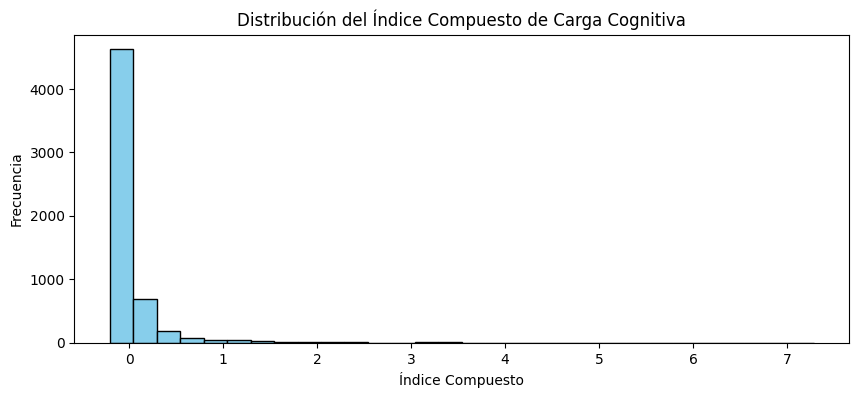

Umbral (mediana) del índice compuesto: -0.11397364380641364
Distribución de la nueva variable de carga cognitiva:
new_cognitive_load
1    2874
0    2874
Name: count, dtype: int64


In [137]:
# Seleccionamos todas las columnas que contienen "power"
power_cols = [col for col in features_df.columns if 'power' in col]
print("Número de características de potencia:", len(power_cols))

# Extraemos la matriz de datos (filas: ventanas, columnas: características)
X = features_df[power_cols].values

# Estandarizamos los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Creamos un índice compuesto para cada ventana (por ejemplo, el promedio de todas las características estandarizadas)
composite_index = X_scaled.mean(axis=1)

# Visualizamos la distribución del índice compuesto
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 4))
plt.hist(composite_index, bins=30, color='skyblue', edgecolor='k')
plt.title("Distribución del Índice Compuesto de Carga Cognitiva")
plt.xlabel("Índice Compuesto")
plt.ylabel("Frecuencia")
plt.show()

# Definimos el umbral usando la mediana (podrías experimentar con otros percentiles)
threshold = np.median(composite_index)
print("Umbral (mediana) del índice compuesto:", threshold)

# Creamos la variable binaria: 1 si el índice es mayor que el umbral, 0 en caso contrario
features_df['new_cognitive_load'] = (composite_index > threshold).astype(int)
print("Distribución de la nueva variable de carga cognitiva:")
print(features_df['new_cognitive_load'].value_counts())

Buena discriminación

##### Primera definición

Número de características de frecuencia: 140
Número de características temporales: 129
Número total de características combinadas: 269


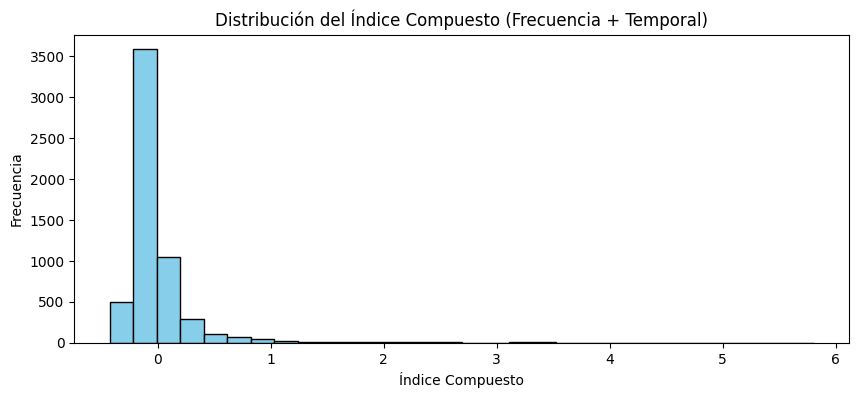

Umbral (mediana) del índice compuesto: -0.07911236929600457
Distribución de la nueva variable de carga cognitiva:
new_cognitive_load
0    2874
1    2874
Name: count, dtype: int64


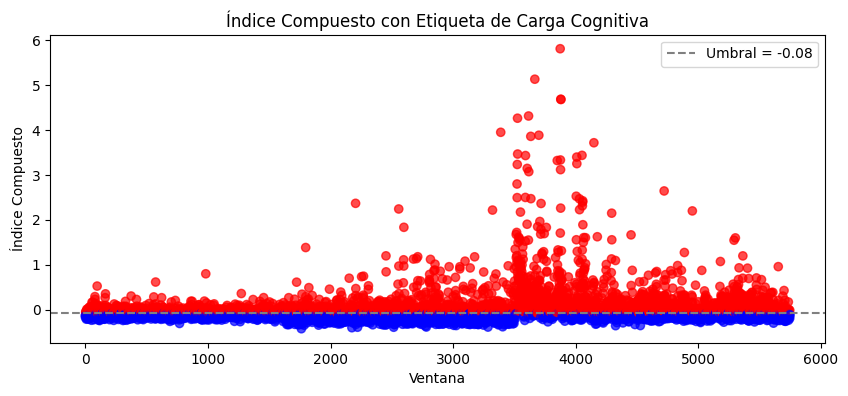

In [138]:
# Seleccionar las columnas de características en el dominio de la frecuencia:
frequency_cols = [col for col in features_df.columns if 'power' in col]
print("Número de características de frecuencia:", len(frequency_cols))

# Seleccionar las columnas de características en el dominio temporal, todas las columnas numéricas que no sean 'start_time', 'subject' o que no contengan 'power'
temporal_cols = [col for col in features_df.columns 
                 if (col not in ['start_time', 'subject']) 
                 and ('power' not in col) 
                 and (np.issubdtype(features_df[col].dtype, np.number))]
print("Número de características temporales:", len(temporal_cols))

# Combinar ambas listas de columnas en un único conjunto de características.
combined_cols = temporal_cols + frequency_cols
print("Número total de características combinadas:", len(combined_cols))

# Extraer la matriz de características combinadas (filas: ventanas, columnas: features)
X_combined = features_df[combined_cols].values

# Estandarizar la matriz de características para que todas tengan la misma escala.
scaler = StandardScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Calcular un índice compuesto. Promedio de todas las características estandarizadas para cada ventana.
composite_index = X_combined_scaled.mean(axis=1)

# Visualizamos la distribución del índice compuesto
plt.figure(figsize=(10, 4))
plt.hist(composite_index, bins=30, color='skyblue', edgecolor='k')
plt.title("Distribución del Índice Compuesto (Frecuencia + Temporal)")
plt.xlabel("Índice Compuesto")
plt.ylabel("Frecuencia")
plt.show()

# Definir el umbral (mediana) para separar alta y baja carga.
threshold = np.median(composite_index)
print("Umbral (mediana) del índice compuesto:", threshold)

# Crear la variable binaria: 1 para alta carga (índice compuesto > umbral) y 0 para baja carga.
features_df['new_cognitive_load'] = (composite_index > threshold).astype(int)
# Añadir composite_index al DataFrame de características
features_df['composite_index'] = composite_index


# Mostrar la distribución de la nueva variable
print("Distribución de la nueva variable de carga cognitiva:")
print(features_df['new_cognitive_load'].value_counts())

# Visualizar el índice compuesto coloreado según la nueva etiqueta
plt.figure(figsize=(10, 4))
plt.scatter(range(len(composite_index)), composite_index, 
            c=features_df['new_cognitive_load'], cmap='bwr', alpha=0.7)
plt.axhline(threshold, color='gray', linestyle='--', label=f"Umbral = {threshold:.2f}")
plt.title("Índice Compuesto con Etiqueta de Carga Cognitiva")
plt.xlabel("Ventana")
plt.ylabel("Índice Compuesto")
plt.legend()
plt.show()

Estadísticos para 'AF3_theta_power':
                          mean          std       min           max    median
new_cognitive_load                                                           
0                     7.096626    20.019985  0.011322    411.925191  1.515470
1                   394.312927  2603.743542  0.013053  60087.297032  5.545781

Estadísticos para 'composite_index':
                        mean       std       min       max    median
new_cognitive_load                                                  
0                  -0.159098  0.059683 -0.424047 -0.079149 -0.146736
1                   0.159098  0.465286 -0.079076  5.811113  0.012550


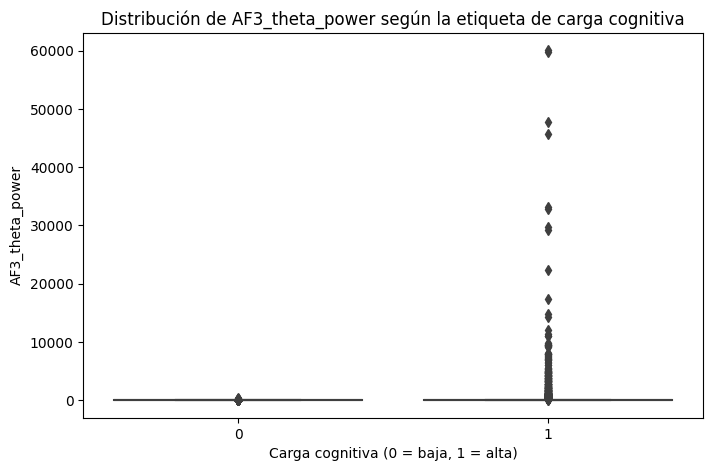

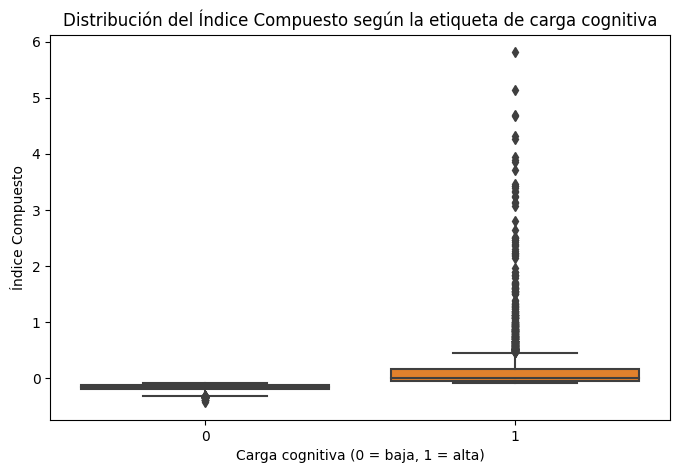

t-test para 'AF3_theta_power': t-stat = -7.97, p-value = 0.000


In [139]:
from scipy.stats import ttest_ind
# Estadísticos descriptivos: calcular la media y desviación de una característica relevante por grupo
grouped = features_df.groupby('new_cognitive_load')

print("Estadísticos para 'AF3_theta_power':")
print(grouped['AF3_theta_power'].agg(['mean', 'std', 'min', 'max', 'median']))

print("\nEstadísticos para 'composite_index':")
print(grouped['composite_index'].agg(['mean', 'std', 'min', 'max', 'median']))

# Visualización: Boxplot de 'AF3_theta_power' para cada grupo
plt.figure(figsize=(8, 5))
sns.boxplot(x='new_cognitive_load', y='AF3_theta_power', data=features_df)
plt.title("Distribución de AF3_theta_power según la etiqueta de carga cognitiva")
plt.xlabel("Carga cognitiva (0 = baja, 1 = alta)")
plt.ylabel("AF3_theta_power")
plt.show()

# Boxplot para el índice compuesto (si lo has calculado)
if 'composite_index' in features_df.columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='new_cognitive_load', y='composite_index', data=features_df)
    plt.title("Distribución del Índice Compuesto según la etiqueta de carga cognitiva")
    plt.xlabel("Carga cognitiva (0 = baja, 1 = alta)")
    plt.ylabel("Índice Compuesto")
    plt.show()

# Prueba estadística: t-test para ver si la diferencia en 'AF3_theta_power' entre grupos es significativa
group0 = features_df[features_df['new_cognitive_load'] == 0]['AF3_theta_power']
group1 = features_df[features_df['new_cognitive_load'] == 1]['AF3_theta_power']

t_stat, p_value = ttest_ind(group0, group1, equal_var=False)
print(f"t-test para 'AF3_theta_power': t-stat = {t_stat:.2f}, p-value = {p_value:.3f}")

# Puedes hacer lo mismo para otras características o para el índice compuesto

Estadísticos para 'F4_theta_power':
                          mean          std       min           max    median
new_cognitive_load                                                           
0                     5.328992    15.091811  0.008977    346.051241  1.364529
1                   323.052200  2181.525251  0.006894  51454.492205  4.168231

Estadísticos para 'composite_index':
                        mean       std       min       max    median
new_cognitive_load                                                  
0                  -0.159098  0.059683 -0.424047 -0.079149 -0.146736
1                   0.159098  0.465286 -0.079076  5.811113  0.012550


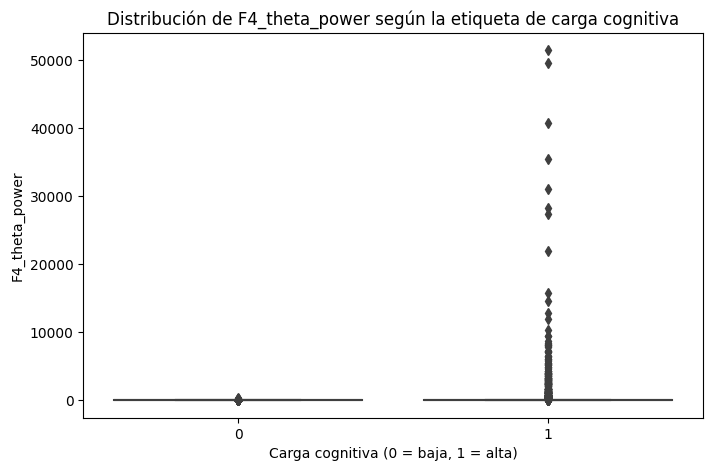

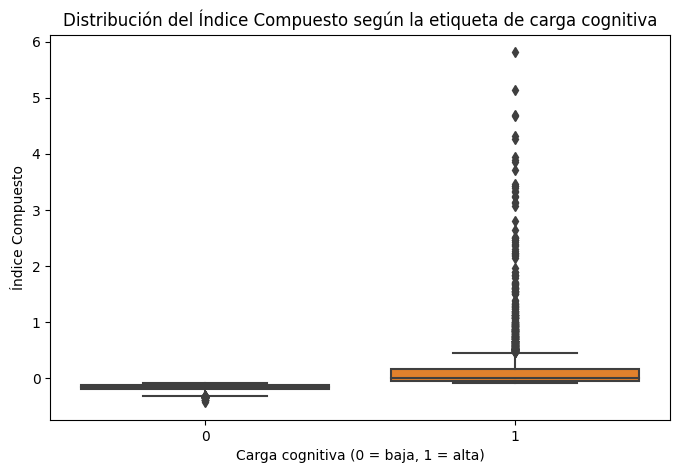

t-test para 'F4_theta_power': t-stat = -7.81, p-value = 0.000


In [140]:
print("Estadísticos para 'F4_theta_power':")
print(grouped['F4_theta_power'].agg(['mean', 'std', 'min', 'max', 'median']))

print("\nEstadísticos para 'composite_index':")
print(grouped['composite_index'].agg(['mean', 'std', 'min', 'max', 'median']))

plt.figure(figsize=(8, 5))
sns.boxplot(x='new_cognitive_load', y='F4_theta_power', data=features_df)
plt.title("Distribución de F4_theta_power según la etiqueta de carga cognitiva")
plt.xlabel("Carga cognitiva (0 = baja, 1 = alta)")
plt.ylabel("F4_theta_power")
plt.show()

if 'composite_index' in features_df.columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='new_cognitive_load', y='composite_index', data=features_df)
    plt.title("Distribución del Índice Compuesto según la etiqueta de carga cognitiva")
    plt.xlabel("Carga cognitiva (0 = baja, 1 = alta)")
    plt.ylabel("Índice Compuesto")
    plt.show()

# Prueba estadística: t-test para ver si la diferencia en 'AF3_theta_power' entre grupos es significativa
group0 = features_df[features_df['new_cognitive_load'] == 0]['F4_theta_power']
group1 = features_df[features_df['new_cognitive_load'] == 1]['F4_theta_power']

t_stat, p_value = ttest_ind(group0, group1, equal_var=False)
print(f"t-test para 'F4_theta_power': t-stat = {t_stat:.2f}, p-value = {p_value:.3f}")

Estadísticos para 'O1_theta_power':
                          mean          std       min           max   median
new_cognitive_load                                                          
0                     4.938256    14.801985  0.011401    298.294608  1.08819
1                   302.234949  2031.741246  0.023112  47590.859593  3.56453

Estadísticos para 'composite_index':
                        mean       std       min       max    median
new_cognitive_load                                                  
0                  -0.159098  0.059683 -0.424047 -0.079149 -0.146736
1                   0.159098  0.465286 -0.079076  5.811113  0.012550


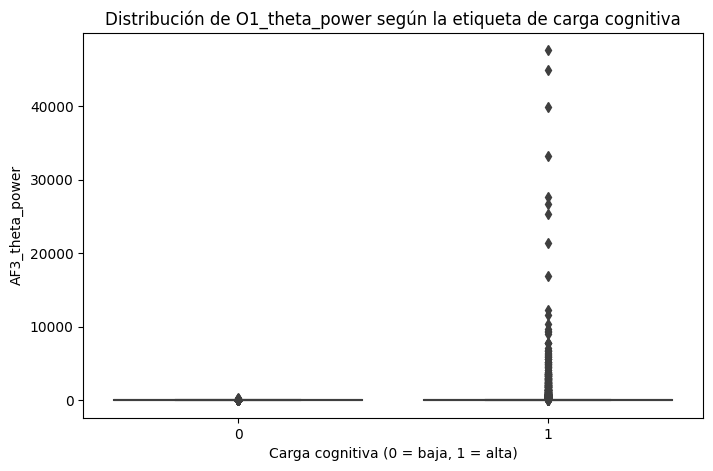

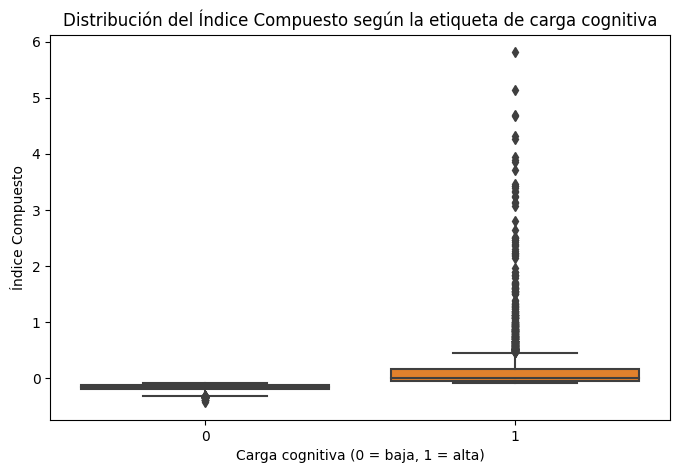

t-test para 'AF3_theta_power': t-stat = -7.84, p-value = 0.000


In [141]:
# Supongamos que 'features_df' tiene la columna 'new_cognitive_load'
# y algunas características clave, por ejemplo "AF3_theta_power" y "composite_index" que usaste.
from scipy.stats import ttest_ind
# 1. Estadísticos descriptivos: calcular la media y desviación de una característica relevante por grupo
grouped = features_df.groupby('new_cognitive_load')

print("Estadísticos para 'O1_theta_power':")
print(grouped['O1_theta_power'].agg(['mean', 'std', 'min', 'max', 'median']))

print("\nEstadísticos para 'composite_index':")
print(grouped['composite_index'].agg(['mean', 'std', 'min', 'max', 'median']))

# 2. Visualización: Boxplot de 'AF3_theta_power' para cada grupo
plt.figure(figsize=(8, 5))
sns.boxplot(x='new_cognitive_load', y='O1_theta_power', data=features_df)
plt.title("Distribución de O1_theta_power según la etiqueta de carga cognitiva")
plt.xlabel("Carga cognitiva (0 = baja, 1 = alta)")
plt.ylabel("AF3_theta_power")
plt.show()

# Boxplot para el índice compuesto (si lo has calculado)
if 'composite_index' in features_df.columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='new_cognitive_load', y='composite_index', data=features_df)
    plt.title("Distribución del Índice Compuesto según la etiqueta de carga cognitiva")
    plt.xlabel("Carga cognitiva (0 = baja, 1 = alta)")
    plt.ylabel("Índice Compuesto")
    plt.show()

# 3. Prueba estadística: t-test para ver si la diferencia en 'AF3_theta_power' entre grupos es significativa
group0 = features_df[features_df['new_cognitive_load'] == 0]['O1_theta_power']
group1 = features_df[features_df['new_cognitive_load'] == 1]['O1_theta_power']

t_stat, p_value = ttest_ind(group0, group1, equal_var=False)
print(f"t-test para 'AF3_theta_power': t-stat = {t_stat:.2f}, p-value = {p_value:.3f}")

# Puedes hacer lo mismo para otras características o para el índice compuesto

##### Definición final - mediana fija, por sujeto y móvil

1. Justificación del Umbral Fijo Basado en la Mediana
	•	Robustez ante valores atípicos:
La mediana es una medida estadística robusta, menos sensible a valores extremos que la media. Al usar la mediana del índice compuesto, logras obtener un umbral que divide de manera equitativa la distribución en dos grupos (alta y baja carga cognitiva).
	•	Simplicidad e Interpretación:
Establecer un corte basado en la mediana ofrece una implementación directa y facilita la interpretación de los resultados, ya que el 50% de las ventanas se clasifican en cada grupo.
	•	Análisis Exploratorio Inicial:
Los gráficos y análisis estadísticos (boxplots, t-test, etc.) que realizas sobre variables como la potencia theta en AF3 y el propio índice compuesto confirman que, a nivel global, existe una diferenciación en la carga cognitiva.

2. Problemas Potenciales con la Mediana Fija
	•	Variabilidad Interindividual:
Cada sujeto puede presentar características propias en sus señales EEG. Factores como la morfología cerebral, el estado basal, y diferencias en la activación pueden producir distribuciones del índice compuesto con medianas significativamente distintas. En este sentido, un umbral global podría no reflejar adecuadamente el estado de cada individuo.
	•	Evolución Temporal de la Señal:
Durante una tarea o sesión, el rendimiento y los niveles de atención del sujeto pueden variar. Una mediana fija calculada en un primer análisis puede perder capacidad de adaptarse a cambios graduales o bruscos en la actividad cerebral.

3. Ventajas de Implementar una Mediana Móvil o Personalizada
	•	Umbral Dinámico por Sujeto:
Calculando la mediana para cada sujeto de forma individual (por ejemplo, segmentando el DataFrame por la columna subject y computando la mediana del índice compuesto para cada uno) aseguras que el umbral se adapta a la línea base particular de cada individuo. Esto permite que la clasificación de carga cognitiva se ajuste a la variabilidad interindividual.
	•	Mediana Móvil (Rolling Median):
La implementación de una mediana móvil implica recalcular el umbral a lo largo del tiempo utilizando una ventana deslizante. Esto permite ajustar el umbral en función de las tendencias actuales en la señal:
	•	Captura de cambios graduales: Una ventana móvil puede detectar variaciones progresivas en la actividad, ajustando el umbral a la evolución de la carga cognitiva.
	•	Reducción de sensibilidad a transitorios: Si se diseña adecuadamente el tamaño de la ventana, se puede evitar que ruidos momentáneos o artefactos afecten la clasificación de la carga.

4. Consideraciones y Recomendaciones
	•	Análisis Previo por Sujeto:
Es recomendable hacer un análisis estadístico descriptivo (por ejemplo, calculando la mediana, media y desviación estándar del índice compuesto) para cada sujeto. Si se observa una variación significativa entre ellos, es un indicador fuerte de que se debe optar por un umbral personalizado.
	•	Definición del Tamaño de la Ventana:
Para la mediana móvil, definir correctamente el tamaño de la ventana es crucial:
	•	Ventana demasiado corta: Puede capturar ruido o transitorios que no representan cambios reales en la carga cognitiva.
	•	Ventana demasiado larga: Podría suavizar cambios relevantes y no adaptarse con la agilidad necesaria.
	•	Validación y Comparación:
Se sugiere evaluar y comparar ambos enfoques (umbral global versus umbral dinámico) mediante métricas de desempeño en la clasificación y análisis de sensibilidad. Esto te permitirá confirmar si el umbral dinámico mejora la discriminación de la carga cognitiva sin introducir artefactos o sobreajustes.
	•	Implicación para la IA:
Dado que la idea es aplicar esta IA a sujetos distintos, la adaptabilidad del umbral es fundamental. Un modelo que se base en umbrales dinámicos o sujetos-específicos será más robusto frente a variaciones interindividuales y cambios en el estado de la señal, incrementando así la generalización y precisión del sistema.

Conclusión

La mediana puede variar significativamente entre sujetos. Utilizar una mediana fija podría no ser el enfoque óptimo cuando se planea aplicar la IA en diferentes individuos o en contextos donde la señal varíe a lo largo del tiempo.

Adoptar un enfoque basado en umbrales dinámicos (ya sea a nivel sujeto o mediante una mediana móvil) mejorará la adaptabilidad y precisión de la detección de la carga cognitiva. Este tipo de adaptación es esencial para un sistema robusto y escalable en aplicaciones reales.

Número de características de frecuencia: 140
Número de características temporales: 130
Número total de características combinadas: 270


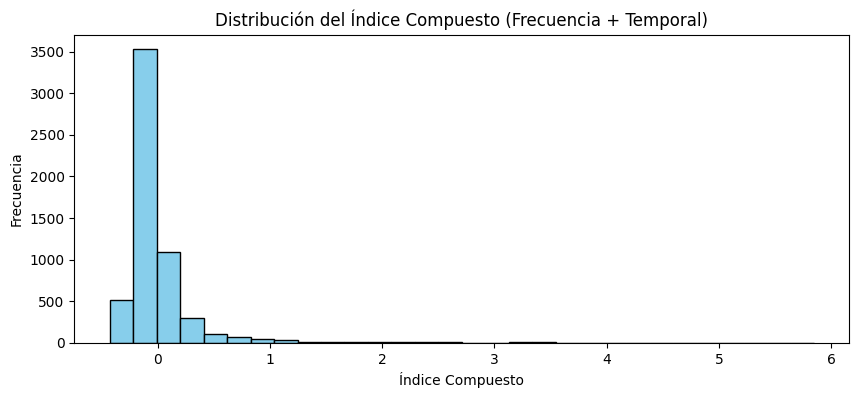

In [142]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from scipy.stats import ttest_ind

# Seleccionar columnas en el dominio de la frecuencia (aquellas que contienen 'power')
frequency_cols = [col for col in features_df.columns if 'power' in col]
print("Número de características de frecuencia:", len(frequency_cols))

# Seleccionar columnas en el dominio temporal: todas las columnas numéricas que no sean 'start_time', 'subject' y que no tengan 'power'
temporal_cols = [col for col in features_df.columns 
                 if (col not in ['start_time', 'subject']) 
                 and ('power' not in col) 
                 and (np.issubdtype(features_df[col].dtype, np.number))]
print("Número de características temporales:", len(temporal_cols))

# Combinar ambas listas de columnas para obtener el conjunto completo de características
combined_cols = temporal_cols + frequency_cols
print("Número total de características combinadas:", len(combined_cols))

# Extraer la matriz de características y estandarizarla
X_combined = features_df[combined_cols].values
scaler = StandardScaler()
X_combined_scaled = scaler.fit_transform(X_combined)

# Calcular el índice compuesto promediando las características estandarizadas
features_df['composite_index'] = X_combined_scaled.mean(axis=1)

# Visualizar la distribución del índice compuesto
plt.figure(figsize=(10, 4))
plt.hist(features_df['composite_index'], bins=30, color='skyblue', edgecolor='k')
plt.title("Distribución del Índice Compuesto (Frecuencia + Temporal)")
plt.xlabel("Índice Compuesto")
plt.ylabel("Frecuencia")
plt.show()

###### Mediana fija

Umbral global (mediana) del índice compuesto: -0.07960906045378632


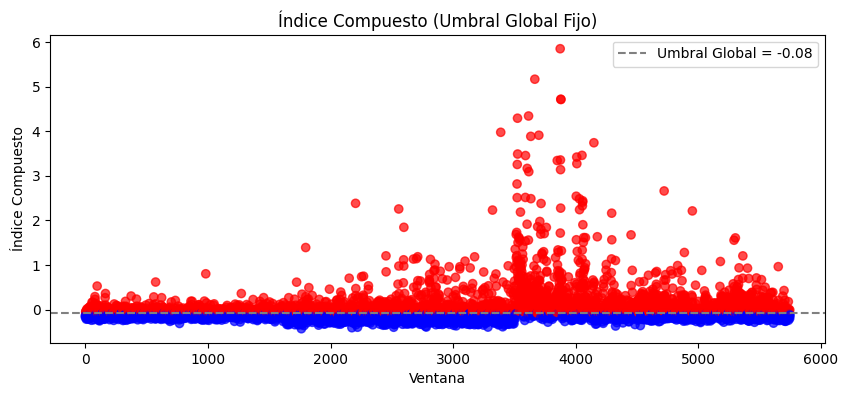

In [143]:
# Enfoque 1: Umbral Global Fijo basado en la Mediana Global

# Comentario:
# Usar la mediana global es robusto ante valores extremos y resulta en una división equitativa de la muestra.
threshold_global = np.median(features_df['composite_index'])
print("Umbral global (mediana) del índice compuesto:", threshold_global)

# Crear variable binaria con el umbral global
features_df['new_cognitive_load_global'] = (features_df['composite_index'] > threshold_global).astype(int)

# Visualizar resultados con el umbral global
plt.figure(figsize=(10, 4))
plt.scatter(range(len(features_df)), features_df['composite_index'], 
            c=features_df['new_cognitive_load_global'], cmap='bwr', alpha=0.7)
plt.axhline(threshold_global, color='gray', linestyle='--', label=f"Umbral Global = {threshold_global:.2f}")
plt.title("Índice Compuesto (Umbral Global Fijo)")
plt.xlabel("Ventana")
plt.ylabel("Índice Compuesto")
plt.legend()
plt.show()

###### Mdiana por sujeto

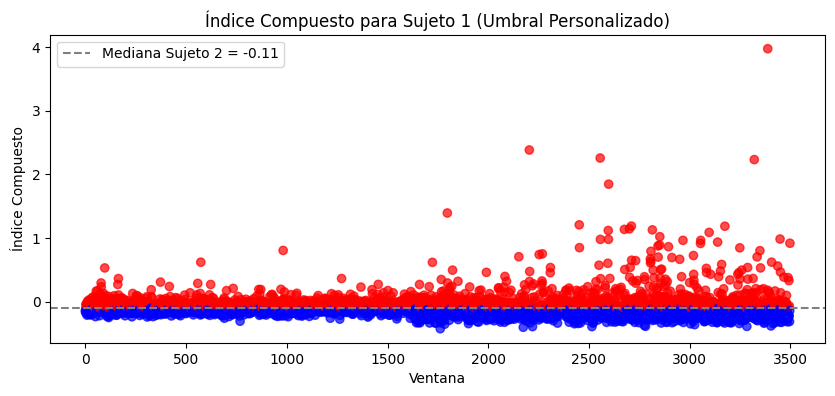

In [144]:
# Enfoque 2: Umbral Personalizado por Sujeto

# Cada sujeto puede tener una línea base diferente en su actividad EEG. Adaptar el umbral a cada sujeto mediante la mediana de su índice compuesto
# permite una clasificación más personalizada y evita problemas derivados de la variabilidad interindividual.

# Calcular la mediana del índice compuesto para cada sujeto y asignarla a cada registro
features_df['subject_median'] = features_df.groupby('subject')['composite_index'].transform('median')

# Crear variable binaria basada en el umbral individual de cada sujeto
features_df['new_cognitive_load_subject'] = (features_df['composite_index'] > features_df['subject_median']).astype(int)

# Visualización de la distribución del índice compuesto para un sujeto de ejemplo
subject_example = features_df['subject'].unique()[0]
df_subject = features_df[features_df['subject'] == subject_example]

plt.figure(figsize=(10, 4))
plt.scatter(range(len(df_subject)), df_subject['composite_index'], 
            c=df_subject['new_cognitive_load_subject'], cmap='bwr', alpha=0.7)
plt.axhline(df_subject['subject_median'].iloc[0], color='gray', linestyle='--', 
            label=f"Mediana Sujeto {subject_example} = {df_subject['subject_median'].iloc[0]:.2f}")
plt.title(f"Índice Compuesto para Sujeto 1 (Umbral Personalizado)")
plt.xlabel("Ventana")
plt.ylabel("Índice Compuesto")
plt.legend()
plt.show()


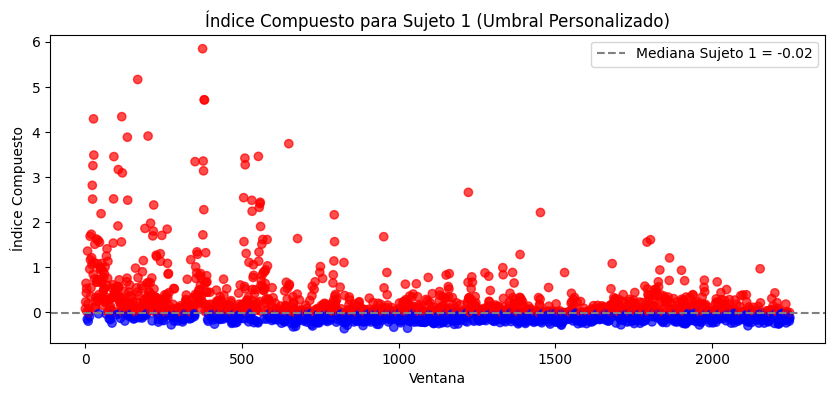

In [145]:
# Ahora para el sujeto 2
subject_example = features_df['subject'].unique()[1]
df_subject = features_df[features_df['subject'] == subject_example]

plt.figure(figsize=(10, 4))
plt.scatter(range(len(df_subject)), df_subject['composite_index'], 
            c=df_subject['new_cognitive_load_subject'], cmap='bwr', alpha=0.7)
plt.axhline(df_subject['subject_median'].iloc[1], color='gray', linestyle='--', 
            label=f"Mediana Sujeto {subject_example} = {df_subject['subject_median'].iloc[1]:.2f}")
plt.title(f"Índice Compuesto para Sujeto {subject_example} (Umbral Personalizado)")
plt.xlabel("Ventana")
plt.ylabel("Índice Compuesto")
plt.legend()
plt.show()


###### Mediana Móvil

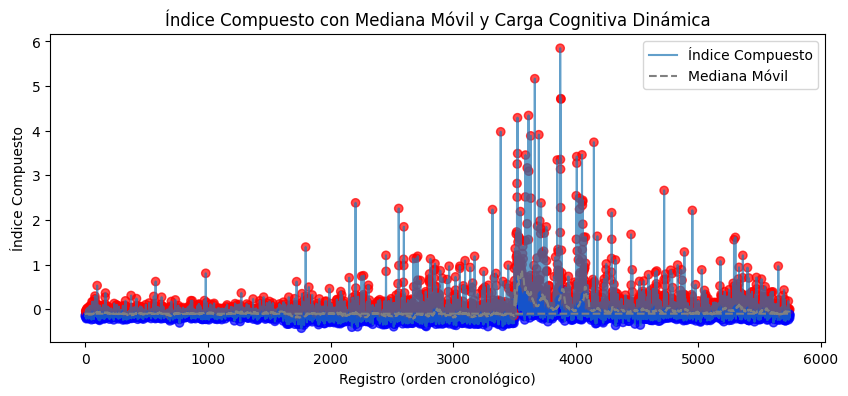

In [146]:
# Enfoque 3: Umbral Dinámico con Mediana Móvil (Rolling Median)

# La mediana móvil permite adaptar el umbral en función de la evolución temporal de la señal.
# Este método es útil para captar cambios graduales o repentinos en la actividad durante una sesión.

# Es fundamental ordenar los datos cronológicamente (usando 'start_time') si no se ha hecho ya
features_df.sort_values(by=['subject', 'start_time'], inplace=True)

# Definir el tamaño de la ventana para la mediana móvil.
# Debe elegirse cuidadosamente: una ventana demasiado pequeña puede ser demasiado sensible al ruido,
# mientras que una ventana muy amplia puede suavizar cambios reales.
window_size = 50

# Calcular la mediana móvil para el índice compuesto.
# Se calcula de forma global, pero también se puede hacer por sujeto si se dispone de suficientes datos.
features_df['rolling_median'] = features_df['composite_index'].rolling(window=window_size, min_periods=1).median()

# Crear la variable binaria basándose en la mediana móvil
features_df['new_cognitive_load_rolling'] = (features_df['composite_index'] > features_df['rolling_median']).astype(int)

# Visualización de la mediana móvil y la clasificación dinámica
plt.figure(figsize=(10, 4))
plt.plot(features_df['composite_index'], label='Índice Compuesto', alpha=0.7)
plt.plot(features_df['rolling_median'], label='Mediana Móvil', linestyle='--', color='gray')
plt.scatter(features_df.index, features_df['composite_index'],
            c=features_df['new_cognitive_load_rolling'], cmap='bwr', alpha=0.7)
plt.title("Índice Compuesto con Mediana Móvil y Carga Cognitiva Dinámica")
plt.xlabel("Registro (orden cronológico)")
plt.ylabel("Índice Compuesto")
plt.legend()
plt.show()

In [147]:
features_df['new_cognitive_load_rolling'].value_counts()

new_cognitive_load_rolling
0    2919
1    2829
Name: count, dtype: int64

In [148]:
# Análisis Estadístico de una Característica Clave

# Por ejemplo, evaluar AF3_theta_power según la etiqueta de carga cognitiva definida con la mediana movil
grouped_global = features_df.groupby('new_cognitive_load_rolling')
print("Estadísticos para 'AF3_theta_power' (Umbral Global):")
print(grouped_global['AF3_theta_power'].agg(['mean', 'std', 'min', 'max', 'median']))

# Realizar un t-test entre grupos para 'AF3_theta_power'
group0_global = features_df[features_df['new_cognitive_load_rolling'] == 0]['AF3_theta_power']
group1_global = features_df[features_df['new_cognitive_load_rolling'] == 1]['AF3_theta_power']
t_stat, p_value = ttest_ind(group0_global, group1_global, equal_var=False)
print(f"\nt-test para 'AF3_theta_power' (Umbral Global): t-stat = {t_stat:.2f}, p-value = {p_value:.3f}")


Estadísticos para 'AF3_theta_power' (Umbral Global):
                                  mean          std       min           max  \
new_cognitive_load_rolling                                                    
0                            32.026311   186.204228  0.011322   4212.434069   
1                           374.749471  2620.783615  0.013053  60087.297032   

                              median  
new_cognitive_load_rolling            
0                           2.026532  
1                           3.156094  

t-test para 'AF3_theta_power' (Umbral Global): t-stat = -6.94, p-value = 0.000


- Preprocesamiento y Cálculo del Índice Compuesto: Se combinan las variables de dominio temporal y frecuencia, se estandarizan y se calcula un índice compuesto.
- Umbral Global: Se utiliza la mediana global del índice compuesto para clasificar la carga cognitiva en alta o baja.
- Umbral Personalizado por Sujeto: Se calcula la mediana del índice compuesto para cada sujeto (mediante groupby y transform), permitiendo una clasificación que respeta las diferencias individuales.
- Mediana Móvil: Se utiliza una ventana móvil sobre el índice compuesto para generar un umbral dinámico, adaptándose a la evolución temporal de la señal.
- Análisis Estadístico: Se evalúa la variable clave AF3_theta_power para comprobar diferencias en la distribución según la clasificación de carga cognitiva.

###### Validación visual

AGRUPADO EL THEORETICAL

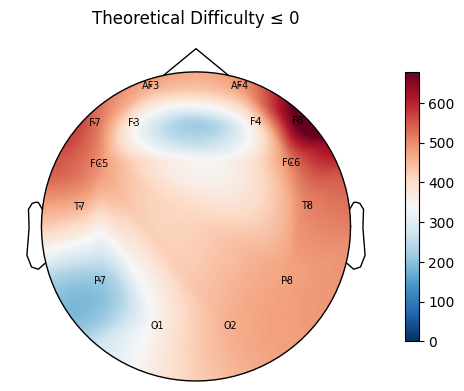

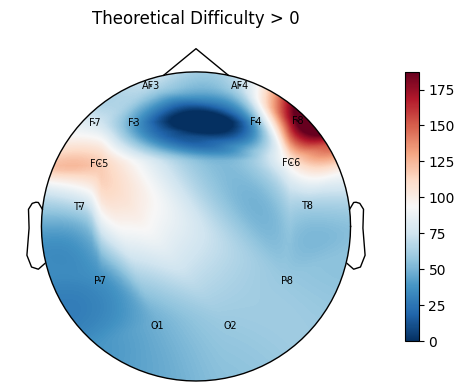

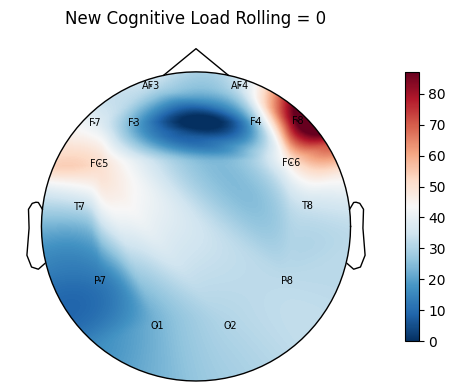

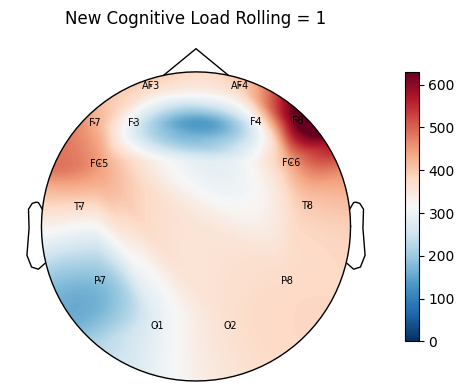

In [149]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt

electrodes = [
    "AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
    "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"
]

def create_mne_info(electrode_list, sfreq=256):
    """
    Crea un objeto info de MNE con canales de EEG y
    asigna un montaje estándar 10-20.
    """
    ch_types = ['eeg'] * len(electrode_list)
    info = mne.create_info(ch_names=electrode_list, sfreq=sfreq, ch_types=ch_types)
    montage = mne.channels.make_standard_montage('standard_1020')
    info.set_montage(montage)
    return info

def compute_average_measure_by_electrode(df, electrode_list, measure_suffix='_theta_power'):
    """
    Dado un DataFrame filtrado a cierta condición (por ejemplo, high vs low load),
    promedia la columna <electrodo + measure_suffix> para cada canal.
    
    Retorna dos cosas:
      - El listado final de canales que se encontraron en el DataFrame.
      - Un vector con la media de esa medida para cada canal.
    """
    measure_cols = []
    avg_values = []
    
    for electrode in electrode_list:
        col_name = electrode + measure_suffix
        if col_name in df.columns:
            measure_cols.append(electrode)
            avg_values.append(df[col_name].mean())
        # Si no se encuentra la columna, se ignora ese electrodo.
    
    return measure_cols, avg_values

def plot_topomap(avg_values, electrodes_found, info, title=''):
    """
    Genera un topomap en MNE a partir de los valores promedio de cada electrodo.
    
    Parameters:
      - avg_values: lista con los valores promediados para cada canal encontrado.
      - electrodes_found: lista de nombres de canales que corresponden a los promedios.
      - info: objeto de MNE con la información de canales y posiciones (montaje).
      - title: título para el gráfico.
    """
    # Construir un diccionario que asocia cada electrodo con su valor promedio.
    electrode_to_value = dict(zip(electrodes_found, avg_values))
    
    # Crear un vector de datos en el orden de info.ch_names (algunos canales pueden no tener datos y se asigna NaN).
    data_array = []
    for ch_name in info.ch_names:
        if ch_name in electrode_to_value:
            data_array.append(electrode_to_value[ch_name])
        else:
            data_array.append(np.nan)
    data_array = np.array(data_array, dtype=float)
    
    # Graficar el topomap sin los argumentos vmin/vmax que causaban error.
    fig, ax = plt.subplots(figsize=(6, 5))
    im, cn = mne.viz.plot_topomap(
        data_array, info, axes=ax, show=False,
        names=info.ch_names, cmap='RdBu_r', contours=0
    )
    ax.set_title(title, fontsize=12)
    fig.colorbar(im, ax=ax, shrink=0.7)
    plt.show()


# Función principal para crear los topomaps

def create_topomaps(merged_features, measure_suffix='_theta_power'):
    """
    Crea topomaps para comparar:
      A) La distribución según 'theoretical_difficulty'.
      B) La distribución según 'new_cognitive_load_rolling'.
      
    Se promedia la medida EEG (por defecto, la potencia theta) para cada electrodo.
    """
    # Crear el objeto info con el montaje de los electrodos definidos.
    info = create_mne_info(electrodes)
    
    # ---------------------------------------------------------------------------------
    # Comparación basada en 'theoretical_difficulty'
    # Suponemos que un valor <= 0 indica baja dificultad y > 0 alta dificultad.
    df_low = merged_features[merged_features['theoretical_difficulty'] <= 0]
    df_high = merged_features[merged_features['theoretical_difficulty'] > 0]
    
    # Calcular promedios por electrodo para cada condición.
    elec_low, avg_low = compute_average_measure_by_electrode(df_low, electrodes, measure_suffix)
    elec_high, avg_high = compute_average_measure_by_electrode(df_high, electrodes, measure_suffix)
    
    # Graficar los topomaps
    plot_topomap(avg_low, elec_low, info, title='Theoretical Difficulty ≤ 0')
    plot_topomap(avg_high, elec_high, info, title='Theoretical Difficulty > 0')
    
    # ---------------------------------------------------------------------------------
    # Comparación basada en 'new_cognitive_load_rolling' (0 vs. 1)
    df_load0 = merged_features[merged_features['new_cognitive_load_rolling'] == 0]
    df_load1 = merged_features[merged_features['new_cognitive_load_rolling'] == 1]
    
    elec_0, avg_0 = compute_average_measure_by_electrode(df_load0, electrodes, measure_suffix)
    elec_1, avg_1 = compute_average_measure_by_electrode(df_load1, electrodes, measure_suffix)
    
    plot_topomap(avg_0, elec_0, info, title='New Cognitive Load Rolling = 0')
    plot_topomap(avg_1, elec_1, info, title='New Cognitive Load Rolling = 1')


create_topomaps(features_df, measure_suffix='_theta_power')

AQUÍ SOLO YA SE VE QUE EL THEORETICAL NO TIENE SENTIDO PQ DEBERIA SER EL GRAFICO DE >0 EL DE <=0 (YA QUE SUPUESTAX A MAYOR DIFICULTAD, MAYOR CARGA COGNITIVA... Y EL DE >0 ES MÁS AZUL, POR LO TANTO DICE QUE HAY MENOS CARGA...)

LO BUENO - CADA CODGIGO ES UNA BANDA DIFERENTE

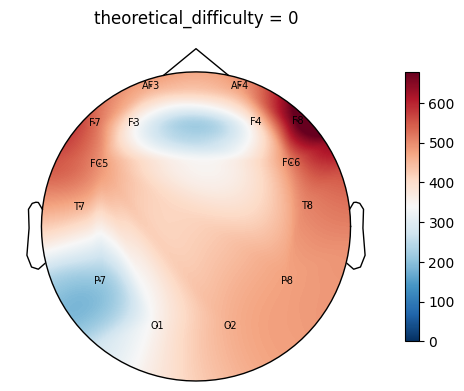

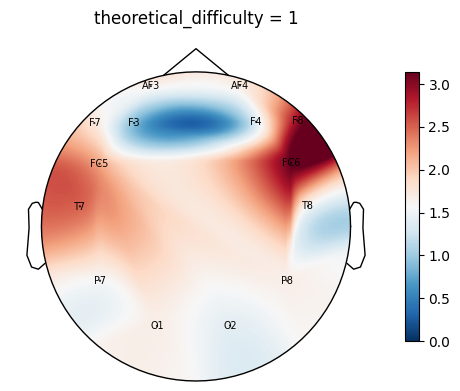

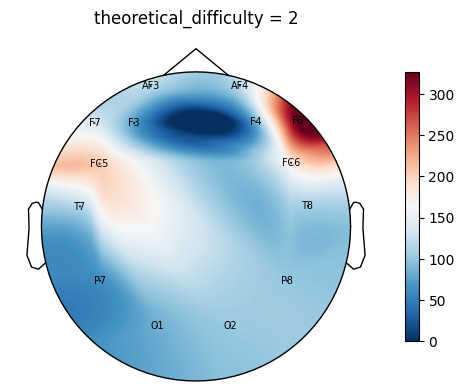

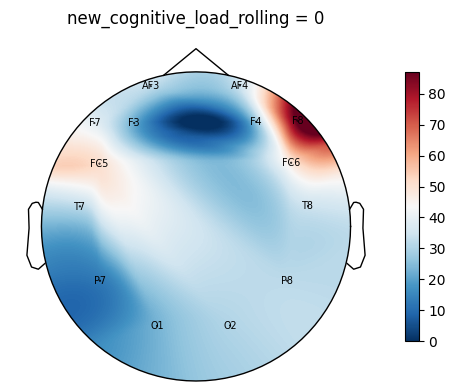

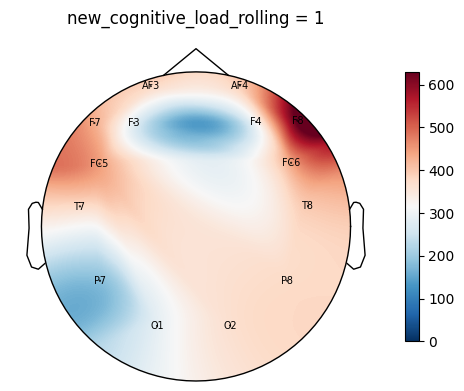

In [150]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt

electrodes = [
    "AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
    "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"
]

def create_mne_info(electrode_list, sfreq=256):
    """
    Crea un objeto info de MNE con canales EEG y monta un esquema estándar 10-20.
    """
    ch_types = ['eeg'] * len(electrode_list)
    info = mne.create_info(ch_names=electrode_list, sfreq=sfreq, ch_types=ch_types)
    montage = mne.channels.make_standard_montage('standard_1020')
    info.set_montage(montage)
    return info

def compute_average_measure_by_electrode(df, electrode_list, measure_suffix='_theta_power'):
    """
    Dado un DataFrame (filtrado según una condición),
    promedia para cada electrodo la columna <electrodo + measure_suffix>.
    
    Retorna:
      - La lista de electrodos encontrados.
      - Un vector con la media de la medida EEG para cada electrodo.
    """
    electrode_found = []
    avg_values = []
    
    for electrode in electrode_list:
        col_name = electrode + measure_suffix
        if col_name in df.columns:
            electrode_found.append(electrode)
            avg_values.append(df[col_name].mean())
    return electrode_found, avg_values

def plot_topomap(avg_values, electrodes_found, info, title=''):
    """
    Genera un topomap a partir de los valores promedio de cada electrodo.
    Se reordena el vector según el orden de info.ch_names; 
    para canales sin datos se asigna NaN.
    """
    # Construir un diccionario: electrodo -> valor promedio
    electrode_to_value = dict(zip(electrodes_found, avg_values))
    
    # Crear un arreglo en el orden de info.ch_names
    data_array = []
    for ch_name in info.ch_names:
        if ch_name in electrode_to_value:
            data_array.append(electrode_to_value[ch_name])
        else:
            data_array.append(np.nan)
    data_array = np.array(data_array, dtype=float)
    
    # Graficar el topomap sin usar vmin/vmax (para compatibilidad)
    fig, ax = plt.subplots(figsize=(6, 5))
    im, _ = mne.viz.plot_topomap(
        data_array, info, axes=ax, show=False,
        names=info.ch_names, cmap='RdBu_r', contours=0
    )
    ax.set_title(title, fontsize=12)
    fig.colorbar(im, ax=ax, shrink=0.7)
    plt.show()

def create_topomaps_theoretical(merged_features, measure_suffix='_theta_power'):
    """
    Recorre todos los valores únicos de 'theoretical_difficulty'
    y genera un topomap para cada nivel.
    """
    # Crear objeto info con el montaje definido
    info = create_mne_info(electrodes)
    
    # Obtener los distintos niveles teóricos (ordenados)
    unique_levels = np.sort(merged_features['theoretical_difficulty'].unique())
    
    for level in unique_levels:
        df_level = merged_features[merged_features['theoretical_difficulty'] == level]
        electrodes_found, avg_values = compute_average_measure_by_electrode(df_level, electrodes, measure_suffix)
        title = f"theoretical_difficulty = {level}"
        plot_topomap(avg_values, electrodes_found, info, title=title)

def create_topomaps_newload(merged_features, measure_suffix='_theta_power'):
    """
    Crea topomaps para la variable 'new_cognitive_load_rolling', separando
    los casos en que el valor es 0 y 1.
    """
    # Crear objeto info
    info = create_mne_info(electrodes)
    
    df_load0 = merged_features[merged_features['new_cognitive_load_rolling'] == 0]
    df_load1 = merged_features[merged_features['new_cognitive_load_rolling'] == 1]
    
    elec_0, avg_0 = compute_average_measure_by_electrode(df_load0, electrodes, measure_suffix)
    elec_1, avg_1 = compute_average_measure_by_electrode(df_load1, electrodes, measure_suffix)
    
    plot_topomap(avg_0, elec_0, info, title='new_cognitive_load_rolling = 0')
    plot_topomap(avg_1, elec_1, info, title='new_cognitive_load_rolling = 1')


create_topomaps_theoretical(features_df, measure_suffix='_theta_power')
create_topomaps_newload(features_df, measure_suffix='_theta_power')

Ahora para delta

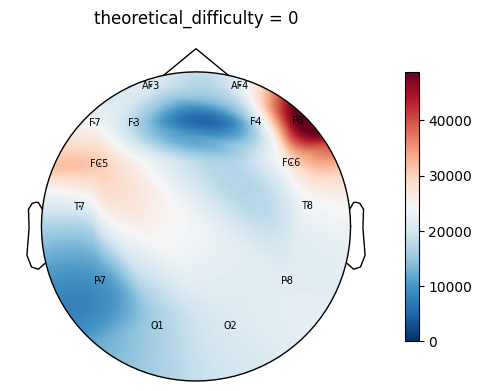

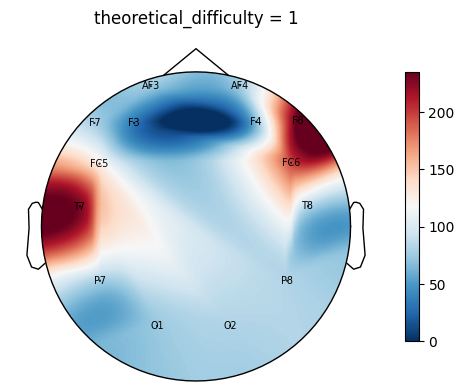

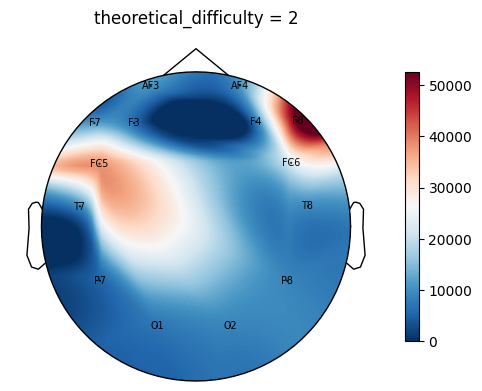

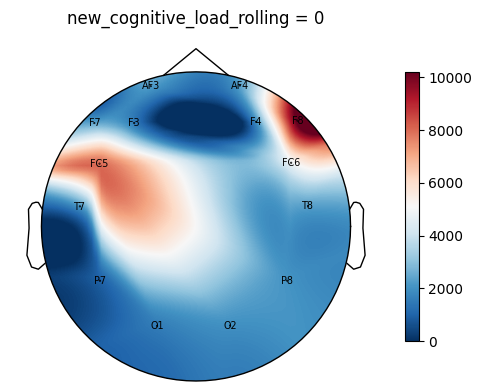

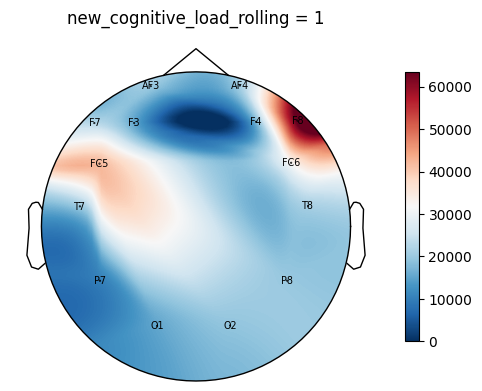

In [151]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt

electrodes = [
    "AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
    "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"
]

def create_mne_info(electrode_list, sfreq=256):
    """
    Crea un objeto info de MNE con canales EEG y monta un esquema estándar 10-20.
    """
    ch_types = ['eeg'] * len(electrode_list)
    info = mne.create_info(ch_names=electrode_list, sfreq=sfreq, ch_types=ch_types)
    montage = mne.channels.make_standard_montage('standard_1020')
    info.set_montage(montage)
    return info

def compute_average_measure_by_electrode(df, electrode_list, measure_suffix='_theta_power'):
    """
    Dado un DataFrame (filtrado según una condición),
    promedia para cada electrodo la columna <electrodo + measure_suffix>.
    
    Retorna:
      - La lista de electrodos encontrados.
      - Un vector con la media de la medida EEG para cada electrodo.
    """
    electrode_found = []
    avg_values = []
    
    for electrode in electrode_list:
        col_name = electrode + measure_suffix
        if col_name in df.columns:
            electrode_found.append(electrode)
            avg_values.append(df[col_name].mean())
    return electrode_found, avg_values

def plot_topomap(avg_values, electrodes_found, info, title=''):
    """
    Genera un topomap a partir de los valores promedio de cada electrodo.
    Se reordena el vector según el orden de info.ch_names; 
    para canales sin datos se asigna NaN.
    """
    # Construir un diccionario: electrodo -> valor promedio
    electrode_to_value = dict(zip(electrodes_found, avg_values))
    
    # Crear un arreglo en el orden de info.ch_names
    data_array = []
    for ch_name in info.ch_names:
        if ch_name in electrode_to_value:
            data_array.append(electrode_to_value[ch_name])
        else:
            data_array.append(np.nan)
    data_array = np.array(data_array, dtype=float)
    
    # Graficar el topomap sin usar vmin/vmax (para compatibilidad)
    fig, ax = plt.subplots(figsize=(6, 5))
    im, _ = mne.viz.plot_topomap(
        data_array, info, axes=ax, show=False,
        names=info.ch_names, cmap='RdBu_r', contours=0
    )
    ax.set_title(title, fontsize=12)
    fig.colorbar(im, ax=ax, shrink=0.7)
    plt.show()

def create_topomaps_theoretical(merged_features, measure_suffix='_theta_power'):
    """
    Recorre todos los valores únicos de 'theoretical_difficulty'
    y genera un topomap para cada nivel.
    """
    # Crear objeto info con el montaje definido
    info = create_mne_info(electrodes)
    
    # Obtener los distintos niveles teóricos (ordenados)
    unique_levels = np.sort(merged_features['theoretical_difficulty'].unique())
    
    for level in unique_levels:
        df_level = merged_features[merged_features['theoretical_difficulty'] == level]
        electrodes_found, avg_values = compute_average_measure_by_electrode(df_level, electrodes, measure_suffix)
        title = f"theoretical_difficulty = {level}"
        plot_topomap(avg_values, electrodes_found, info, title=title)

def create_topomaps_newload(merged_features, measure_suffix='_theta_power'):
    """
    Crea topomaps para la variable 'new_cognitive_load_rolling', separando
    los casos en que el valor es 0 y 1.
    """
    # Crear objeto info
    info = create_mne_info(electrodes)
    
    df_load0 = merged_features[merged_features['new_cognitive_load_rolling'] == 0]
    df_load1 = merged_features[merged_features['new_cognitive_load_rolling'] == 1]
    
    elec_0, avg_0 = compute_average_measure_by_electrode(df_load0, electrodes, measure_suffix)
    elec_1, avg_1 = compute_average_measure_by_electrode(df_load1, electrodes, measure_suffix)
    
    plot_topomap(avg_0, elec_0, info, title='new_cognitive_load_rolling = 0')
    plot_topomap(avg_1, elec_1, info, title='new_cognitive_load_rolling = 1')


create_topomaps_theoretical(features_df, measure_suffix='_delta_power')
create_topomaps_newload(features_df, measure_suffix='_delta_power')

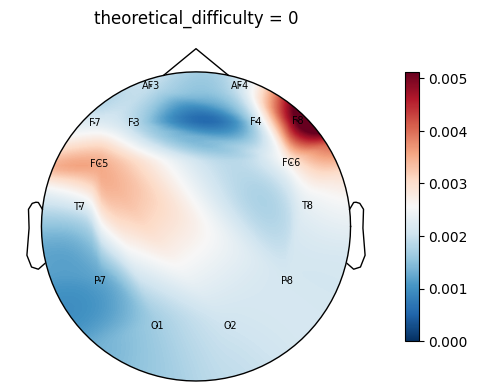

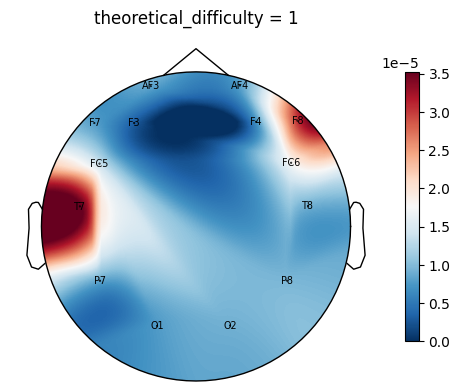

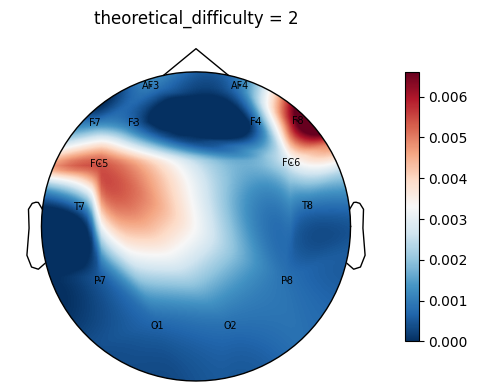

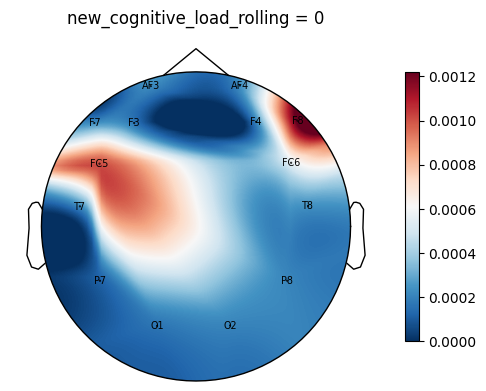

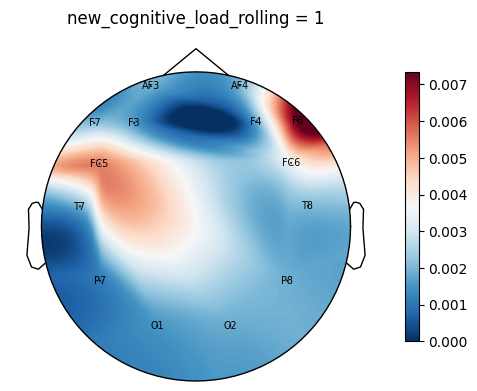

In [152]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt

electrodes = [
    "AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
    "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"
]

def create_mne_info(electrode_list, sfreq=256):
    """
    Crea un objeto info de MNE con canales EEG y monta un esquema estándar 10-20.
    """
    ch_types = ['eeg'] * len(electrode_list)
    info = mne.create_info(ch_names=electrode_list, sfreq=sfreq, ch_types=ch_types)
    montage = mne.channels.make_standard_montage('standard_1020')
    info.set_montage(montage)
    return info

def compute_average_measure_by_electrode(df, electrode_list, measure_suffix='_theta_power'):
    """
    Dado un DataFrame (filtrado según una condición),
    promedia para cada electrodo la columna <electrodo + measure_suffix>.
    
    Retorna:
      - La lista de electrodos encontrados.
      - Un vector con la media de la medida EEG para cada electrodo.
    """
    electrode_found = []
    avg_values = []
    
    for electrode in electrode_list:
        col_name = electrode + measure_suffix
        if col_name in df.columns:
            electrode_found.append(electrode)
            avg_values.append(df[col_name].mean())
    return electrode_found, avg_values

def plot_topomap(avg_values, electrodes_found, info, title=''):
    """
    Genera un topomap a partir de los valores promedio de cada electrodo.
    Se reordena el vector según el orden de info.ch_names; 
    para canales sin datos se asigna NaN.
    """
    # Construir un diccionario: electrodo -> valor promedio
    electrode_to_value = dict(zip(electrodes_found, avg_values))
    
    # Crear un arreglo en el orden de info.ch_names
    data_array = []
    for ch_name in info.ch_names:
        if ch_name in electrode_to_value:
            data_array.append(electrode_to_value[ch_name])
        else:
            data_array.append(np.nan)
    data_array = np.array(data_array, dtype=float)
    
    # Graficar el topomap sin usar vmin/vmax (para compatibilidad)
    fig, ax = plt.subplots(figsize=(6, 5))
    im, _ = mne.viz.plot_topomap(
        data_array, info, axes=ax, show=False,
        names=info.ch_names, cmap='RdBu_r', contours=0
    )
    ax.set_title(title, fontsize=12)
    fig.colorbar(im, ax=ax, shrink=0.7)
    plt.show()


def create_topomaps_theoretical(merged_features, measure_suffix='_theta_power'):
    """
    Recorre todos los valores únicos de 'theoretical_difficulty'
    y genera un topomap para cada nivel.
    """
    # Crear objeto info con el montaje definido
    info = create_mne_info(electrodes)
    
    # Obtener los distintos niveles teóricos (ordenados)
    unique_levels = np.sort(merged_features['theoretical_difficulty'].unique())
    
    for level in unique_levels:
        df_level = merged_features[merged_features['theoretical_difficulty'] == level]
        electrodes_found, avg_values = compute_average_measure_by_electrode(df_level, electrodes, measure_suffix)
        title = f"theoretical_difficulty = {level}"
        plot_topomap(avg_values, electrodes_found, info, title=title)

def create_topomaps_newload(merged_features, measure_suffix='_theta_power'):
    """
    Crea topomaps para la variable 'new_cognitive_load_rolling', separando
    los casos en que el valor es 0 y 1.
    """
    # Crear objeto info
    info = create_mne_info(electrodes)
    
    df_load0 = merged_features[merged_features['new_cognitive_load_rolling'] == 0]
    df_load1 = merged_features[merged_features['new_cognitive_load_rolling'] == 1]
    
    elec_0, avg_0 = compute_average_measure_by_electrode(df_load0, electrodes, measure_suffix)
    elec_1, avg_1 = compute_average_measure_by_electrode(df_load1, electrodes, measure_suffix)
    
    plot_topomap(avg_0, elec_0, info, title='new_cognitive_load_rolling = 0')
    plot_topomap(avg_1, elec_1, info, title='new_cognitive_load_rolling = 1')

create_topomaps_theoretical(features_df, measure_suffix='_beta_power')
create_topomaps_newload(features_df, measure_suffix='_beta_power')

Ahora alpha

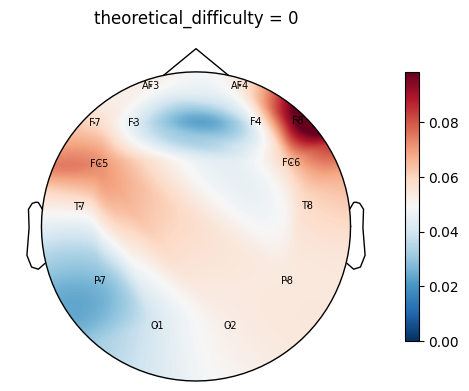

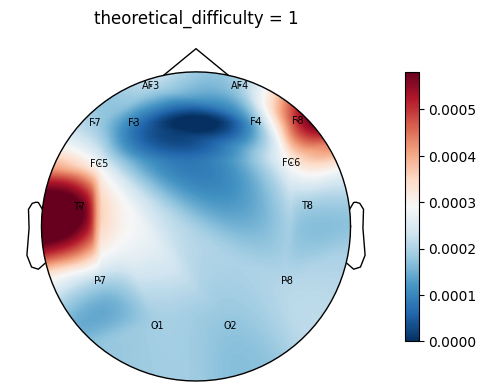

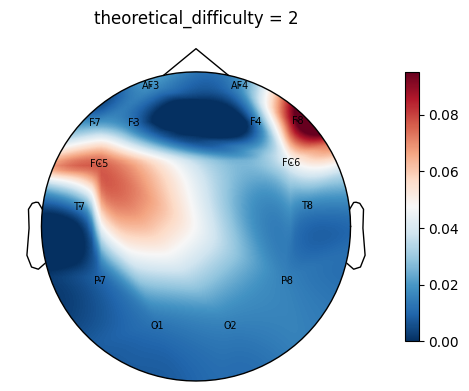

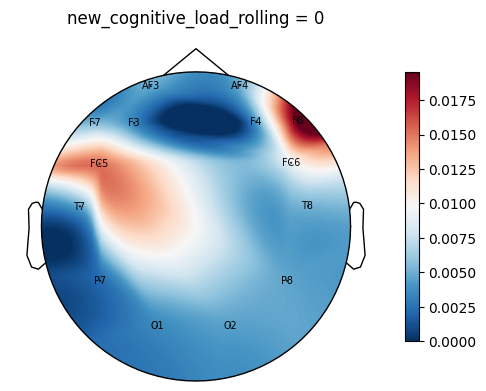

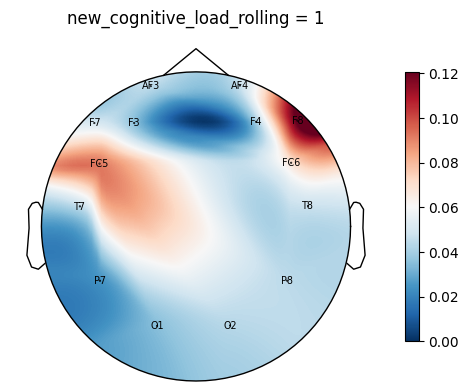

In [153]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt

electrodes = [
    "AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
    "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"
]

def create_mne_info(electrode_list, sfreq=256):
    """
    Crea un objeto info de MNE con canales EEG y monta un esquema estándar 10-20.
    """
    ch_types = ['eeg'] * len(electrode_list)
    info = mne.create_info(ch_names=electrode_list, sfreq=sfreq, ch_types=ch_types)
    montage = mne.channels.make_standard_montage('standard_1020')
    info.set_montage(montage)
    return info

def compute_average_measure_by_electrode(df, electrode_list, measure_suffix='_theta_power'):
    """
    Dado un DataFrame (filtrado según una condición),
    promedia para cada electrodo la columna <electrodo + measure_suffix>.
    
    Retorna:
      - La lista de electrodos encontrados.
      - Un vector con la media de la medida EEG para cada electrodo.
    """
    electrode_found = []
    avg_values = []
    
    for electrode in electrode_list:
        col_name = electrode + measure_suffix
        if col_name in df.columns:
            electrode_found.append(electrode)
            avg_values.append(df[col_name].mean())
    return electrode_found, avg_values

def plot_topomap(avg_values, electrodes_found, info, title=''):
    """
    Genera un topomap a partir de los valores promedio de cada electrodo.
    Se reordena el vector según el orden de info.ch_names; 
    para canales sin datos se asigna NaN.
    """
    # Construir un diccionario: electrodo -> valor promedio
    electrode_to_value = dict(zip(electrodes_found, avg_values))
    
    # Crear un arreglo en el orden de info.ch_names
    data_array = []
    for ch_name in info.ch_names:
        if ch_name in electrode_to_value:
            data_array.append(electrode_to_value[ch_name])
        else:
            data_array.append(np.nan)
    data_array = np.array(data_array, dtype=float)
    
    # Graficar el topomap sin usar vmin/vmax (para compatibilidad)
    fig, ax = plt.subplots(figsize=(6, 5))
    im, _ = mne.viz.plot_topomap(
        data_array, info, axes=ax, show=False,
        names=info.ch_names, cmap='RdBu_r', contours=0
    )
    ax.set_title(title, fontsize=12)
    fig.colorbar(im, ax=ax, shrink=0.7)
    plt.show()


def create_topomaps_theoretical(merged_features, measure_suffix='_theta_power'):
    """
    Recorre todos los valores únicos de 'theoretical_difficulty'
    y genera un topomap para cada nivel.
    """
    # Crear objeto info con el montaje definido
    info = create_mne_info(electrodes)
    
    # Obtener los distintos niveles teóricos (ordenados)
    unique_levels = np.sort(merged_features['theoretical_difficulty'].unique())
    
    for level in unique_levels:
        df_level = merged_features[merged_features['theoretical_difficulty'] == level]
        electrodes_found, avg_values = compute_average_measure_by_electrode(df_level, electrodes, measure_suffix)
        title = f"theoretical_difficulty = {level}"
        plot_topomap(avg_values, electrodes_found, info, title=title)

def create_topomaps_newload(merged_features, measure_suffix='_theta_power'):
    """
    Crea topomaps para la variable 'new_cognitive_load_rolling', separando
    los casos en que el valor es 0 y 1.
    """
    # Crear objeto info
    info = create_mne_info(electrodes)
    
    df_load0 = merged_features[merged_features['new_cognitive_load_rolling'] == 0]
    df_load1 = merged_features[merged_features['new_cognitive_load_rolling'] == 1]
    
    elec_0, avg_0 = compute_average_measure_by_electrode(df_load0, electrodes, measure_suffix)
    elec_1, avg_1 = compute_average_measure_by_electrode(df_load1, electrodes, measure_suffix)
    
    plot_topomap(avg_0, elec_0, info, title='new_cognitive_load_rolling = 0')
    plot_topomap(avg_1, elec_1, info, title='new_cognitive_load_rolling = 1')

# Para visualizar los topomaps de cada nivel de theoretical_difficulty:
create_topomaps_theoretical(features_df, measure_suffix='_alpha_power')

# También puedes visualizar los topomaps para new_cognitive_load_rolling:
create_topomaps_newload(features_df, measure_suffix='_alpha_power')

Gamma

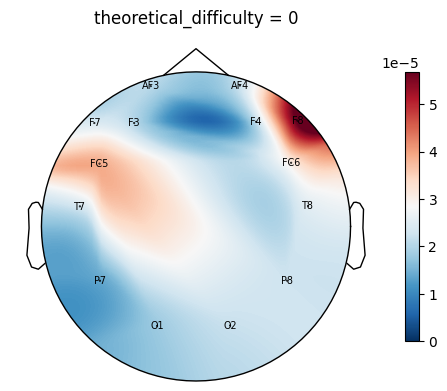

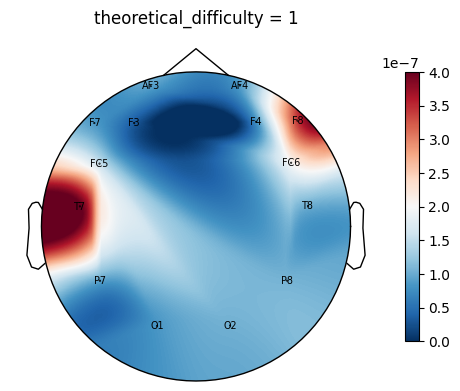

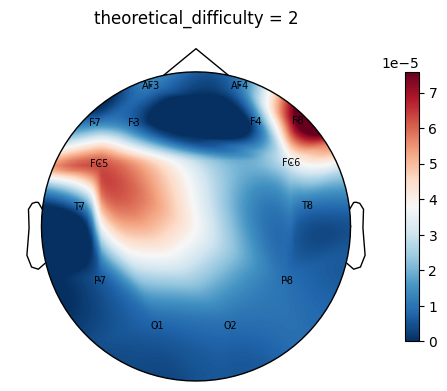

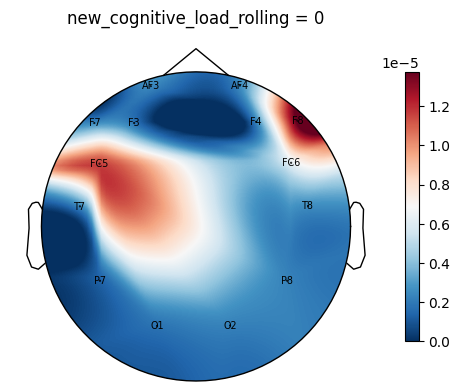

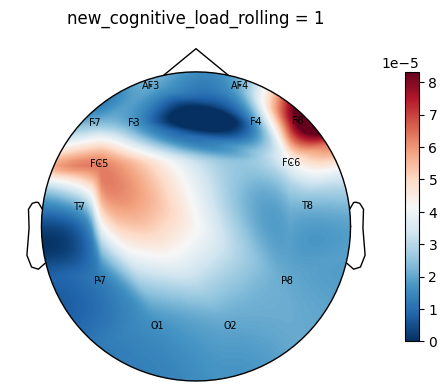

In [154]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt

electrodes = [
    "AF3", "F7", "F3", "FC5", "T7", "P7", "O1",
    "O2", "P8", "T8", "FC6", "F4", "F8", "AF4"
]

def create_mne_info(electrode_list, sfreq=256):
    """
    Crea un objeto info de MNE con canales EEG y monta un esquema estándar 10-20.
    """
    ch_types = ['eeg'] * len(electrode_list)
    info = mne.create_info(ch_names=electrode_list, sfreq=sfreq, ch_types=ch_types)
    montage = mne.channels.make_standard_montage('standard_1020')
    info.set_montage(montage)
    return info

def compute_average_measure_by_electrode(df, electrode_list, measure_suffix='_theta_power'):
    """
    Dado un DataFrame (filtrado según una condición),
    promedia para cada electrodo la columna <electrodo + measure_suffix>.
    
    Retorna:
      - La lista de electrodos encontrados.
      - Un vector con la media de la medida EEG para cada electrodo.
    """
    electrode_found = []
    avg_values = []
    
    for electrode in electrode_list:
        col_name = electrode + measure_suffix
        if col_name in df.columns:
            electrode_found.append(electrode)
            avg_values.append(df[col_name].mean())
    return electrode_found, avg_values

def plot_topomap(avg_values, electrodes_found, info, title=''):
    """
    Genera un topomap a partir de los valores promedio de cada electrodo.
    Se reordena el vector según el orden de info.ch_names; 
    para canales sin datos se asigna NaN.
    """
    # Construir un diccionario: electrodo -> valor promedio
    electrode_to_value = dict(zip(electrodes_found, avg_values))
    
    # Crear un arreglo en el orden de info.ch_names
    data_array = []
    for ch_name in info.ch_names:
        if ch_name in electrode_to_value:
            data_array.append(electrode_to_value[ch_name])
        else:
            data_array.append(np.nan)
    data_array = np.array(data_array, dtype=float)
    
    # Graficar el topomap sin usar vmin/vmax (para compatibilidad)
    fig, ax = plt.subplots(figsize=(6, 5))
    im, _ = mne.viz.plot_topomap(
        data_array, info, axes=ax, show=False,
        names=info.ch_names, cmap='RdBu_r', contours=0
    )
    ax.set_title(title, fontsize=12)
    fig.colorbar(im, ax=ax, shrink=0.7)
    plt.show()

def create_topomaps_theoretical(merged_features, measure_suffix='_theta_power'):
    """
    Recorre todos los valores únicos de 'theoretical_difficulty'
    y genera un topomap para cada nivel.
    """
    # Crear objeto info con el montaje definido
    info = create_mne_info(electrodes)
    
    # Obtener los distintos niveles teóricos (ordenados)
    unique_levels = np.sort(merged_features['theoretical_difficulty'].unique())
    
    for level in unique_levels:
        df_level = merged_features[merged_features['theoretical_difficulty'] == level]
        electrodes_found, avg_values = compute_average_measure_by_electrode(df_level, electrodes, measure_suffix)
        title = f"theoretical_difficulty = {level}"
        plot_topomap(avg_values, electrodes_found, info, title=title)

def create_topomaps_newload(merged_features, measure_suffix='_theta_power'):
    """
    Crea topomaps para la variable 'new_cognitive_load_rolling', separando
    los casos en que el valor es 0 y 1.
    """
    # Crear objeto info
    info = create_mne_info(electrodes)
    
    df_load0 = merged_features[merged_features['new_cognitive_load_rolling'] == 0]
    df_load1 = merged_features[merged_features['new_cognitive_load_rolling'] == 1]
    
    elec_0, avg_0 = compute_average_measure_by_electrode(df_load0, electrodes, measure_suffix)
    elec_1, avg_1 = compute_average_measure_by_electrode(df_load1, electrodes, measure_suffix)
    
    plot_topomap(avg_0, elec_0, info, title='new_cognitive_load_rolling = 0')
    plot_topomap(avg_1, elec_1, info, title='new_cognitive_load_rolling = 1')


create_topomaps_theoretical(features_df, measure_suffix='_gamma_power')
create_topomaps_newload(features_df, measure_suffix='_gamma_power')

-----------------------

### **MODELOS DE IA**

In [5]:
import numpy as np
import pandas as pd
from collections import Counter

from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import (
    confusion_matrix, classification_report,
    recall_score, make_scorer
)
from imblearn.over_sampling import SMOTE

Una vez tenemos nuestra matriz de caracteristicas, procedemos a implementar nuestros primeros modelos de Inteligencia Artificial.

#### Modelos con la variable a predecir : theoretical_difficulty

In [7]:
features_df = pd.read_csv('features.csv')

In [8]:
features_df.head()

,start_time,subject,AF3_mean,AF3_std,AF3_var,AF3_skew,AF3_kurtosis,AF3_ptp,AF3_zero_crossings,AF3_delta_power,...,AF4_gamma_power,AF4_delta_power_rel,AF4_theta_power_rel,AF4_alpha_power_rel,AF4_beta_power_rel,AF4_gamma_power_rel,AF4_theta_alpha_ratio,AF4_spectral_entropy,frontal_alpha_asym,theoretical_difficulty
0,2020-12-22 10:38:58.234317,2,9.185956,4.936416,24.368208,0.489765,-0.709345,19.113274,1,20.082846,...,1.206789e-07,0.995173,0.004808,1.790548e-05,1.063151e-06,1.068134e-08,268.513670,2.634057,0.670798,1
1,2020-12-22 10:38:59.240643,2,-1.411658,4.178314,17.458310,-0.625003,-0.576020,14.458753,5,24.523594,...,6.433797e-10,0.989101,0.010898,9.519210e-07,8.960073e-09,4.373675e-11,11448.862161,2.508693,-0.479868,1
2,2020-12-22 10:39:00.252792,2,0.679351,4.365827,19.060448,-0.203865,-0.678221,15.941603,5,21.443243,...,4.436423e-09,0.997018,0.002978,3.245099e-06,2.073342e-08,1.614350e-10,917.844511,2.452233,0.697703,1
3,2020-12-22 10:39:01.268643,2,-1.629880,4.709347,22.177945,0.336729,-0.938611,16.103417,3,30.031265,...,8.265715e-09,0.968532,0.031464,3.763754e-06,4.501887e-08,4.037285e-10,8359.746359,2.597899,0.324304,1
4,2020-12-22 10:39:02.281693,2,2.251481,3.543632,12.557327,0.261140,-1.226234,11.208006,5,13.921721,...,1.697767e-09,0.989681,0.010317,2.286073e-06,7.539291e-09,7.237141e-11,4512.953483,2.457049,0.330484,1


In [9]:
# Detectamos columnas constantes
constant_cols = [col for col in features_df.columns 
                 if features_df[col].nunique(dropna=False) <= 1]
print(f"Columnas constantes (único valor en toda la serie):\n{constant_cols}")

# Eliminamos esas columnas
df_features_clean = features_df.drop(columns=constant_cols)

# Verificar
print(f"\nShape antes: {features_df.shape}")
print(f"Shape después: {df_features_clean.shape}")

Columnas constantes (único valor en toda la serie):
[]

Shape antes: (5748, 270)
Shape después: (5748, 270)


In [10]:
df_features_clean.value_counts("theoretical_difficulty")

theoretical_difficulty
2    2161
0    1954
1    1633
Name: count, dtype: int64

Eliminamos las columnas que no nos interesan a la hora de calcular el modelo 

In [11]:
cols_to_drop = [
    'perceived_difficulty', 'start_time', 'phase', 'flight',
    'theoretical_difficulty', 'composite_index', 'new_cognitive_load_global',
    'subject_median', 'new_cognitive_load_subject', 'rolling_median',
    'new_cognitive_load_rolling', 'subject'
]

# drop ignora las columnas ausentes en lugar de lanzar KeyError
X = df_features_clean.drop(columns=cols_to_drop, errors='ignore')
y = df_features_clean['theoretical_difficulty']

X_copy = X.copy()
y_copy = y.copy()

# Copias para discretizar o usar en otros modelos
X_RL = X.copy()
y_RL = y.copy()

In [12]:
# Definimos funciones para sensibilidad (recall) y especificidad como macro-promedios multiclas
def specificity_score(y_true, y_pred):
    """Calcula la especificidad por clase y devuelve el promedio (macro)."""
    cm = confusion_matrix(y_true, y_pred)
    n_classes = cm.shape[0]
    specs = []
    for i in range(n_classes):
        TP = cm[i, i]
        FP = cm[:, i].sum() - TP
        FN = cm[i, :].sum() - TP
        TN = cm.sum() - (TP + FP + FN)
        specs.append(TN / (TN + FP) if (TN + FP) > 0 else 0.0)
    return np.mean(specs)

sens_scorer = make_scorer(recall_score, average='macro')         # sensibilidad macro
spec_scorer = make_scorer(specificity_score)                    # especificidad macro

In [13]:
from sklearn.model_selection import train_test_split
# X, y tus datos y etiquetas
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,       # 20 % para test
    stratify=y,          # si es clasificación, para mantener proporciones de clases
    random_state=42
)

---

##### **REGRESIÓN LOGÍSTICA**

Como el modelo de Regresión Logística trabaja con datos enteros, los pasamos todos.

Modelo base

In [ ]:
pipe1 = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(max_iter=10000, random_state=42))
])

param_grid1 = {
    'clf__C':       [1, 10, 100],
    'clf__solver':  ['liblinear', 'lbfgs'],
    'clf__class_weight': [None, 'balanced']  # Evaluar sin balanceo o con balanceo automático
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
gs1 = GridSearchCV(
    pipe1, param_grid1,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [16]:
print("Entrenando LogisticRegression con GridSearchCV…")
gs1.fit(X_train, y_train)
print("Mejores parámetros:", gs1.best_params_)

# Evaluación en el TEST
y_pred_test = gs1.predict(X_test)
print("\n— LogisticRegression en TEST —")
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")

Entrenando LogisticRegression con GridSearchCV…
Mejores parámetros: {'clf__C': 100, 'clf__class_weight': 'balanced', 'clf__solver': 'liblinear'}

— LogisticRegression en TEST —
Matriz de Confusión:
 [[279  18  94]
 [  5 307  15]
 [ 84  23 325]]

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.71      0.74       391
           1       0.88      0.94      0.91       327
           2       0.75      0.75      0.75       432

    accuracy                           0.79      1150
   macro avg       0.80      0.80      0.80      1150
weighted avg       0.79      0.79      0.79      1150

Sensibilidad macro: 0.802
Especificidad macro: 0.894


Ahora con SMOTE y Feature Selection

In [ ]:
from imblearn.pipeline import Pipeline as ImbPipeline

pipe2 = ImbPipeline([
    ('smote', SMOTE(random_state=42)),
    ('fs',    SelectKBest(f_classif, k=70)),
    ('scaler', StandardScaler()),
    ('clf',    LogisticRegression(max_iter=30000, random_state=42))
])

param_grid2 = {
    'clf__C':       [1, 10, 100],
    'clf__solver':  ['liblinear', 'lbfgs'],
    'clf__class_weight': [None, 'balanced']  # Evaluar sin balanceo o con balanceo automático
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
gs2 = GridSearchCV(
    pipe2, param_grid2,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',       # al terminar, refit por la mejor sensibilidad
    n_jobs=-1,
    error_score='raise' # falla rápido si algo es inválido
)

In [18]:
print("\nEntrenando LogisticRegression + SMOTE + FS…")
gs2.fit(X_train, y_train)
print("Mejores parámetros (SMOTE+FS):", gs2.best_params_)


print("\n— Resultados LogisticRegression (con SMOTE + FS) —")
y_pred_test = gs2.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")


Entrenando LogisticRegression + SMOTE + FS…
Mejores parámetros (SMOTE+FS): {'clf__C': 100, 'clf__class_weight': None, 'clf__solver': 'lbfgs'}

— Resultados LogisticRegression (con SMOTE + FS) —
Matriz de Confusión:
 [[267  13 111]
 [  5 314   8]
 [ 66  25 341]]

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.68      0.73       391
           1       0.89      0.96      0.92       327
           2       0.74      0.79      0.76       432

    accuracy                           0.80      1150
   macro avg       0.81      0.81      0.81      1150
weighted avg       0.80      0.80      0.80      1150

Sensibilidad macro: 0.811
Especificidad macro: 0.898


--------------------------

##### **K-NN**

In [19]:
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report, recall_score

Modelo base

In [ ]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

pipe_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('clf',    KNeighborsClassifier())
])

param_grid_knn = {
    'clf__n_neighbors': list(range(3, 101, 2)),      # probar 3,5,7,...15 vecinos
    'clf__weights':     ['uniform', 'distance'],    # uniform vs por distancia
    'clf__p':           [1, 2]                      # p=1 Minkowski=Manhattan, p=2 Euclidiana
}

gs_knn = GridSearchCV(
    pipe_knn,
    param_grid_knn,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [ ]:
print("Entrenando K-NN con GridSearchCV…")
gs_knn.fit(X_train, y_train)
print("Mejores parámetros K-NN:", gs_knn.best_params_)

print("\n— Resultados K-NN —")
y_pred_test = gs_knn.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")

Entrenando K-NN con GridSearchCV…
Mejores parámetros K-NN: {'clf__n_neighbors': 29, 'clf__p': 1, 'clf__weights': 'uniform'}

— Resultados K-NN —
Matriz de Confusión:
 [[270   6 115]
 [ 24 125 178]
 [139   5 288]]

Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.69      0.66       391
           1       0.92      0.38      0.54       327
           2       0.50      0.67      0.57       432

    accuracy                           0.59      1150
   macro avg       0.68      0.58      0.59      1150
weighted avg       0.66      0.59      0.59      1150

Sensibilidad macro: 0.580
Especificidad macro: 0.788


Selección de carcaterísticas y SMOTE

In [ ]:
pipe_knn_smote = ImbPipeline([
    ('smote',  SMOTE(random_state=42)),
    ('fs',     SelectKBest(f_classif, k=70)),
    ('scaler', StandardScaler()),
    ('clf',    KNeighborsClassifier())
])

param_grid_knn_smote = {
    'clf__n_neighbors': list(range(3, 101, 2)),
    'clf__weights':     ['uniform', 'distance'],
    'clf__p':           [1, 2]
}

gs_knn_smote = GridSearchCV(
    pipe_knn_smote,
    param_grid_knn_smote,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [ ]:
print("\nEntrenando K-NN + SMOTE + FS…")
gs_knn_smote.fit(X_train, y_train)
print("Mejores parámetros (SVM- + SMOTE + FS):", gs_knn_smote.best_params_)

print("\n— Resultados K-NN (con SMOTE + FS) —")
y_pred_test = gs_knn_smote.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")


Entrenando K-NN + SMOTE + FS…
Mejores parámetros (K-NN + SMOTE + FS): {'clf__n_neighbors': 35, 'clf__p': 1, 'clf__weights': 'distance'}

— Resultados K-NN (con SMOTE + FS) —
Matriz de Confusión:
 [[268  32  91]
 [ 15 268  44]
 [127  53 252]]

Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.69      0.67       391
           1       0.76      0.82      0.79       327
           2       0.65      0.58      0.62       432

    accuracy                           0.69      1150
   macro avg       0.69      0.70      0.69      1150
weighted avg       0.68      0.69      0.68      1150

Sensibilidad macro: 0.696
Especificidad macro: 0.841


-------

##### **RANDOM FOREST**

In [24]:
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report, recall_score
from imblearn.over_sampling import SMOTE

In [25]:
pipe_rf = Pipeline([
    ('clf', RandomForestClassifier(random_state=42))
])

param_grid_rf = {
    'clf__n_estimators':       [50, 100, 200, 500],
    'clf__max_depth':          [None, 10, 20],
    'clf__min_samples_split':  [2, 5, 10],
    'clf__min_samples_leaf': [1, 2, 4],    # Mínimo número de muestras en una hoja
    'clf__class_weight':       [None, 'balanced']
}

gs_rf = GridSearchCV(
    pipe_rf,
    param_grid_rf,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',       # refit según mejor sensibilidad
    n_jobs=-1,
    error_score='raise'
)

In [26]:
print("Entrenando RandomForest con GridSearchCV…")
gs_rf.fit(X_train, y_train)
print("Mejores parámetros RF:", gs_rf.best_params_)

print("\n— Resultados RandomForest —")
y_pred_test = gs_rf.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")

Entrenando RandomForest con GridSearchCV…
Mejores parámetros RF: {'clf__class_weight': 'balanced', 'clf__max_depth': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}

— Resultados RandomForest —
Matriz de Confusión:
 [[283   4 104]
 [  9 304  14]
 [ 72   7 353]]

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.72      0.75       391
           1       0.97      0.93      0.95       327
           2       0.75      0.82      0.78       432

    accuracy                           0.82      1150
   macro avg       0.83      0.82      0.83      1150
weighted avg       0.82      0.82      0.82      1150

Sensibilidad macro: 0.824
Especificidad macro: 0.905


Ahora con SMOTE ( ya se hace seleción de características interna )

In [27]:
pipe_rf_smote = ImbPipeline([
    ('smote', SMOTE(random_state=42)),
    ('clf',   RandomForestClassifier(random_state=42))
])

# Usamos la misma grilla de hiperparámetros que arriba
gs_rf_smote = GridSearchCV(
    pipe_rf_smote,
    param_grid_rf,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [28]:
print("\nEntrenando RandomForest + SMOTE…")
gs_rf_smote.fit(X_train, y_train)
print("Mejores parámetros (RF + SMOTE):", gs_rf_smote.best_params_)

print("\n— Resultados RandomForest (con SMOTE) —")
y_pred_test = gs_rf_smote.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")


Entrenando RandomForest + SMOTE…
Mejores parámetros (RF + SMOTE): {'clf__class_weight': None, 'clf__max_depth': None, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}

— Resultados RandomForest (con SMOTE) —
Matriz de Confusión:
 [[287   4 100]
 [  6 305  16]
 [ 75   8 349]]

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.73      0.76       391
           1       0.96      0.93      0.95       327
           2       0.75      0.81      0.78       432

    accuracy                           0.82      1150
   macro avg       0.83      0.82      0.83      1150
weighted avg       0.82      0.82      0.82      1150

Sensibilidad macro: 0.825
Especificidad macro: 0.906


Importancia de características

Top 10 características más importantes:

          Feature  Importance
0          F3_ptp    0.052443
1          F3_std    0.043204
2          F3_var    0.040875
3  F3_delta_power    0.037566
4  F3_theta_power    0.030814
5  F3_alpha_power    0.029065
6   F3_beta_power    0.026118
7  F4_alpha_power    0.021870
8          F4_std    0.018450
9          F4_ptp    0.014699


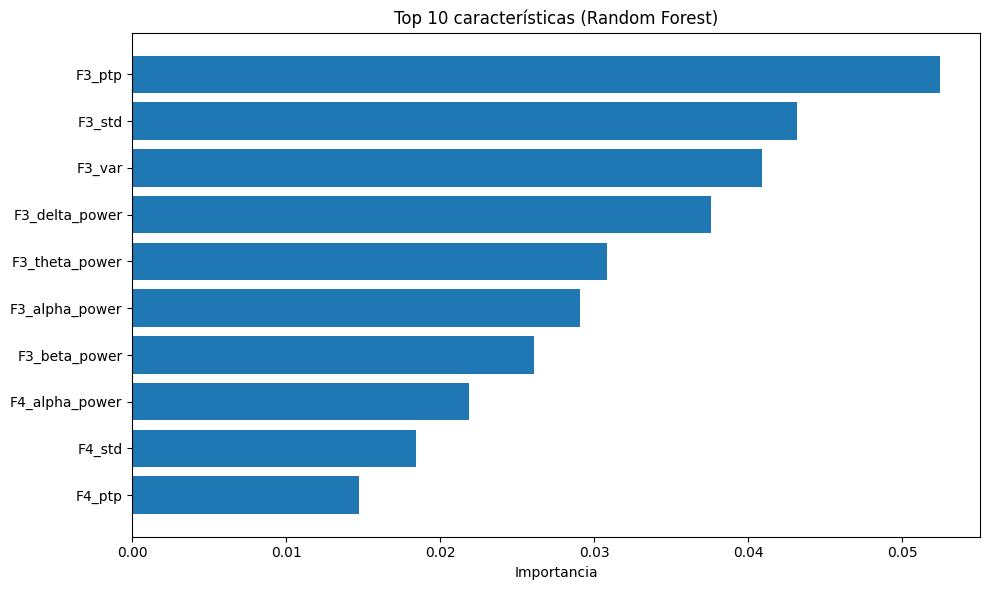

In [29]:
best_pipeline = gs_rf_smote.best_estimator_
best_rf = best_pipeline.named_steps['clf']

feature_names = X.columns  

importances = best_rf.feature_importances_

feature_importances = (
    pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    })
    .sort_values('Importance', ascending=False)
    .reset_index(drop=True)
)

print("Top 10 características más importantes:\n")
print(feature_importances.head(10))

plt.figure(figsize=(10, 6))
plt.barh(
    feature_importances['Feature'].head(10)[::-1],
    feature_importances['Importance'].head(10)[::-1]
)
plt.xlabel('Importancia')
plt.title('Top 10 características (Random Forest)')
plt.tight_layout()
plt.show()

---

##### **SVM ( SUPPORT VECTOR MACHINES )**

In [30]:
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report, recall_score

In [ ]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

pipe_svm = Pipeline([
    ('scaler', StandardScaler()),
    ('clf',    SVC())
])

param_grid_svm = {
    'clf__C':            [10, 100, 1000],
    'clf__kernel':       ['linear', 'rbf'],
    'clf__gamma':        ['scale', 'auto'],
    'clf__class_weight': [None, 'balanced']
}

gs_svm = GridSearchCV(
    pipe_svm,
    param_grid_svm,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [33]:
print("Entrenando SVM con GridSearchCV…")
gs_svm.fit(X_train, y_train)
print("Mejores parámetros SVM:", gs_svm.best_params_)

print("\n— Resultados SVM —")
y_pred_test = gs_svm.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")

Entrenando SVM con GridSearchCV…
Mejores parámetros SVM: {'clf__C': 100, 'clf__class_weight': 'balanced', 'clf__gamma': 'scale', 'clf__kernel': 'linear'}

— Resultados SVM —
Matriz de Confusión:
 [[282  11  98]
 [  9 307  11]
 [ 88  13 331]]

Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.72      0.73       391
           1       0.93      0.94      0.93       327
           2       0.75      0.77      0.76       432

    accuracy                           0.80      1150
   macro avg       0.81      0.81      0.81      1150
weighted avg       0.80      0.80      0.80      1150

Sensibilidad macro: 0.809
Especificidad macro: 0.897


In [34]:
pipe_svm_smote = ImbPipeline([
    ('smote',  SMOTE(random_state=42)),
    ('fs',     SelectKBest(f_classif, k=70)),
    ('scaler', StandardScaler()),
    ('clf',    SVC())
])

param_grid_svm_smote = {
    'clf__C':            [10, 100, 1000],
    'clf__kernel':       ['linear', 'rbf'],
    'clf__gamma':        ['scale', 'auto'],
    'clf__class_weight': [None, 'balanced']
}

gs_svm_smote = GridSearchCV(
    pipe_svm_smote,
    param_grid_svm_smote,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [35]:
print("\nEntrenando SVM + SMOTE + FS…")
gs_svm_smote.fit(X_train, y_train)
print("Mejores parámetros (SVM + SMOTE + FS):", gs_svm_smote.best_params_)

print("\n— Resultados SVM (con SMOTE + FS) —")
y_pred_test = gs_svm_smote.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")


Entrenando SVM + SMOTE + FS…
Mejores parámetros (SVM + SMOTE + FS): {'clf__C': 1000, 'clf__class_weight': None, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}

— Resultados SVM (con SMOTE + FS) —
Matriz de Confusión:
 [[272   8 111]
 [  5 313   9]
 [ 61  15 356]]

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.70      0.75       391
           1       0.93      0.96      0.94       327
           2       0.75      0.82      0.78       432

    accuracy                           0.82      1150
   macro avg       0.83      0.83      0.82      1150
weighted avg       0.82      0.82      0.82      1150

Sensibilidad macro: 0.826
Especificidad macro: 0.906


------

##### XGBOOST

In [36]:
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report, recall_score

Modelo base

In [ ]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

pipe_xgb1 = Pipeline([
    ('scaler', StandardScaler()),  # opcional en árboles, pero consistente
    ('clf', XGBClassifier(
        eval_metric='mlogloss',
        random_state=42
    ))
])

param_grid_xgb1 = {
    'clf__n_estimators':    [100, 200],
    'clf__max_depth':       [3, 5, 7],
    'clf__learning_rate':   [0.01, 0.1, 0.2],
    'clf__subsample':       [0.8, 1.0],
}

gs_xgb1 = GridSearchCV(
    pipe_xgb1, param_grid_xgb1,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',       # al final, refit sobre la mejor sensibilidad
    n_jobs=-1,
    error_score='raise'
)

In [38]:
print("Entrenando XGBoost con GridSearchCV…")
gs_xgb1.fit(X_train, y_train)
print("Mejores parámetros:", gs_xgb1.best_params_)

print("\n— Resultados XGBoost —")
y_pred_test = gs_xgb1.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")

Entrenando XGBoost con GridSearchCV…


/opt/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Mejores parámetros: {'clf__learning_rate': 0.1, 'clf__max_depth': 7, 'clf__n_estimators': 200, 'clf__subsample': 0.8}

— Resultados XGBoost —
Matriz de Confusión:
 [[300   2  89]
 [ 10 305  12]
 [ 71   3 358]]

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       391
           1       0.98      0.93      0.96       327
           2       0.78      0.83      0.80       432

    accuracy                           0.84      1150
   macro avg       0.85      0.84      0.85      1150
weighted avg       0.84      0.84      0.84      1150

Sensibilidad macro: 0.843
Especificidad macro: 0.916


Con SMOTE

In [39]:
pipe_xgb2 = ImbPipeline([
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),
    ('clf',   XGBClassifier(
        eval_metric='mlogloss',
        random_state=42
    ))
])

param_grid_xgb2 = {
    'clf__n_estimators':    [100, 200],
    'clf__max_depth':       [3, 5, 7],
    'clf__learning_rate':   [0.01, 0.1, 0.2],
    'clf__subsample':       [0.8, 1.0],
}

gs_xgb2 = GridSearchCV(
    pipe_xgb2, param_grid_xgb2,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [40]:
print("\nEntrenando XGBoost + SMOTE + FS…")
gs_xgb2.fit(X_train, y_train)
print("Mejores parámetros (SMOTE+FS):", gs_xgb2.best_params_)

print("\n— Resultados XGBoost (con SMOTE + FS) —")
y_pred_test = gs_xgb2.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")


Entrenando XGBoost + SMOTE + FS…


/opt/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Mejores parámetros (SMOTE+FS): {'clf__learning_rate': 0.2, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__subsample': 0.8}

— Resultados XGBoost (con SMOTE + FS) —
Matriz de Confusión:
 [[292   6  93]
 [  7 309  11]
 [ 88   8 336]]

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.75      0.75       391
           1       0.96      0.94      0.95       327
           2       0.76      0.78      0.77       432

    accuracy                           0.81      1150
   macro avg       0.82      0.82      0.82      1150
weighted avg       0.82      0.81      0.82      1150

Sensibilidad macro: 0.823
Especificidad macro: 0.904


Importancia de Características

Top 10 características más importantes (XGBoost):

          Feature  Importance
0          F3_ptp    0.119725
1  F3_gamma_power    0.089545
2          F3_std    0.045651
3  O1_gamma_power    0.016228
4  F3_delta_power    0.015062
5  F3_alpha_power    0.013947
6          O1_var    0.013630
7          P7_ptp    0.009660
8   F3_beta_power    0.009166
9          F3_var    0.009101


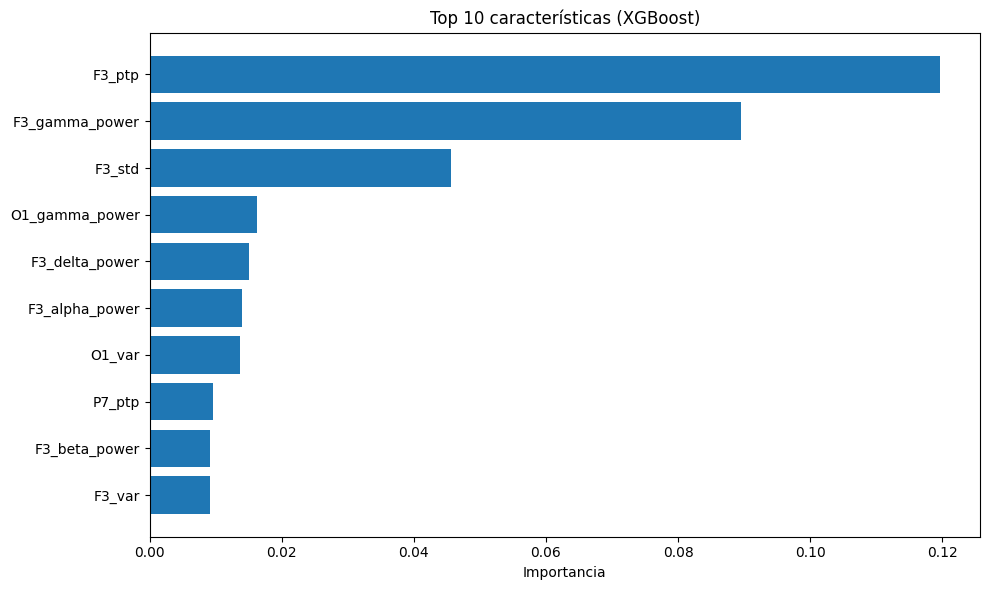

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

best_pipeline = gs_xgb2.best_estimator_
best_xgb      = best_pipeline.named_steps['clf']

feature_names = X.columns

importances = best_xgb.feature_importances_

feature_importances = (
    pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    })
    .sort_values('Importance', ascending=False)
    .reset_index(drop=True)
)

print("Top 10 características más importantes (XGBoost):\n")
print(feature_importances.head(10))

plt.figure(figsize=(10, 6))
plt.barh(
    feature_importances['Feature'].head(10)[::-1],
    feature_importances['Importance'].head(10)[::-1]
)
plt.xlabel('Importancia')
plt.title('Top 10 características (XGBoost)')
plt.tight_layout()
plt.show()

------

##### **Gradient Boosting**

In [42]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report, recall_score

In [ ]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

pipe_gb1 = Pipeline([
    ('scaler', StandardScaler()),  # opcional en árboles, pero consistente
    ('clf', GradientBoostingClassifier(random_state=42))
])

param_grid_gb1 = {
    'clf__n_estimators': [200, 300],
    'clf__learning_rate': [0.1, 0.2],
    'clf__max_depth': [3, 5, 7],
    'clf__subsample': [0.8, 1.0],
    'clf__max_features': ['sqrt', 'log2']
}

gs_gb1 = GridSearchCV(
    pipe_gb1, param_grid_gb1,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [44]:
print("Entrenando GradientBoostingClassifier con GridSearchCV…")
gs_gb1.fit(X_train, y_train)
print("Mejores parámetros:", gs_gb1.best_params_)

print("\n— Resultados Gradient Boosting —")
y_pred_test = gs_gb1.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")

Entrenando GradientBoostingClassifier con GridSearchCV…
Mejores parámetros: {'clf__learning_rate': 0.1, 'clf__max_depth': 5, 'clf__max_features': 'sqrt', 'clf__n_estimators': 200, 'clf__subsample': 1.0}

— Resultados Gradient Boosting —
Matriz de Confusión:
 [[300   3  88]
 [  9 306  12]
 [ 70   2 360]]

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       391
           1       0.98      0.94      0.96       327
           2       0.78      0.83      0.81       432

    accuracy                           0.84      1150
   macro avg       0.85      0.85      0.85      1150
weighted avg       0.84      0.84      0.84      1150

Sensibilidad macro: 0.845
Especificidad macro: 0.917


Con SMOTE

In [45]:
pipe_gb2 = ImbPipeline([
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),
    ('clf', GradientBoostingClassifier(random_state=42))
])

param_grid_gb2 = {
    'clf__n_estimators': [200, 300],
    'clf__learning_rate': [0.1, 0.2],
    'clf__max_depth': [3, 5, 7],
    'clf__subsample': [0.8, 1.0],
    'clf__max_features': ['sqrt', 'log2']
}

gs_gb2 = GridSearchCV(
    pipe_gb2, param_grid_gb2,
    cv=cv,
    scoring={'sens': sens_scorer, 'spec': spec_scorer},
    refit='sens',
    n_jobs=-1,
    error_score='raise'
)

In [46]:
print("\nEntrenando GradientBoostingClassifier + SMOTE…")
gs_gb2.fit(X_train, y_train)
print("Mejores parámetros (SMOTE):", gs_gb2.best_params_)

print("\n— Resultados Gradient Boosting (con SMOTE) —")
y_pred_test = gs_gb2.predict(X_test)
print("Matriz de Confusión:\n", confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:\n", classification_report(y_test, y_pred_test))
print(f"Sensibilidad macro: {recall_score(y_test, y_pred_test, average='macro'):.3f}")
print(f"Especificidad macro: {specificity_score(y_test, y_pred_test):.3f}")


Entrenando GradientBoostingClassifier + SMOTE…
Mejores parámetros (SMOTE): {'clf__learning_rate': 0.2, 'clf__max_depth': 3, 'clf__max_features': 'sqrt', 'clf__n_estimators': 300, 'clf__subsample': 0.8}

— Resultados Gradient Boosting (con SMOTE) —
Matriz de Confusión:
 [[302   3  86]
 [  9 309   9]
 [ 81   5 346]]

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.77      0.77       391
           1       0.97      0.94      0.96       327
           2       0.78      0.80      0.79       432

    accuracy                           0.83      1150
   macro avg       0.84      0.84      0.84      1150
weighted avg       0.83      0.83      0.83      1150

Sensibilidad macro: 0.839
Especificidad macro: 0.913


Feature Importance

Top 10 características (Gradient Boosting básico):
                Feature  Importance
40               F3_var    0.113050
39               F3_std    0.103000
43               F3_ptp    0.054362
49       F3_gamma_power    0.044692
47       F3_alpha_power    0.041212
176              T8_ptp    0.029840
46       F3_theta_power    0.028704
220      F4_gamma_power    0.023466
216      F4_delta_power    0.022877
266  frontal_alpha_asym    0.019359


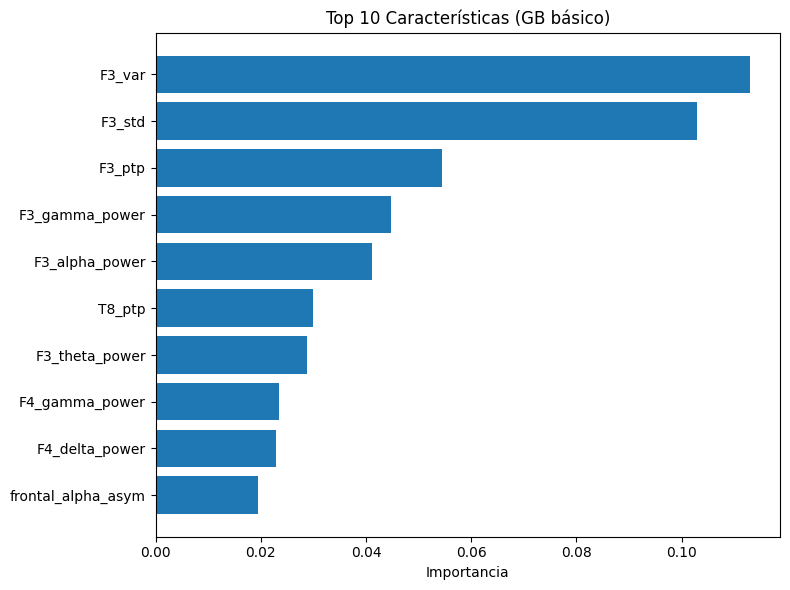

In [47]:
best_gb_basic = gs_gb2.best_estimator_.named_steps['clf']

importances_basic = best_gb_basic.feature_importances_

feature_names = X.columns

feat_imp_basic = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances_basic
}).sort_values(by='Importance', ascending=False)

print("Top 10 características (Gradient Boosting básico):")
print(feat_imp_basic.head(10))

plt.figure(figsize=(8,6))
plt.barh(feat_imp_basic['Feature'].head(10)[::-1], 
         feat_imp_basic['Importance'].head(10)[::-1])
plt.xlabel('Importancia')
plt.title('Top 10 Características (GB básico)')
plt.tight_layout()
plt.show()

---

##### **RED NEURONAL**

In [48]:
import pandas as pd
import numpy as np

from sklearn.model_selection      import train_test_split
from sklearn.preprocessing       import StandardScaler
from sklearn.utils.class_weight   import compute_class_weight
from imblearn.over_sampling       import BorderlineSMOTE

import tensorflow as tf
from tensorflow.keras             import Model, Input
from tensorflow.keras.layers      import Dense, Dropout, BatchNormalization, GaussianNoise, LeakyReLU
from tensorflow.keras.callbacks   import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2

from sklearn.metrics              import confusion_matrix, classification_report


In [49]:
cols_to_drop = [
    'perceived_difficulty', 'start_time', 'phase', 'flight',
    'composite_index', 'new_cognitive_load_global',
    'subject_median', 'new_cognitive_load_subject',
    'rolling_median', 'new_cognitive_load_rolling', 'subject', 'theoretical_difficulty'
]

In [50]:
X = features_df.drop(columns=cols_to_drop, errors='ignore')
y = features_df['theoretical_difficulty'].to_numpy()

# Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split train / test
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, stratify=y, random_state=42
)
# train -> train/val
X_tr, X_val, y_tr, y_val = train_test_split(
    X_train, y_train, test_size=0.2, 
    stratify=y_train, random_state=42
)

In [51]:
# SMOTE en train (BorderlineSMOTE más enfocado en ejemplos fronterizos)
sm = BorderlineSMOTE(random_state=42)
X_tr_res, y_tr_res = sm.fit_resample(X_tr, y_tr)

In [67]:
# Pesos de clase (named args)
custom_weights = {0: 2.0, 1: 1.0, 2: 2.0}

classes = np.unique(y_tr_res)
cw_vals = compute_class_weight(
    class_weight=custom_weights,
    classes=classes,
    y=y_tr_res
)
class_weight = dict(zip(classes, cw_vals))

print("Distribución antes SMOTE:", pd.Series(y_tr).value_counts().to_dict())
print("Distribución tras SMOTE:", pd.Series(y_tr_res).value_counts().to_dict())
print("Class weights:", class_weight)

Distribución antes SMOTE: {2: 1383, 0: 1250, 1: 1045}
Distribución tras SMOTE: {1: 1383, 2: 1383, 0: 1383}
Class weights: {0: 2.0, 1: 1.0, 2: 2.0}


In [ ]:
def focal_loss(gamma=1.5, alpha=[0.5,0.25,0.5]):
    def loss_fn(y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        y_true_oh = tf.one_hot(y_true, depth=len(classes))
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)
        ce = - y_true_oh * tf.math.log(y_pred)
        weight = alpha * tf.math.pow(1.0 - y_pred, gamma)
        fl = weight * ce
        return tf.reduce_sum(fl, axis=1)
    return loss_fn

In [81]:
def build_model(units_list, input_dim,
                dropout_rate=0.4, l2_reg=1e-3, lr=1e-3):
    inp = Input(shape=(input_dim,))
    x = GaussianNoise(0.1)(inp)
    for units in units_list:
        x = Dense(units,
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2(l2_reg))(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = BatchNormalization()(x)
        x = Dropout(dropout_rate)(x)
    out = Dense(len(classes), activation='softmax')(x)

    model = Model(inp, out)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss=focal_loss(gamma=2.0, alpha=0.25),
        metrics=['accuracy']
    )
    return model


=== Entrenando small net ===


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)     │ (None, 267)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_28               │ (None, 267)            │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 128)            │        34,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_98 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_98          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_98 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_99 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_99          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_99 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,523 (170.01 KB)

 Trainable params: 43,139 (168.51 KB)

 Non-trainable params: 384 (1.50 KB)

Epoch 1/300
65/65 - 1s - 12ms/step - accuracy: 0.4309 - loss: 0.8240 - val_accuracy: 0.5478 - val_loss: 0.4786 - learning_rate: 0.0010
Epoch 2/300
65/65 - 0s - 2ms/step - accuracy: 0.4772 - loss: 0.6699 - val_accuracy: 0.5880 - val_loss: 0.4455 - learning_rate: 0.0010
Epoch 3/300
65/65 - 0s - 2ms/step - accuracy: 0.4963 - loss: 0.5973 - val_accuracy: 0.5826 - val_loss: 0.4229 - learning_rate: 0.0010
Epoch 4/300
65/65 - 0s - 2ms/step - accuracy: 0.5293 - loss: 0.5398 - val_accuracy: 0.6065 - val_loss: 0.4012 - learning_rate: 0.0010
Epoch 5/300
65/65 - 0s - 2ms/step - accuracy: 0.5334 - loss: 0.5070 - val_accuracy: 0.6250 - val_loss: 0.3803 - learning_rate: 0.0010
Epoch 6/300
65/65 - 0s - 1ms/step - accuracy: 0.5527 - loss: 0.4636 - val_accuracy: 0.6293 - val_loss: 0.3611 - learning_rate: 0.0010
Epoch 7/300
65/65 - 0s - 1ms/step - accuracy: 0.5845 - loss: 0.4282 - val_accuracy: 0.6359 - val_loss: 0.3409 - learning_rate: 0.0010
Epoch 8/300
65/65 - 0s - 1ms/step - accuracy: 0.5823 - loss: 

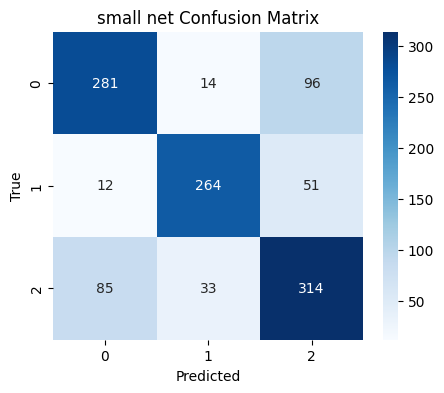

--- small net: Classification Report ---
              precision    recall  f1-score   support

           0       0.74      0.72      0.73       391
           1       0.85      0.81      0.83       327
           2       0.68      0.73      0.70       432

    accuracy                           0.75      1150
   macro avg       0.76      0.75      0.75      1150
weighted avg       0.75      0.75      0.75      1150

small  → Recall_macro: 0.751, Spec_macro: 0.870

=== Entrenando medium net ===


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_30 (InputLayer)     │ (None, 267)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_29               │ (None, 267)            │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 256)            │        68,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_100 (LeakyReLU)     │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_100         │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_100 (Dropout)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_101 (LeakyReLU)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_101         │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_101 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_102 (LeakyReLU)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_102         │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_102 (Dropout)           │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_133 (Dense)               │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 111,747 (436.51 KB)

 Trainable params: 110,851 (433.01 KB)

 Non-trainable params: 896 (3.50 KB)

Epoch 1/300
65/65 - 1s - 16ms/step - accuracy: 0.4266 - loss: 1.3536 - val_accuracy: 0.5837 - val_loss: 0.9613 - learning_rate: 0.0010
Epoch 2/300
65/65 - 0s - 3ms/step - accuracy: 0.4813 - loss: 1.1518 - val_accuracy: 0.5848 - val_loss: 0.9165 - learning_rate: 0.0010
Epoch 3/300
65/65 - 0s - 2ms/step - accuracy: 0.4806 - loss: 1.0468 - val_accuracy: 0.6098 - val_loss: 0.8586 - learning_rate: 0.0010
Epoch 4/300
65/65 - 0s - 2ms/step - accuracy: 0.4999 - loss: 0.9609 - val_accuracy: 0.6043 - val_loss: 0.8031 - learning_rate: 0.0010
Epoch 5/300
65/65 - 0s - 2ms/step - accuracy: 0.5281 - loss: 0.8817 - val_accuracy: 0.6185 - val_loss: 0.7490 - learning_rate: 0.0010
Epoch 6/300
65/65 - 0s - 2ms/step - accuracy: 0.5457 - loss: 0.8064 - val_accuracy: 0.5989 - val_loss: 0.6966 - learning_rate: 0.0010
Epoch 7/300
65/65 - 0s - 2ms/step - accuracy: 0.5582 - loss: 0.7454 - val_accuracy: 0.6174 - val_loss: 0.6447 - learning_rate: 0.0010
Epoch 8/300
65/65 - 0s - 2ms/step - accuracy: 0.5787 - loss: 

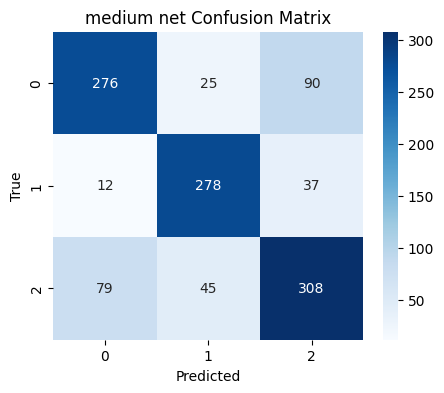

--- medium net: Classification Report ---
              precision    recall  f1-score   support

           0       0.75      0.71      0.73       391
           1       0.80      0.85      0.82       327
           2       0.71      0.71      0.71       432

    accuracy                           0.75      1150
   macro avg       0.75      0.76      0.75      1150
weighted avg       0.75      0.75      0.75      1150

medium → Recall_macro: 0.756, Spec_macro: 0.873

=== Entrenando large net ===


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_31 (InputLayer)     │ (None, 267)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_30               │ (None, 267)            │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 512)            │       137,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_103 (LeakyReLU)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_103         │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_103 (Dropout)           │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_104 (LeakyReLU)     │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_104         │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_104 (Dropout)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_105 (LeakyReLU)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_105         │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_105 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_106 (LeakyReLU)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_106         │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_106 (Dropout)           │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 313,731 (1.20 MB)

 Trainable params: 311,811 (1.19 MB)

 Non-trainable params: 1,920 (7.50 KB)

Epoch 1/300
65/65 - 1s - 20ms/step - accuracy: 0.4018 - loss: 2.3186 - val_accuracy: 0.5576 - val_loss: 1.9329 - learning_rate: 0.0010
Epoch 2/300
65/65 - 0s - 4ms/step - accuracy: 0.4659 - loss: 2.0726 - val_accuracy: 0.5620 - val_loss: 1.8005 - learning_rate: 0.0010
Epoch 3/300
65/65 - 0s - 4ms/step - accuracy: 0.4719 - loss: 1.8808 - val_accuracy: 0.5511 - val_loss: 1.6631 - learning_rate: 0.0010
Epoch 4/300
65/65 - 0s - 4ms/step - accuracy: 0.5110 - loss: 1.7095 - val_accuracy: 0.5685 - val_loss: 1.5281 - learning_rate: 0.0010
Epoch 5/300
65/65 - 0s - 4ms/step - accuracy: 0.5310 - loss: 1.5546 - val_accuracy: 0.5315 - val_loss: 1.3934 - learning_rate: 0.0010
Epoch 6/300
65/65 - 0s - 4ms/step - accuracy: 0.5483 - loss: 1.3999 - val_accuracy: 0.5674 - val_loss: 1.2605 - learning_rate: 0.0010
Epoch 7/300
65/65 - 0s - 4ms/step - accuracy: 0.5575 - loss: 1.2552 - val_accuracy: 0.5663 - val_loss: 1.1319 - learning_rate: 0.0010
Epoch 8/300
65/65 - 0s - 4ms/step - accuracy: 0.5736 - loss: 

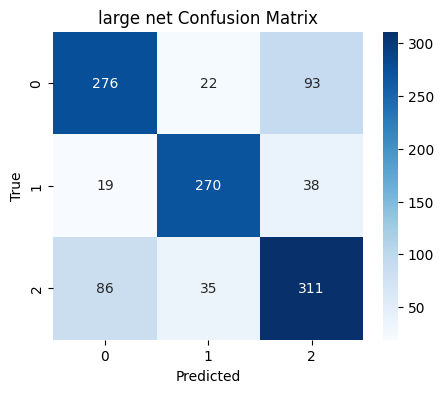

--- large net: Classification Report ---
              precision    recall  f1-score   support

           0       0.72      0.71      0.72       391
           1       0.83      0.83      0.83       327
           2       0.70      0.72      0.71       432

    accuracy                           0.75      1150
   macro avg       0.75      0.75      0.75      1150
weighted avg       0.75      0.75      0.75      1150

large  → Recall_macro: 0.750, Spec_macro: 0.870

=== Entrenando xlarge net ===


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_32 (InputLayer)     │ (None, 267)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_31               │ (None, 267)            │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 512)            │       137,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_107 (LeakyReLU)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_107         │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_107 (Dropout)           │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_140 (Dense)               │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_108 (LeakyReLU)     │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_108         │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_108 (Dropout)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_109 (LeakyReLU)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_109         │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_109 (Dropout)           │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 288,515 (1.10 MB)

 Trainable params: 286,851 (1.09 MB)

 Non-trainable params: 1,664 (6.50 KB)

Epoch 1/300
65/65 - 1s - 18ms/step - accuracy: 0.4367 - loss: 2.0899 - val_accuracy: 0.5620 - val_loss: 1.6919 - learning_rate: 0.0010
Epoch 2/300
65/65 - 0s - 4ms/step - accuracy: 0.4924 - loss: 1.8331 - val_accuracy: 0.6022 - val_loss: 1.5584 - learning_rate: 0.0010
Epoch 3/300
65/65 - 0s - 4ms/step - accuracy: 0.5237 - loss: 1.6627 - val_accuracy: 0.6022 - val_loss: 1.4355 - learning_rate: 0.0010
Epoch 4/300
65/65 - 0s - 4ms/step - accuracy: 0.5351 - loss: 1.4945 - val_accuracy: 0.5826 - val_loss: 1.3196 - learning_rate: 0.0010
Epoch 5/300
65/65 - 0s - 4ms/step - accuracy: 0.5512 - loss: 1.3531 - val_accuracy: 0.6098 - val_loss: 1.1886 - learning_rate: 0.0010
Epoch 6/300
65/65 - 0s - 3ms/step - accuracy: 0.5835 - loss: 1.2112 - val_accuracy: 0.5967 - val_loss: 1.0734 - learning_rate: 0.0010
Epoch 7/300
65/65 - 0s - 3ms/step - accuracy: 0.5915 - loss: 1.0819 - val_accuracy: 0.6196 - val_loss: 0.9609 - learning_rate: 0.0010
Epoch 8/300
65/65 - 0s - 4ms/step - accuracy: 0.6103 - loss: 

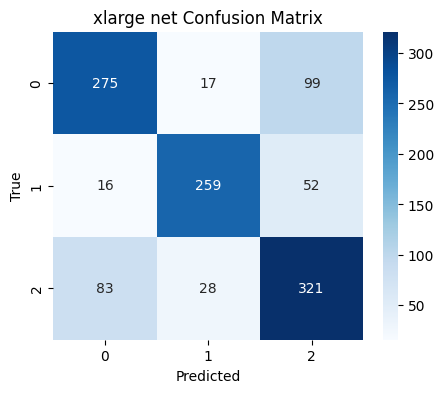

--- xlarge net: Classification Report ---
              precision    recall  f1-score   support

           0       0.74      0.70      0.72       391
           1       0.85      0.79      0.82       327
           2       0.68      0.74      0.71       432

    accuracy                           0.74      1150
   macro avg       0.76      0.75      0.75      1150
weighted avg       0.75      0.74      0.74      1150

xlarge → Recall_macro: 0.746, Spec_macro: 0.868

=== Entrenando xxlarge net ===


/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_33 (InputLayer)     │ (None, 267)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_noise_32               │ (None, 267)            │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 1024)           │       274,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_110 (LeakyReLU)     │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_110         │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_110 (Dropout)           │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_111 (LeakyReLU)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_111         │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_111 (Dropout)           │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_112 (LeakyReLU)     │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_112         │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_112 (Dropout)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_113 (LeakyReLU)     │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_113         │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_113 (Dropout)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_147 (Dense)               │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_114 (LeakyReLU)     │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_114         │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_114 (Dropout)           │ (None, 64)             │             

 Total params: 979,843 (3.74 MB)

 Trainable params: 975,875 (3.72 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/300
65/65 - 2s - 27ms/step - accuracy: 0.4206 - loss: 4.3604 - val_accuracy: 0.5576 - val_loss: 3.8912 - learning_rate: 0.0010
Epoch 2/300
65/65 - 0s - 7ms/step - accuracy: 0.4746 - loss: 3.9528 - val_accuracy: 0.5641 - val_loss: 3.5817 - learning_rate: 0.0010
Epoch 3/300
65/65 - 0s - 7ms/step - accuracy: 0.4912 - loss: 3.5776 - val_accuracy: 0.6065 - val_loss: 3.2524 - learning_rate: 0.0010
Epoch 4/300
65/65 - 0s - 8ms/step - accuracy: 0.5235 - loss: 3.2110 - val_accuracy: 0.6228 - val_loss: 2.9245 - learning_rate: 0.0010
Epoch 5/300
65/65 - 1s - 8ms/step - accuracy: 0.5341 - loss: 2.8657 - val_accuracy: 0.6130 - val_loss: 2.6037 - learning_rate: 0.0010
Epoch 6/300
65/65 - 1s - 8ms/step - accuracy: 0.5683 - loss: 2.5219 - val_accuracy: 0.6185 - val_loss: 2.2970 - learning_rate: 0.0010
Epoch 7/300
65/65 - 1s - 8ms/step - accuracy: 0.5739 - loss: 2.2202 - val_accuracy: 0.5946 - val_loss: 2.0178 - learning_rate: 0.0010
Epoch 8/300
65/65 - 1s - 8ms/step - accuracy: 0.5852 - loss: 

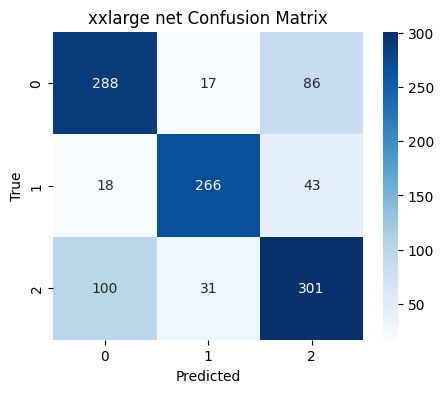

--- xxlarge net: Classification Report ---
              precision    recall  f1-score   support

           0       0.71      0.74      0.72       391
           1       0.85      0.81      0.83       327
           2       0.70      0.70      0.70       432

    accuracy                           0.74      1150
   macro avg       0.75      0.75      0.75      1150
weighted avg       0.75      0.74      0.74      1150

xxlarge → Recall_macro: 0.749, Spec_macro: 0.869


In [ ]:
architectures = {
    'small':  [128,  64],
    'medium': [256, 128, 64],
    'large':  [512, 256, 64],
    'xlarge':  [512, 256, 128, 64],
    'xxlarge':  [1024, 512, 256, 128, 64]
}

histories = {}
results    = {}

for name, units in architectures.items():
    print(f"\n=== Entrenando {name} net ===")
    model = build_model(
        units,
        input_dim=X_tr_res.shape[1],
        dropout_rate=0.5,
        l2_reg=1e-3,
        lr=1e-3
    )
    model.summary()

    es = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
    rl = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=8, min_lr=1e-6)
    ck = ModelCheckpoint(f'best_{name}.keras', monitor='val_loss', save_best_only=True)

    hist = model.fit(
        X_tr_res, y_tr_res,
        validation_data=(X_val, y_val),
        epochs=300,
        batch_size=64,
        class_weight=class_weight,
        callbacks=[es, rl, ck],
        verbose=2
    )
    histories[name] = hist

    # Evaluación en TEST
    model.load_weights(f'best_{name}.keras')
    y_pred = np.argmax(model.predict(X_test), axis=1)

    # Matriz de confusión y heatmap
    cm = confusion_matrix(y_test, y_pred)
    print(f"\n--- {name} net: Matriz de Confusión ---")
    print(cm)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.title(f'{name} net Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    # Informe de clasificación
    print(f"--- {name} net: Classification Report ---")
    print(classification_report(y_test, y_pred, target_names=[str(c) for c in classes]))

    # Cálculo de recall_macro y spec_macro (como ya lo tenías)
    rep       = classification_report(y_test, y_pred, output_dict=True)
    rec_macro = rep['macro avg']['recall']
    specs = []
    for i, c in enumerate(classes):
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        tn = cm.sum() - (tp + fp + (cm[i, :].sum() - tp))
        specs.append(tn / (tn + fp) if (tn + fp) > 0 else 0)
    spec_macro = np.mean(specs)
    results[name] = (rec_macro, spec_macro)

    print(f"{name:6s} → Recall_macro: {rec_macro:.3f}, Spec_macro: {spec_macro:.3f}")

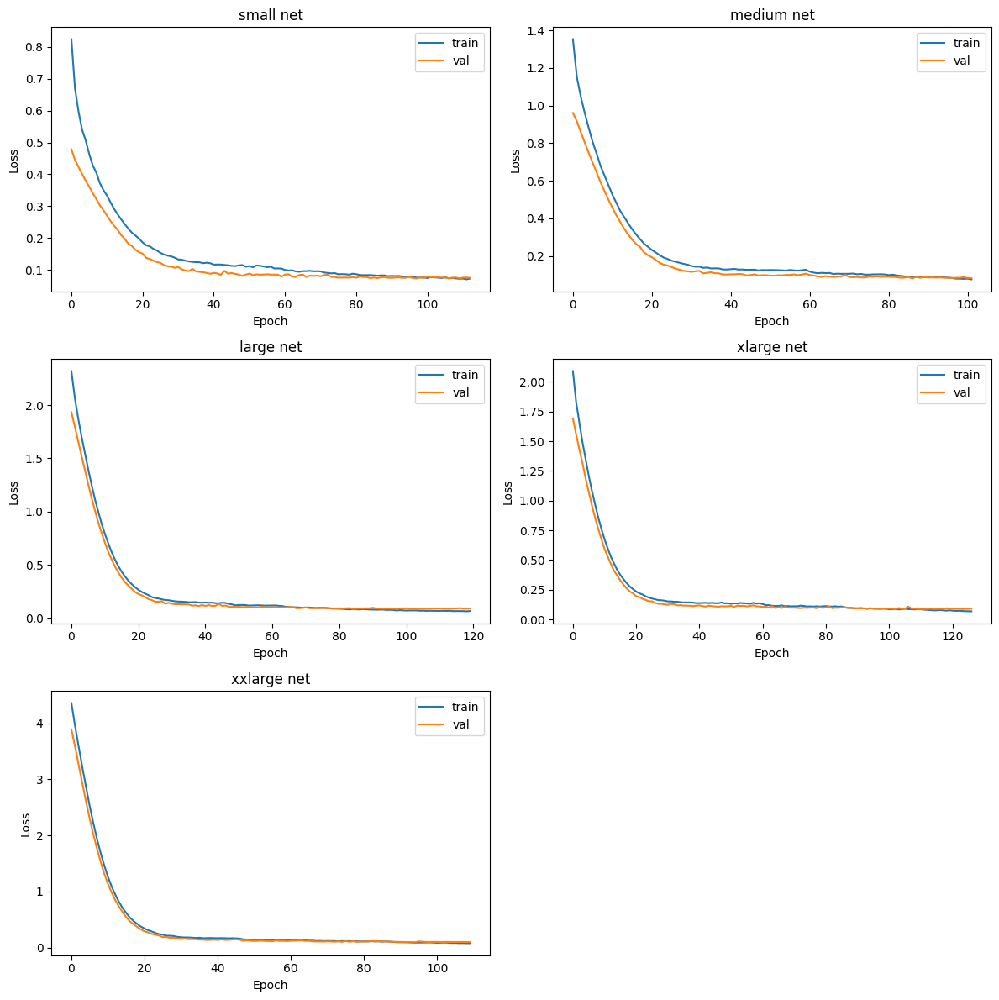

In [87]:
import matplotlib.pyplot as plt
import math

n = len(histories)
cols = 2
rows = math.ceil(n/cols)
fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 4*rows))
axes = axes.flatten()

for ax, (name, hist) in zip(axes, histories.items()):
    ax.plot(hist.history['loss'],  label='train')
    ax.plot(hist.history['val_loss'],label='val')
    ax.set_title(f'{name} net')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()

# si hay ejes extra sin datos, los quitamos
for ax in axes[n:]:
    fig.delaxes(ax)

plt.tight_layout()
plt.show()

In [88]:
print("\n=== Resultados en Test ===")
for name, (rec, spec) in results.items():
    print(f"{name:6s} → Recall_macro: {rec:.3f}, Spec_macro: {spec:.3f}")


=== Resultados en Test ===
small  → Recall_macro: 0.751, Spec_macro: 0.870
medium → Recall_macro: 0.756, Spec_macro: 0.873
large  → Recall_macro: 0.750, Spec_macro: 0.870
xlarge → Recall_macro: 0.746, Spec_macro: 0.868
xxlarge → Recall_macro: 0.749, Spec_macro: 0.869


## **RESULTADOS GLOBALES**

In [108]:
results = {
    'Regresión Logística':  (0.802,  0.894),
    'Regresión Logística + FS + SMOTE': (0.811, 0.898),
    'K-NN':  (0.580,  0.788),
    'K-NN + FS + SMOTE': (0.696, 0.841),
    'Random Forest': (0.824, 0.905),
    'Random Forest + SMOTE': (0.825, 0.906),
    'SVM': (0.809, 0.897),
    'SVM + SMOTE + FS': (0.826, 0.906),
    'XGBoost': (0.843, 0.916),
    'XGBoost + SMOTE': (0.823, 0.904),
    'Gradient Boosting': (0.845, 0.917),
    'Gradient Boosting + SMOTE': (0.839, 0.913),
    'Small Net': (0.751, 0.870),
    'Medium Net': (0.756, 0.873),
    'Large Net': (0.750, 0.870),
    'X-Large Net': (0.746, 0.868),
    'XX-Large Net': (0.749, 0.869),
    'Paper': (0.76, 0.87)
}
# Convertimos el dict a DataFrame
df_results = pd.DataFrame.from_dict(
    results,
    orient='index',
    columns=['Sensibilidad', 'Especificidad']
)

In [109]:
# Añadimos métricas adicionales
accuracy = {    
    'Regresión Logística':  0.79,
    'Regresión Logística + FS + SMOTE': 0.80,
    'K-NN':  0.59,
    'K-NN + FS + SMOTE': 0.69,
    'Random Forest': 0.82,
    'Random Forest + SMOTE': 0.82,
    'SVM': 0.80,
    'SVM + SMOTE + FS': 0.82,
    'XGBoost': 0.84,
    'XGBoost + SMOTE': 0.81,
    'Gradient Boosting': 0.84,
    'Gradient Boosting + SMOTE': 0.83,
    'Small Net': 0.75,
    'Medium Net': 0.75,
    'Large Net': 0.75,
    'X-Large Net': 0.74,
    'XX-Large Net': 0.74}

df_results['Accuracy'] = pd.Series(accuracy)

In [110]:
df_results

,Sensibilidad,Especificidad,Accuracy
Regresión Logística,0.802,0.894,0.79
Regresión Logística + FS + SMOTE,0.811,0.898,0.80
K-NN,0.580,0.788,0.59
K-NN + FS + SMOTE,0.696,0.841,0.69
Random Forest,0.824,0.905,0.82
Random Forest + SMOTE,0.825,0.906,0.82
SVM,0.809,0.897,0.80
SVM + SMOTE + FS,0.826,0.906,0.82
XGBoost,0.843,0.916,0.84
XGBoost + SMOTE,0.823,0.904,0.81


In [111]:
# Ordenamos por recall (Sensibilidad)
df_results.sort_values(by=['Sensibilidad', 'Especificidad'], ascending=False)

,Sensibilidad,Especificidad,Accuracy
Gradient Boosting,0.845,0.917,0.84
XGBoost,0.843,0.916,0.84
Gradient Boosting + SMOTE,0.839,0.913,0.83
SVM + SMOTE + FS,0.826,0.906,0.82
Random Forest + SMOTE,0.825,0.906,0.82
Random Forest,0.824,0.905,0.82
XGBoost + SMOTE,0.823,0.904,0.81
Regresión Logística + FS + SMOTE,0.811,0.898,0.80
SVM,0.809,0.897,0.80
Regresión Logística,0.802,0.894,0.79


In [99]:
df_results.to_csv('tabla_resultados_modelos.csv', index=True)

## **EXPERIMENTACIÓN - HACER CON LA NUEVA RED SI LAURA DA EL OK**

##### Carga de datos y preprocesamiento

Creamos un diccionario con los dataframes EEG de los dos usuarios. 

In [1]:
import os
import pandas as pd

# Directorio raíz donde están las carpetas de resultado
root_dir = '/Users/danillopis/Desktop/TFG/Experimento/output'

# Mapeo participante → grabación
recordings = {
    'Daniel': 'RecordingS01R000',
    'Paula':  'RecordingS03R002'
}

# Diccionario donde guardaremos los DataFrames
eeg_data = {}

for subj, rec in recordings.items():
    csv_path = os.path.join(
        root_dir,
        f'TFG_Llopis_participante_{subj}',
        rec,
        'eeg_infor_eeg.csv'
    )
    if not os.path.isfile(csv_path):
        raise FileNotFoundError(f"No se encontró {csv_path}")
    eeg_data[subj] = pd.read_csv(csv_path)
    print(f"Cargado {subj} ({rec}): {eeg_data[subj].shape[0]} filas × {eeg_data[subj].shape[1]} columnas")

print(eeg_data['Daniel'].head())

Cargado Daniel (RecordingS01R000): 155216 filas × 35 columnas
Cargado Paula (RecordingS03R002): 161504 filas × 35 columnas
        ch1-AF3      ch2-AF4       ch3-F7       ch4-F8       ch5-F3  \
0  11043.644990  1843.442572 -1790.683438  8791.465147  4007.528290   
1  11074.392760  1870.442691 -1764.547226  8833.334192  4039.322482   
2  11090.149928  1889.971844 -1752.878404  8835.244520  4007.941992   
3  11100.054433  1898.683915 -1757.818489  8847.095857  4034.662254   
4  11089.249518  1897.625326 -1753.292106  8845.197696  4059.228834   

        ch6-F4       ch7-FC5       ch8-FC6        ch9-T7       ch10-T8  ...  \
0  6386.191342  27474.318731  17172.854576  21466.749611  24373.308189  ...   
1  6423.546171  27547.714278  17242.794497  21561.535969  24479.556518  ...   
2  6398.553722  27545.110391  17191.130456  21503.885421  24481.990057  ...   
3  6428.303741  27527.698417  17204.259401  21513.035529  24461.365811  ...   
4  6434.898633  27538.807524  17217.838551  21511.62407

In [2]:
for subj, df in eeg_data.items():
    print(f"\nColumnas en {subj}:")
    for col in df.columns:
        print(f"  - {col}")


Columnas en Daniel:
  - ch1-AF3
  - ch2-AF4
  - ch3-F7
  - ch4-F8
  - ch5-F3
  - ch6-F4
  - ch7-FC5
  - ch8-FC6
  - ch9-T7
  - ch10-T8
  - ch11-P7
  - ch12-P8
  - ch13-O1
  - ch14-O2
  - ch15-Fp1
  - ch16-Fpz
  - ch17-Fp2
  - ch18-Fz
  - ch19-FC1
  - ch20-FC2
  - ch21-C3
  - ch22-Cz
  - ch23-C4
  - ch24-CP5
  - ch25-CP1
  - ch26-CP2
  - ch27-CP6
  - ch28-P3
  - ch29-Pz
  - ch30-P4
  - ch31-POz
  - ch32-Oz
  - sequenceNumber
  - timestampReception
  - timestamp

Columnas en Paula:
  - ch1-AF3
  - ch2-AF4
  - ch3-F7
  - ch4-F8
  - ch5-F3
  - ch6-F4
  - ch7-FC5
  - ch8-FC6
  - ch9-T7
  - ch10-T8
  - ch11-P7
  - ch12-P8
  - ch13-O1
  - ch14-O2
  - ch15-Fp1
  - ch16-Fpz
  - ch17-Fp2
  - ch18-Fz
  - ch19-FC1
  - ch20-FC2
  - ch21-C3
  - ch22-Cz
  - ch23-C4
  - ch24-CP5
  - ch25-CP1
  - ch26-CP2
  - ch27-CP6
  - ch28-P3
  - ch29-Pz
  - ch30-P4
  - ch31-POz
  - ch32-Oz
  - sequenceNumber
  - timestampReception
  - timestamp


In [3]:
import re

def preprocess_eeg(df):
    """
    - Elimina las columnas ch15-... hasta ch32-
    - Renombra las columnas chX-CANAL a solo CANAL
    """
    # Drop columns with prefix ch15- up to ch32-
    drop_cols = [
        col for col in df.columns
        if (m := re.match(r'ch(\d+)-', col)) and 15 <= int(m.group(1)) <= 32
    ]
    df = df.drop(columns=drop_cols)

    # Build rename mapping for remaining chX- prefixes
    rename_map = {}
    for col in df.columns:
        if (m := re.match(r'ch\d+-(.+)', col)):
            rename_map[col] = m.group(1)

    # Apply renaming
    df = df.rename(columns=rename_map)
    return df

# Aplicar a ambos DataFrames en eeg_data:
for subj, df in eeg_data.items():
    eeg_data[subj] = preprocess_eeg(df)
    print(f"\nColumnas finales en {subj}:")
    print(eeg_data[subj].columns.tolist())


Columnas finales en Daniel:
['AF3', 'AF4', 'F7', 'F8', 'F3', 'F4', 'FC5', 'FC6', 'T7', 'T8', 'P7', 'P8', 'O1', 'O2', 'sequenceNumber', 'timestampReception', 'timestamp']

Columnas finales en Paula:
['AF3', 'AF4', 'F7', 'F8', 'F3', 'F4', 'FC5', 'FC6', 'T7', 'T8', 'P7', 'P8', 'O1', 'O2', 'sequenceNumber', 'timestampReception', 'timestamp']


In [4]:
import pandas as pd

# Lista de los 14 canales esperados tras renombrar
expected_channels = [
    'AF3','F7','F3','FC5','T7','P7','O1',
    'O2','P8','T8','FC6','F4','F8','AF4'
]
# Factor de conversión de timestamp a segundos:
#   como timestamp está en microsegundos → 1e6
time_factor = 1e6
# Duración esperada en segundos (10 min = 600 s)
duration_expected = 10 * 60
tolerance_sec = 1.0

for subj, df in eeg_data.items():
    print(f"\n——— Comprobaciones para {subj} ——")

    # Sin valores nulos en los canales esperados
    nulls = df[expected_channels].isnull().sum()
    if nulls.any():
        print("Valores nulos en canales:")
        print(nulls[nulls > 0])
    else:
        print("No hay valores nulos en los 14 canales.")

    # Duración ≃ 10 minutos
    # Convertimos timestamp a enteros para preservar resolución
    ts = df['timestamp'].astype('int64')
    # Calculamos tiempo relativo en segundos
    rel_s = (ts - ts.iloc[0]) / time_factor
    duration = rel_s.iloc[-1]
    print(f"— Duración registrada: {duration:.2f} s")
    if abs(duration - duration_expected) <= tolerance_sec:
        print("La grabación dura aproximadamente 10 minutos.")
    else:
        print(f"Duración fuera de rango (esperado {duration_expected}s ±{tolerance_sec}s).")

    # Todos los canales presentes
    present = set(df.columns) & set(expected_channels)
    missing = set(expected_channels) - set(df.columns)
    if missing:
        print(f"Faltan {len(missing)} canales: {sorted(missing)}")
    else:
        print("Todos los 14 canales están presentes.")


——— Comprobaciones para Daniel ——
No hay valores nulos en los 14 canales.
— Duración registrada: 606.34 s
Duración fuera de rango (esperado 600s ±1.0s).
Todos los 14 canales están presentes.

——— Comprobaciones para Paula ——
No hay valores nulos en los 14 canales.
— Duración registrada: 630.87 s
Duración fuera de rango (esperado 600s ±1.0s).
Todos los 14 canales están presentes.


In [5]:
# Parámetros
time_factor     = 1e6      # igual que antes: divide timestamp para pasar a segundos
duration_target = 10 * 60  # 600 s
tolerance_sec   = 1.0

def trim_to_duration(df, time_col='timestamp'):
    ts = df[time_col].astype('int64')
    rel_s = (ts - ts.iloc[0]) / time_factor
    return df.loc[rel_s <= duration_target].copy()

def check_duration(df, time_col='timestamp'):
    ts = df[time_col].astype('int64')
    rel_s = (ts - ts.iloc[0]) / time_factor
    return rel_s.iloc[-1]

# Aplica recorte y comprueba
trimmed_data = {}
for subj, df in eeg_data.items():
    # Trim a 600s
    df_trim = trim_to_duration(df)
    trimmed_data[subj] = df_trim

    # Duración tras recorte
    dur = check_duration(df_trim)
    print(f"{subj}: tras recorte → {dur:.2f}s",
          "ok" if abs(dur - duration_target) <= tolerance_sec else "no ok")

Daniel: tras recorte → 600.00s ok
Paula: tras recorte → 600.00s ok


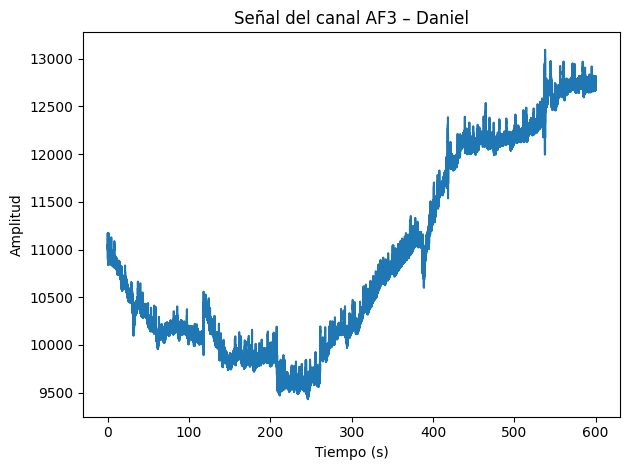

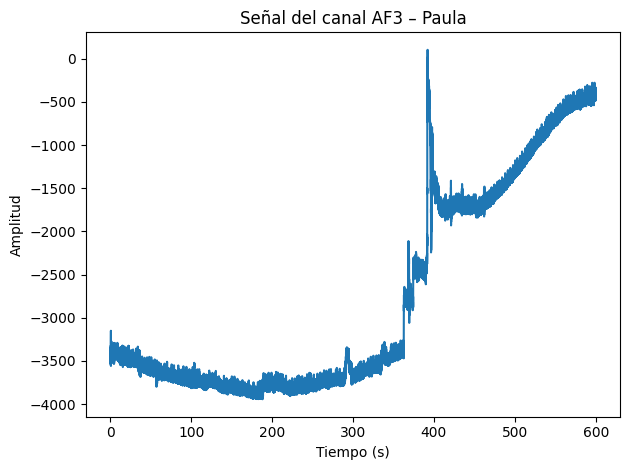

In [11]:
time_factor = 1e6
channel = 'AF3'

for subj, df in trimmed_data.items():
    # Convertir timestamp a int y calcular tiempo relativo en segundos
    ts = df['timestamp'].astype('int64')
    rel_time = (ts - ts.iloc[0]) / time_factor

    plt.figure()
    plt.plot(rel_time, df[channel])
    plt.title(f'Señal del canal {channel} – {subj}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.tight_layout()
    plt.show()

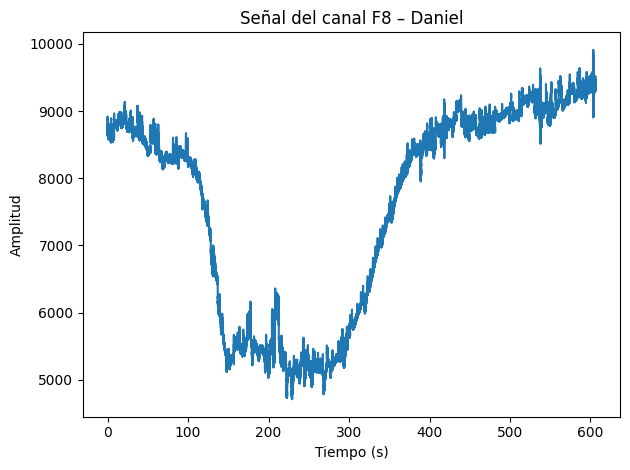

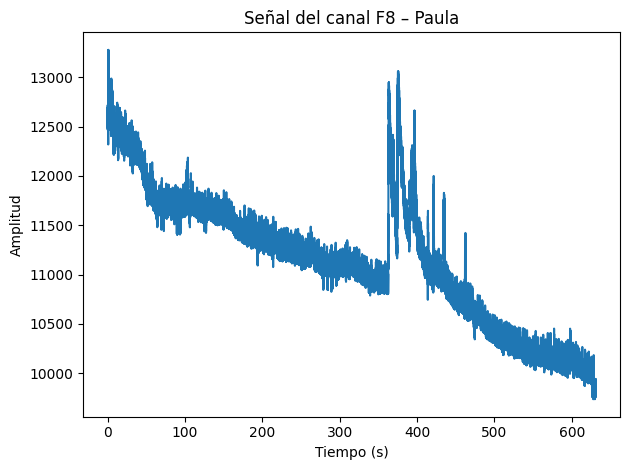

In [12]:
time_factor = 1e6
channel = 'F8'

for subj, df in eeg_data.items():
    # Convertir timestamp a int y calcular tiempo relativo en segundos
    ts = df['timestamp'].astype('int64')
    rel_time = (ts - ts.iloc[0]) / time_factor

    plt.figure()
    plt.plot(rel_time, df[channel])
    plt.title(f'Señal del canal {channel} – {subj}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.tight_layout()
    plt.show()

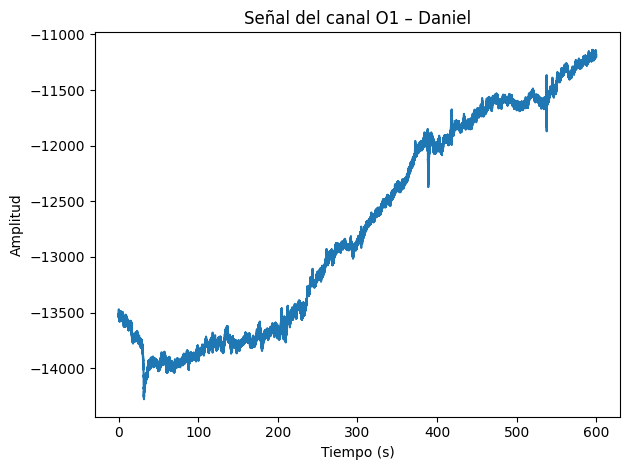

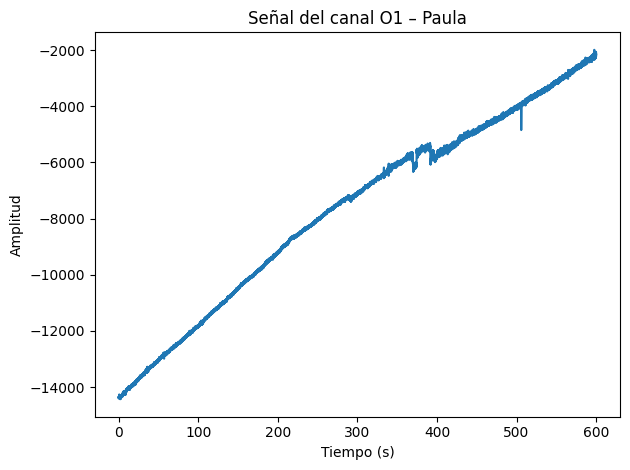

In [13]:
time_factor = 1e6
channel = 'O1'

for subj, df in trimmed_data.items():
    # Convertir timestamp a int y calcular tiempo relativo en segundos
    ts = df['timestamp'].astype('int64')
    rel_time = (ts - ts.iloc[0]) / time_factor

    plt.figure()
    plt.plot(rel_time, df[channel])
    plt.title(f'Señal del canal {channel} – {subj}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.tight_layout()
    plt.show()

In [8]:
# Suponiendo que 'trimmed_data' es tu dict con los DataFrames de Daniel y Paula
cols_to_drop = ['sequenceNumber', 'timestampReception']

for subj, df in trimmed_data.items():
    # Eliminamos las columnas si existen
    existing = [c for c in cols_to_drop if c in df.columns]
    if existing:
        trimmed_data[subj] = df.drop(columns=existing)
        print(f"{subj}: eliminadas columnas {existing}")
    else:
        print(f"{subj}: no se encontraron {cols_to_drop} (ya eliminadas o no existían)")

# Ahora trimmed_data['Daniel'] y trimmed_data['Paula'] ya no tienen esas dos columnas.

Daniel: eliminadas columnas ['sequenceNumber', 'timestampReception']
Paula: eliminadas columnas ['sequenceNumber', 'timestampReception']


Creating RawArray with float64 data, n_channels=14, n_times=153593
    Range : 0 ... 153592 =      0.000 ...   599.969 secs
Ready.


Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1691 samples (6.605 s)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 63 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 63.00 Hz
- Upper transition bandwidth: 15.75 Hz (-6 dB cutoff frequency: 70.88 Hz)
- Filter length: 55 samples (0.215 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.1s finished


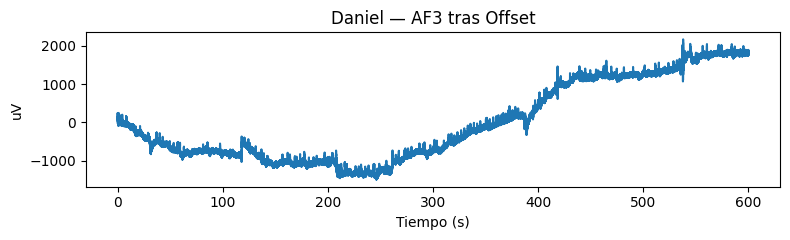

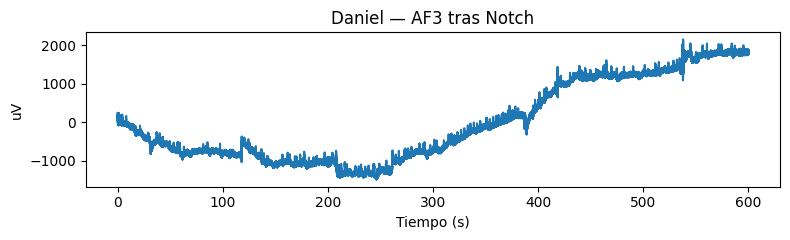

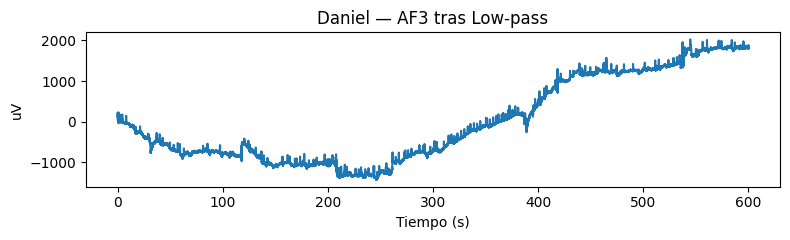

Creating RawArray with float64 data, n_channels=14, n_times=153601
    Range : 0 ... 153600 =      0.000 ...   600.000 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1691 samples (6.605 s)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 63 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 63.00 Hz
- Upper transition bandwidth: 15.75 Hz (-6 dB cutoff frequency: 70.88 Hz)
- Filter length: 55 samples (0.215 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.1s finished


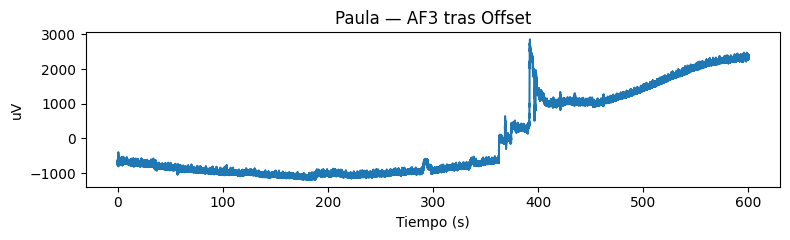

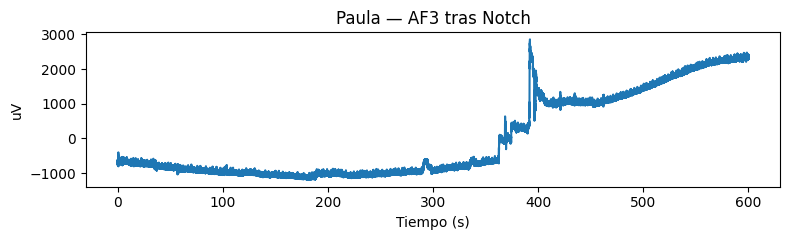

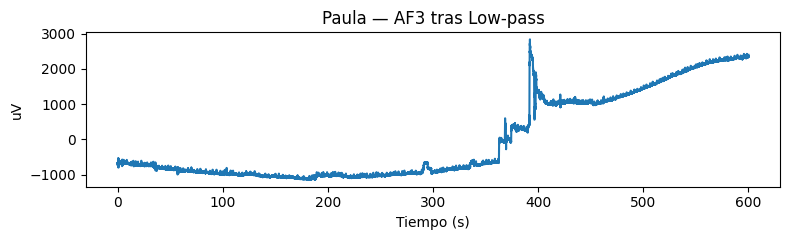

In [39]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Parámetros
sfreq       = 256          # Hz de muestreo
channel     = 'AF3'
steps       = ['Offset', 'Notch', 'Low-pass']

# Diccionario para guardar los raws de cada paso y sujeto
processed = {subj: {} for subj in trimmed_data.keys()}

for subj, df in trimmed_data.items():
    df_clean=df
    # Crear RawArray a partir del DataFrame
    ch_names = [c for c in df_clean.columns if c != 'timestamp']
    data     = df_clean[ch_names].T.values.astype(np.float64)
    info     = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types='eeg')
    raw      = mne.io.RawArray(data, info)

    # Offset removal
    raw_offset = raw.copy().apply_function(lambda x: x - np.mean(x), picks='eeg')
    processed[subj]['Offset'] = raw_offset

    # Notch filter 50 & 60 Hz
    raw_notch = raw_offset.copy().notch_filter(freqs=[50, 60], picks='eeg')
    processed[subj]['Notch'] = raw_notch

    # Low-pass filter @ 64 Hz
    raw_lp = raw_notch.copy().filter(l_freq=None, h_freq=63, picks='eeg')
    processed[subj]['Low-pass'] = raw_lp

    # Gráficas canal AF3 tras cada paso
    times = raw.times  # vector de tiempo en segundos
    for step in steps:
        r = processed[subj][step]
        sig = r.get_data(picks=[channel])[0]
        plt.figure(figsize=(8, 2.5))
        plt.plot(times, sig)
        plt.title(f"{subj} — AF3 tras {step}")
        plt.xlabel('Tiempo (s)')
        plt.ylabel('uV')
        plt.tight_layout()
        plt.show()

Fitting ICA to data using 14 channels (please be patient, this may take a while)


Selecting by number: 14 components


/var/folders/ly/phg61q055118ytxc75c_b9cw0000gn/T/ipykernel_1905/2753615729.py:22: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw_lp)


Fitting ICA took 1.8s.

Daniel — curtosis por IC:
  IC00: 5.58
  IC01: 5.24
  IC02: 4.28
  IC03: 22.26
  IC04: 6.05
  IC05: 5.25
  IC06: 4.79
  IC07: 8.19
  IC08: 10.96
  IC09: 5.11
  IC10: 41.56
  IC11: 10.87
  IC12: 43.89
  IC13: 3.72
Componentes excluidas (|kurtosis| > 40.0): [10, 12]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


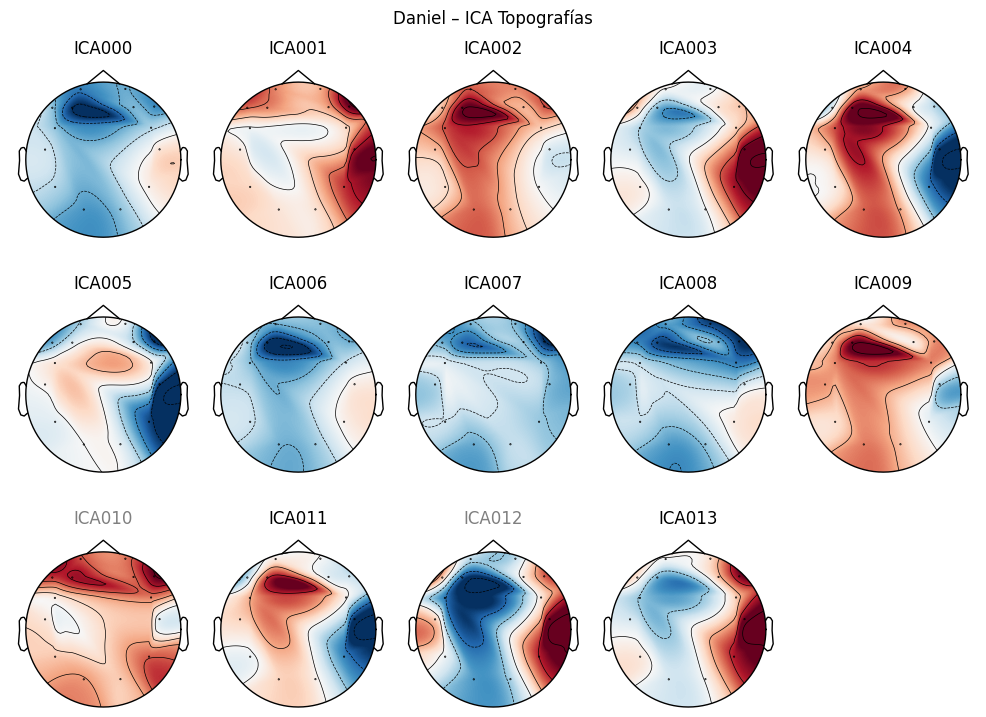

Creating RawArray with float64 data, n_channels=14, n_times=153593
    Range : 0 ... 153592 =      0.000 ...   599.969 secs
Ready.


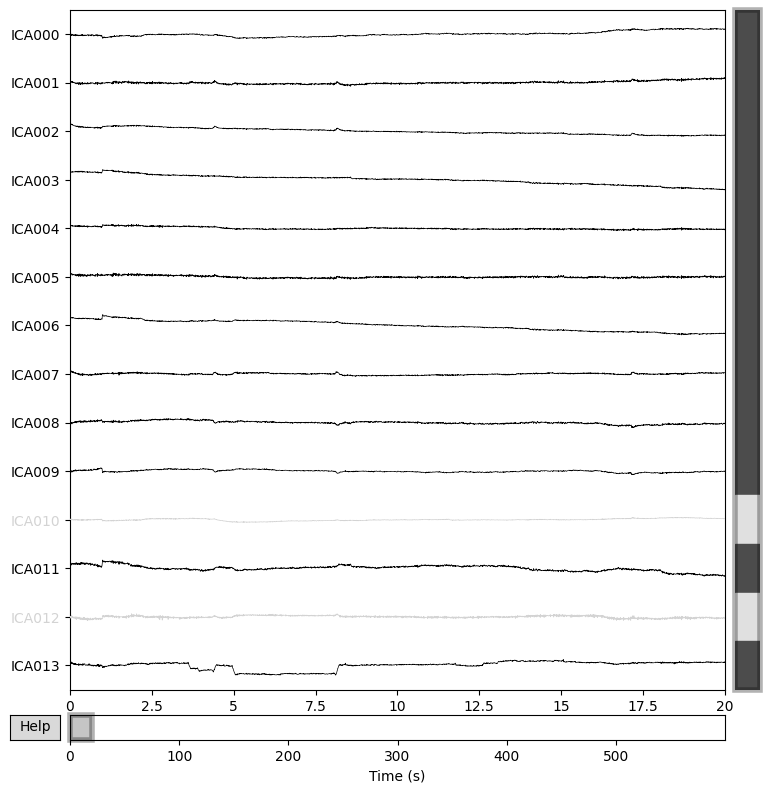

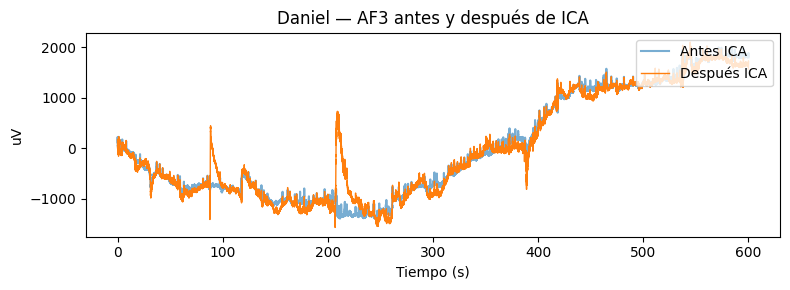

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components


/var/folders/ly/phg61q055118ytxc75c_b9cw0000gn/T/ipykernel_1905/2753615729.py:22: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw_lp)


Fitting ICA took 1.4s.

Paula — curtosis por IC:
  IC00: 9.73
  IC01: 7.07
  IC02: 5.53
  IC03: 4.89
  IC04: 11.27
  IC05: 135.03
  IC06: 6.84
  IC07: 4.07
  IC08: 5.10
  IC09: 10.60
  IC10: 30.10
  IC11: 26.43
  IC12: 157.28
  IC13: 79.65
Componentes excluidas (|kurtosis| > 40.0): [5, 12, 13]
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 14 PCA components


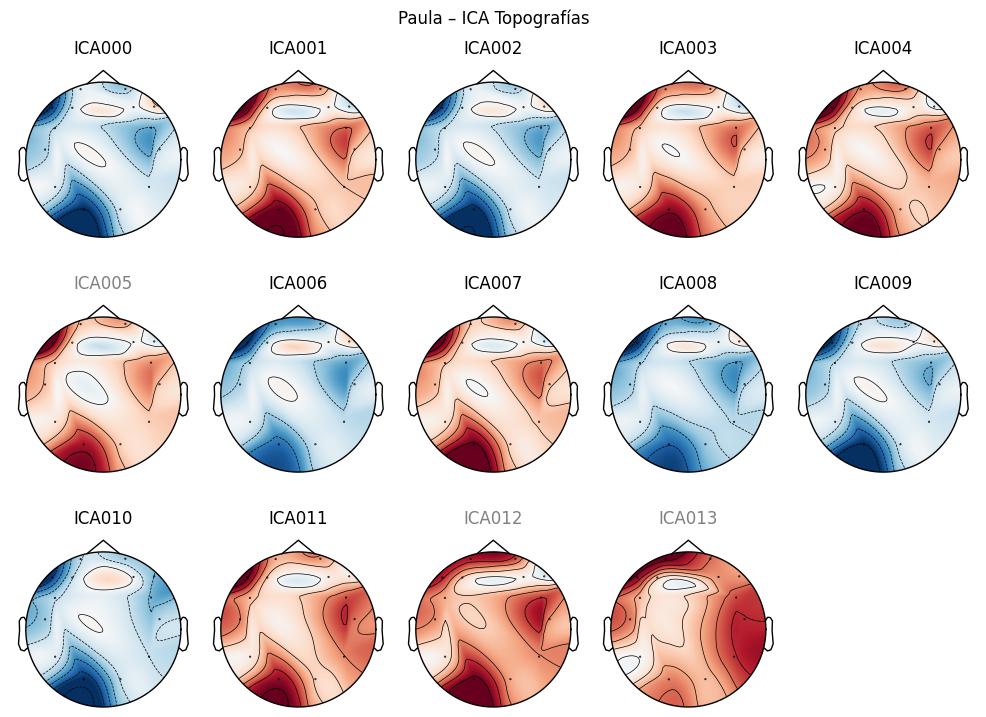

Creating RawArray with float64 data, n_channels=14, n_times=153601
    Range : 0 ... 153600 =      0.000 ...   600.000 secs
Ready.


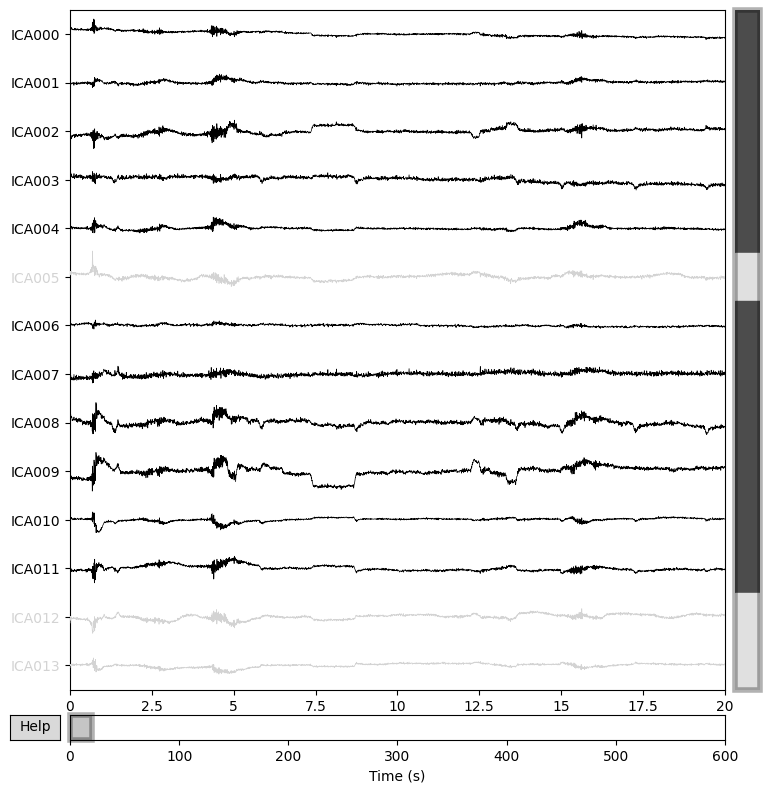

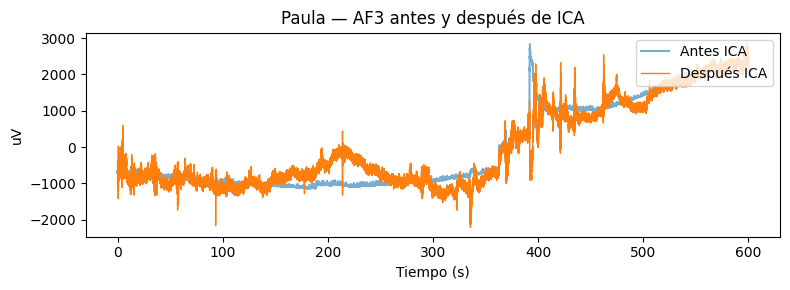

In [40]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import kurtosis

# Parámetros
channels         = processed[next(iter(processed))]['Low-pass'].ch_names
kurtosis_thresh  = 40.0   # umbral absolute kurtosis
ica_cleaned = {}

for subj, stages in processed.items():
    raw_lp = stages['Low-pass'].copy()

    # Montaje estándar para topografías ICA
    montage = mne.channels.make_standard_montage('standard_1020')
    raw_lp.set_montage(montage)

    # Ajustar ICA
    ica = mne.preprocessing.ICA(n_components=len(channels),
                                random_state=97,
                                method='fastica')
    ica.fit(raw_lp)

    # Calcular curtosis de cada componente
    sources = ica.get_sources(raw_lp).get_data()  # shape (n_ICs, n_times)
    kurt    = kurtosis(sources, axis=1, fisher=False)
    print(f"\n{subj} — curtosis por IC:")
    for idx, k in enumerate(kurt):
        print(f"  IC{idx:02d}: {k:.2f}")

    # Excluir ICs con curtosis ≫ umbral
    artifacts = [i for i, k in enumerate(kurt) if abs(k) > kurtosis_thresh]
    print(f"Componentes excluidas (|kurtosis| > {kurtosis_thresh}): {artifacts}")
    ica.exclude = artifacts

    # Reconstruir señal limpia
    raw_clean = raw_lp.copy()
    ica.apply(raw_clean)
    # Guardamos el RawArray limpio
    ica_cleaned[subj] = raw_clean

    figs = ica.plot_components(
        picks=None,
        title=f"{subj} – ICA Topografías",
        show=True
    )
    # Y un plt.show() para asegurarnos de que el backend las saque
    plt.show()

    # --- Plot de fuentes ICA ---
    fig_src = ica.plot_sources(
        raw_lp,
        title=f"{subj} – ICA Fuentes",
        show=True
    )
    plt.show()

    # Comparar canal AF3 antes y después
    times     = raw_lp.times
    af3_orig  = raw_lp.get_data(picks=['AF3'])[0]
    af3_clean = raw_clean.get_data(picks=['AF3'])[0]

    plt.figure(figsize=(8, 3))
    plt.plot(times, af3_orig,  label='Antes ICA',  alpha=0.6)
    plt.plot(times, af3_clean, label='Después ICA', linewidth=1)
    plt.title(f"{subj} — AF3 antes y después de ICA")
    plt.xlabel('Tiempo (s)')
    plt.ylabel('uV')
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

In [41]:
# Convertir los raws preprocesados a DataFrames
processed_dfs = {}
for subj, steps in processed.items():
    processed_dfs[subj] = {}
    for step, raw in steps.items():
        # to_data_frame() devuelve un DF con índice 'time' (segundos) y columnas de canales
        df = raw.to_data_frame().reset_index().rename(columns={'time': 'time_s'})
        processed_dfs[subj][step] = df

# Ahora processed_dfs['Daniel']['Notch'] es un DataFrame con todas las columnas de canales
# y una columna 'time_s' con el tiempo en segundos.

# Convertir las señales limpias tras ICA a DataFrames
ica_cleaned_dfs = {}
for subj, raw_clean in ica_cleaned.items():
    df_clean = raw_clean.to_data_frame().reset_index().rename(columns={'time': 'time_s'})
    ica_cleaned_dfs[subj] = df_clean

In [42]:
processed_dfs.values()

dict_values([{'Offset':          index      time_s           AF3           AF4            F7  \
0            0    0.000000  1.187054e+08 -5.326966e+07  9.994386e+08   
1            1    0.003906  1.494532e+08 -2.626954e+07  1.025575e+09   
2            2    0.007812  1.652104e+08 -6.740391e+06  1.037244e+09   
3            3    0.011719  1.751149e+08  1.971680e+06  1.032304e+09   
4            4    0.015625  1.643099e+08  9.130901e+05  1.036830e+09   
...        ...         ...           ...           ...           ...   
153588  153588  599.953125  1.886015e+09  1.476502e+09  1.324779e+09   
153589  153589  599.957031  1.817413e+09  1.440668e+09  1.296732e+09   
153590  153590  599.960938  1.893096e+09  1.479021e+09  1.336532e+09   
153591  153591  599.964844  1.892147e+09  1.474616e+09  1.326689e+09   
153592  153592  599.968750  1.798054e+09  1.417379e+09  1.277787e+09   

                  F8            F3            F4           FC5           FC6  \
0       1.215739e+09 -2.090609e

In [20]:
sujeto1 = ica_cleaned_dfs['Paula'].drop(columns=['index'])
sujeto2 = ica_cleaned_dfs['Daniel'].drop(columns=['index'])

In [21]:
sujeto1.head()

,time_s,AF3,AF4,F7,F8,F3,F4,FC5,FC6,T7,T8,P7,P8,O1,O2
0,0.000000,-6.139878e+08,-2.541829e+09,-6.591968e+09,1.576905e+09,-1.185722e+09,-3.057961e+08,-1.760713e+09,-3.662884e+09,-2.164749e+09,-1.624646e+09,-8.130261e+08,-1.234195e+09,-7.026574e+09,-8.050571e+08
1,0.007812,-6.996052e+08,-2.566670e+09,-6.609503e+09,1.506259e+09,-1.206481e+09,-3.449866e+08,-1.792579e+09,-3.695843e+09,-2.204312e+09,-1.686822e+09,-8.381171e+08,-1.290782e+09,-7.029678e+09,-1.290126e+09
2,0.015625,-7.605792e+08,-2.611161e+09,-6.613347e+09,1.342477e+09,-1.244122e+09,-3.995160e+08,-1.849113e+09,-3.741786e+09,-2.237190e+09,-1.734616e+09,-8.771978e+08,-1.320190e+09,-6.994012e+09,-8.382468e+08
3,0.023438,-6.635344e+08,-2.569971e+09,-6.579763e+09,1.507428e+09,-1.200716e+09,-3.229489e+08,-1.770083e+09,-3.682962e+09,-2.180535e+09,-1.670433e+09,-8.296015e+08,-1.277103e+09,-7.012904e+09,-6.892052e+08
4,0.031250,-6.960227e+08,-2.565732e+09,-6.597772e+09,1.512672e+09,-1.208906e+09,-3.370815e+08,-1.779500e+09,-3.690385e+09,-2.195674e+09,-1.687109e+09,-8.500762e+08,-1.300131e+09,-7.031810e+09,-1.242127e+09


In [22]:
sujeto2.head()

,time_s,AF3,AF4,F7,F8,F3,F4,FC5,FC6,T7,T8,P7,P8,O1,O2
0,0.000000,1.187054e+08,-5.326966e+07,9.994386e+08,1.215739e+09,-2.090609e+09,5.504970e+08,-1.281291e+09,1.240086e+09,-7.296730e+08,4.554632e+09,2.992676e+08,3.982361e+09,-8.029050e+08,-5.075854e+07
1,0.007812,1.495678e+08,-2.559695e+07,1.025765e+09,1.258427e+09,-2.058251e+09,5.886325e+08,-1.206300e+09,1.311702e+09,-6.322688e+08,4.663748e+09,3.181736e+08,4.068554e+09,-7.927482e+08,1.573842e+06
2,0.015625,1.649718e+08,-7.848504e+06,1.036963e+09,1.258201e+09,-2.091104e+09,5.616559e+08,-1.212922e+09,1.255803e+09,-6.966324e+08,4.658964e+09,2.753576e+08,4.018313e+09,-7.927646e+08,-8.718059e+07
3,0.023438,1.755533e+08,3.203829e+06,1.032568e+09,1.272756e+09,-2.062546e+09,5.937205e+08,-1.225748e+09,1.273769e+09,-6.794841e+08,4.646527e+09,3.255833e+08,4.026993e+09,-7.875559e+08,-2.382879e+07
4,0.031250,1.636608e+08,-1.021204e+05,1.036710e+09,1.268469e+09,-2.039541e+09,5.986876e+08,-1.217670e+09,1.284150e+09,-6.869216e+08,4.639927e+09,3.153730e+08,4.046356e+09,-7.903027e+08,1.076539e+07


In [23]:
final_data = {
    'Daniel': sujeto2,
    'Paula':  sujeto1
}

##### Feature Extraction

In [37]:
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
from scipy.signal import welch

# Parámetros de ventana y muestreo
fs = 256                       # Hz
window_duration = 4            # segundos
window_size     = fs * window_duration

# Definición de bandas
bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta':  (13, 30),
    'gamma': (30, 50)
}

# Electrodos de interés
electrodes = ['AF3','F7','F3','FC5','T7','P7','O1',
              'O2','P8','T8','FC6','F4','F8','AF4']

def compute_time_features(sig):
    f = {}
    f['mean']   = np.mean(sig)
    f['std']    = np.std(sig)
    f['var']    = np.var(sig)
    f['skew']   = skew(sig)
    f['kurtosis']= kurtosis(sig, fisher=True)
    f['ptp']    = np.ptp(sig)
    # cruces por cero
    zc = np.where(np.diff(np.signbit(sig)))[0]
    f['zero_crossings'] = len(zc)
    return f

def compute_bandpower(sig, fs, band, nperseg=None):
    fmin, fmax = band
    freqs, psd = welch(sig, fs=fs, nperseg=nperseg)
    dfreq = freqs[1] - freqs[0]
    bp = np.sum(psd[(freqs>=fmin)&(freqs<=fmax)]) * dfreq
    return bp

# Diccionario final de DataFrames de features
features_per_subject = {}

for subj, df in final_data.items():
    n_samples = len(df)
    feat_list = []
    
    # Iteramos ventanas no solapadas
    for start in range(0, n_samples - window_size + 1, window_size):
        wind = df.iloc[start:start+window_size]
        feats = {}
        # Guardamos tiempo de inicio en segundos
        feats['start_time_s'] = wind['time_s'].iloc[0]
        
        # Para cada canal
        for ch in electrodes:
            sig = wind[ch].values
            
            # Características de tiempo
            tf = compute_time_features(sig)
            for k, v in tf.items():
                feats[f"{ch}_{k}"] = v
            
            # Potencia en bandas
            for band_name, band_rng in bands.items():
                bp = compute_bandpower(sig, fs, band_rng, nperseg=window_size)
                feats[f"{ch}_{band_name}_power"] = bp
        
        feat_list.append(feats)
    
    # Convertir lista a DataFrame
    features_per_subject[subj] = pd.DataFrame(feat_list).drop(columns=['start_time_s'])
    print(f"{subj}: extraídas {len(feat_list)} ventanas → DataFrame {features_per_subject[subj].shape}")

print(features_per_subject['Daniel'].head())

Daniel: extraídas 149 ventanas → DataFrame (149, 168)
Paula: extraídas 150 ventanas → DataFrame (150, 168)
       AF3_mean       AF3_std       AF3_var  AF3_skew  AF3_kurtosis  \
0  6.306988e+07  7.689003e+07  5.912077e+15  0.337030     -0.953073   
1 -1.218194e+07  4.339041e+07  1.882727e+15  0.982634      3.479337   
2 -5.060409e+07  4.595108e+07  2.111502e+15  0.982442      3.985165   
3 -1.134324e+08  3.644583e+07  1.328299e+15 -0.631878     -0.220076   
4 -2.511783e+08  4.650530e+07  2.162743e+15  0.506464      0.457288   

        AF3_ptp  AF3_zero_crossings  AF3_delta_power  AF3_theta_power  \
0  3.374209e+08                 320     5.388091e+14     5.296361e+13   
1  3.047130e+08                 379     6.016323e+13     8.185274e+12   
2  3.406983e+08                  34     6.845185e+12     3.959261e+12   
3  1.944924e+08                   0     6.443075e+13     1.129046e+13   
4  2.569291e+08                   0     2.848965e+14     6.243275e+13   

   AF3_alpha_power  ...    

In [38]:
features_per_subject['Daniel']['subject'] = 2
features_per_subject['Paula']['subject'] = 1

##### Evaluación de la DNN

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np

# Cargar el modelo Keras (.h5)
model = load_model('/Users/danillopis/Desktop/TFG/modelo_mejor.h5')

# Nombres de las columnas a eliminar si existen
pred_cols = [f'prob_class_{i}' for i in range(5)] + ['pred_class', 'start_time_s']

for subj, feats in features_per_subject.items():
    # Copia para no modificar el original
    df = feats.copy()
    
    # Eliminar las columnas de predicción anteriores si están presentes
    cols_to_drop = [c for c in pred_cols if c in df.columns]
    if cols_to_drop:
        df = df.drop(columns=cols_to_drop)
    
    # Preparamos X
    X = df.values
    print(X.shape)
    
    # Predicción de probabilidades para las 5 clases
    probs = model.predict(X)  # devuelve array (n_ventanas, 5)
    
    # Etiqueta = índice de la mayor probabilidad
    preds = np.argmax(probs, axis=1)
    
    # Guardar en el DataFrame
    for i in range(probs.shape[1]):
        df[f'prob_class_{i}'] = probs[:, i]
    df['pred_class'] = preds
    
    features_per_subject[subj] = df
    
    print(f"\n{subj} → recuento de clases predichas:\n", df['pred_class'].value_counts())

(149, 169)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

Daniel → recuento de clases predichas:
 pred_class
0    149
Name: count, dtype: int64
(150, 169)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 529us/step

Paula → recuento de clases predichas:
 pred_class
1    144
4      4
0      2
Name: count, dtype: int64


In [ ]:
features_per_subject['Paula']

,AF3_mean,AF3_std,AF3_var,AF3_skew,AF3_kurtosis,AF3_ptp,AF3_zero_crossings,AF3_delta_power,AF3_theta_power,AF3_alpha_power,...,AF4_alpha_power,AF4_beta_power,AF4_gamma_power,subject,prob_class_0,prob_class_1,prob_class_2,prob_class_3,prob_class_4,pred_class
0,-5.800154e+08,2.004275e+08,4.017120e+16,0.233161,0.115340,1.478547e+09,4,2.237831e+15,1.083948e+15,3.153628e+14,...,3.978376e+14,1.695476e+15,1.829474e+15,1,0.0,1.0,0.0,0.0,0.0,1
1,-4.700314e+08,2.774887e+08,7.699995e+16,0.916032,0.443994,1.717876e+09,32,2.786330e+15,5.917490e+14,2.015828e+14,...,2.169489e+14,1.115235e+15,1.135200e+15,1,0.0,1.0,0.0,0.0,0.0,1
2,-7.942481e+08,2.175204e+08,4.731512e+16,1.249879,0.339032,8.763903e+08,0,1.531646e+15,1.110372e+14,1.595271e+14,...,1.687091e+14,9.655829e+14,7.069908e+14,1,0.0,1.0,0.0,0.0,0.0,1
3,-8.489617e+08,1.879561e+08,3.532751e+16,0.539586,0.523166,1.128084e+09,0,6.710954e+15,6.489062e+14,2.837520e+14,...,2.786996e+14,1.052173e+15,1.110187e+15,1,0.0,1.0,0.0,0.0,0.0,1
4,-8.742056e+08,8.752672e+07,7.660927e+15,0.745013,0.631437,5.330283e+08,0,3.306492e+14,1.656431e+14,1.755749e+14,...,1.975995e+14,1.147363e+15,8.418002e+14,1,0.0,1.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,2.274834e+09,6.298863e+07,3.967567e+15,-0.216088,-0.213438,3.412291e+08,0,4.480738e+14,2.186611e+14,1.976308e+14,...,1.765355e+14,3.686516e+14,2.526888e+14,1,0.0,1.0,0.0,0.0,0.0,1
146,2.271616e+09,5.374425e+07,2.888444e+15,0.171211,-0.081029,3.259717e+08,0,1.039974e+15,1.761710e+14,1.165267e+14,...,1.004525e+14,4.011064e+14,2.830011e+14,1,0.0,1.0,0.0,0.0,0.0,1
147,2.309946e+09,7.748573e+07,6.004039e+15,-0.519167,-0.153649,4.203107e+08,0,3.712849e+14,1.519807e+14,1.170436e+14,...,8.948300e+13,4.552639e+14,2.815247e+14,1,0.0,1.0,0.0,0.0,0.0,1
148,2.212989e+09,1.304325e+08,1.701263e+16,1.145448,0.581703,5.968928e+08,0,9.502739e+14,2.282113e+14,2.182043e+14,...,2.129199e+14,6.254002e+14,3.486794e+14,1,0.0,1.0,0.0,0.0,0.0,1


Paula → ventanas clasificadas como clase 4:
[14, 92, 93, 97]

Paula → ventanas clasificadas como clase 0:
[90, 91]


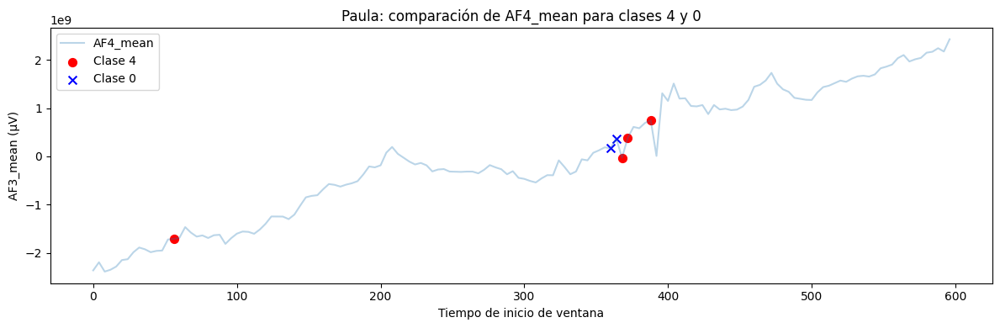

In [ ]:
# Extraemos el DataFrame de Paula
df = features_per_subject['Paula']
df['start_time'] = pd.DataFrame(feat_list)['start_time_s']

# Filtramos las ventanas por clase
class4 = df[df['pred_class'] == 4]
class0 = df[df['pred_class'] == 0]

# Imprimimos los índices (o timestamps) de esas ventanas
print("Paula → ventanas clasificadas como clase 4:")
print(class4.index.tolist())           
print("\nPaula → ventanas clasificadas como clase 0:")
print(class0.index.tolist())

# Gráfica de AF3_mean a lo largo del tiempo para Paula
plt.figure(figsize=(12, 4))
# Serie completa
plt.plot(df['start_time'], df['AF4_mean'], label='AF4_mean', alpha=0.3)
# Destacar clase 4 en rojo
plt.scatter(class4['start_time'], class4['AF4_mean'],
            color='red', label='Clase 4', s=50, marker='o')
# Destacar clase 0 en azul
plt.scatter(class0['start_time'], class0['AF4_mean'],
            color='blue', label='Clase 0', s=50, marker='x')

plt.xlabel('Tiempo de inicio de ventana')
plt.ylabel('AF3_mean (µV)')
plt.title('Paula: comparación de AF4_mean para clases 4 y 0')
plt.legend()
plt.tight_layout()
plt.show()

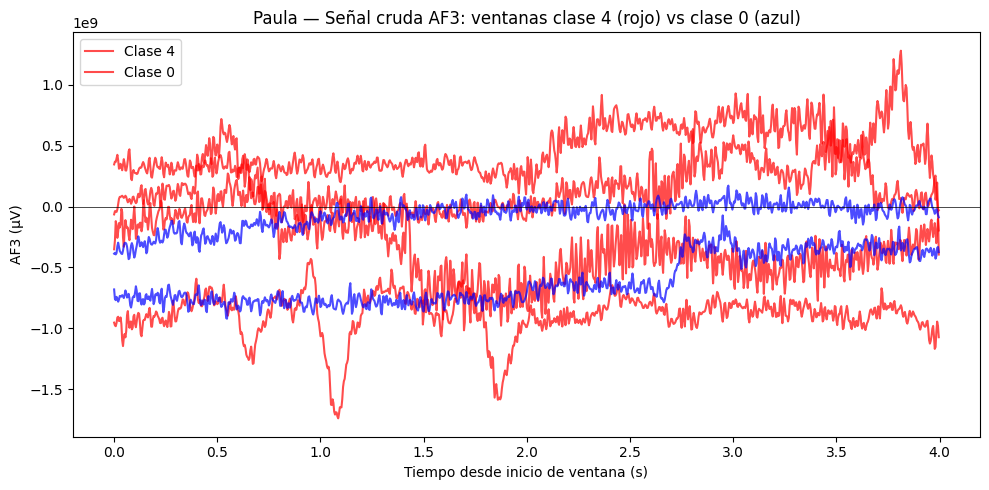

In [ ]:
# Ventanas predichas como 4 y 0 (en segundos)
class4_times = features_per_subject['Paula'].loc[
    features_per_subject['Paula']['pred_class'] == 4, 'start_time'
].values
class0_times = features_per_subject['Paula'].loc[
    features_per_subject['Paula']['pred_class'] == 0, 'start_time'
].values

window_duration = 4.0  # segundos

import matplotlib.pyplot as plt

raw = sujeto1[['time_s', 'AF3']].rename(columns={'AF3':'AF3'})

plt.figure(figsize=(10,5))

# Plot class 4 (rojo)
for t0 in class4_times:
    seg = raw[(raw['time_s'] >= t0) & (raw['time_s'] < t0 + window_duration)]
    plt.plot(seg['time_s'] - t0, seg['AF3'], color='red', alpha=0.7)

# Plot class 0 (azul)
for t0 in class0_times:
    seg = raw[(raw['time_s'] >= t0) & (raw['time_s'] < t0 + window_duration)]
    plt.plot(seg['time_s'] - t0, seg['AF3'], color='blue', alpha=0.7)

plt.axhline(0, color='k', lw=0.5)
plt.xlabel('Tiempo desde inicio de ventana (s)')
plt.ylabel('AF3 (µV)')
plt.title('Paula — Señal cruda AF3: ventanas clase 4 (rojo) vs clase 0 (azul)')
plt.legend(['Clase 4','Clase 0'])
plt.tight_layout()
plt.show()

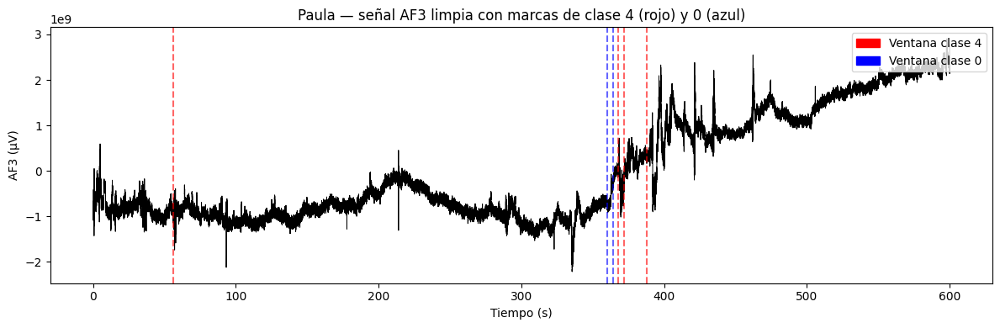

In [ ]:
import matplotlib.pyplot as plt

df_clean = ica_cleaned_dfs['Paula']

# Instantes de ventana (en segundos) donde predijo clase 4 y clase 0
feat = features_per_subject['Paula']
if 'start_time_s' in feat.columns:
    times = feat['start_time_s']
else:
    times = feat['start_time']

class4_times = times[feat['pred_class'] == 4].values
class0_times = times[feat['pred_class'] == 0].values

# Dibujo de la señal completa
plt.figure(figsize=(12, 4))
plt.plot(df_clean['time_s'], df_clean['AF3'], color='k', lw=0.7, label='AF3 limpia')

# Marcar con líneas verticales
for t in class4_times:
    plt.axvline(t, color='red', linestyle='--', alpha=0.6)
for t in class0_times:
    plt.axvline(t, color='blue', linestyle='--', alpha=0.6)

import matplotlib.patches as mpatches
patch4 = mpatches.Patch(color='red', label='Ventana clase 4')
patch0 = mpatches.Patch(color='blue', label='Ventana clase 0')
plt.legend(handles=[patch4, patch0], loc='upper right')

plt.xlabel('Tiempo (s)')
plt.ylabel('AF3 (µV)')
plt.title('Paula — señal AF3 limpia con marcas de clase 4 (rojo) y 0 (azul)')
plt.tight_layout()
plt.show()

---

In [ ]:
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input, Dense, GaussianNoise, LeakyReLU, BatchNormalization, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras import Model
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

def build_model(units_list, input_dim,
                dropout_rate=0.4, l2_reg=1e-3, lr=1e-3):
    inp = Input(shape=(input_dim,))
    x = GaussianNoise(0.1)(inp)
    for units in units_list:
        x = Dense(units,
                  kernel_initializer='he_normal',
                  kernel_regularizer=l2(l2_reg))(x)
        x = LeakyReLU(alpha=0.2)(x)
        x = BatchNormalization()(x)
        x = Dropout(dropout_rate)(x)
    out = Dense(len(classes), activation='softmax')(x)

    model = Model(inp, out)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss=focal_loss(gamma=2.0, alpha=0.25),
        metrics=['accuracy']
    )
    return model

architectures = {
    'small':  [128,  64],
    'medium': [256, 128, 64],
    'large':  [512, 256, 64],
    'xlarge':  [512, 256, 128, 64],
    'xxlarge':  [1024, 512, 256, 128, 64]
}

# Escogemos la arquitectura y el archivo de pesos:
name = 'medium'                   # o 'small', 'large', 'xlarge', 'xxlarge'
units = architectures[name]       
weights_file = f'best_{name}.keras'

# Reconstruimos el modelo y carga pesos:
model_new = build_model(
    units,
    input_dim=X.shape[1],
    dropout_rate=0.5,
    l2_reg=1e-3,
    lr=1e-3
)
model_new.load_weights(weights_file)

# Predicciones:
y_proba = model_new.predict(X)        
y_pred  = np.argmax(y_proba, axis=1)      

# Evaluación:
if 'y_new' in globals():
    cm = confusion_matrix(y, y_pred)
    print("Matriz de Confusión:")
    print(cm)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.title(f'{name} net en datos nuevos')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    print("Classification Report:")
    print(classification_report(y, y_pred, target_names=[str(c) for c in classes]))

----------------------------

COSAS A HACER:

- REVISAR TODO LO QUE ESTÁ RECOGIDO PARA BORRAR
- SVM EJECUTAR EL RBF
- Vision Transformer ( paper Laura )